In [1]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
Accra_Tx = pd.read_csv('Accra_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
Accra_Tn = pd.read_csv('Accra_1960_2022_dTn_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
Kumasi_Tx = pd.read_csv('Kumasi_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
Kumasi_Tn = pd.read_csv('Kumasi_1960_2022_dTn_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
Wenchi_Tx = pd.read_csv('Sunyani_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
Wenchi_Tn = pd.read_csv('Sunyani_1960_2022_dTn_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
Tamale_Tx = pd.read_csv('Yendi_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
Tamale_Tn = pd.read_csv('Yendi_1960_2022_dTn_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
Navrongo_Tx = pd.read_csv('Navrongo_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
Navrongo_Tn = pd.read_csv('Navrongo_1960_2022_dTn_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])


In [4]:
# Navrongo_Tx = pd.read_csv('Navrongo_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
# Yendi_Tx = pd.read_csv('Yendi_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
# Sunyani_Tx = pd.read_csv('Sunyani_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
# Kumasi_Tx = pd.read_csv('Kumasi_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
# Accra_Tx = pd.read_csv('Accra_1960_2022_dTx_complete.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])


In [5]:
Navrongo_Tx

,year,month,day,Tmax
0,1960,1,1,32.2
1,1960,1,2,32.2
2,1960,1,3,32.8
3,1960,1,4,33.3
4,1960,1,5,34.4
...,...,...,...,...
23006,2022,12,27,35.0
23007,2022,12,28,36.0
23008,2022,12,29,35.0
23009,2022,12,30,35.0


In [4]:
Accra_Tn

,year,month,day,Tmin
0,1960,1,1,22.8
1,1960,1,2,22.8
2,1960,1,3,21.1
3,1960,1,4,22.8
4,1960,1,5,22.8
...,...,...,...,...
23006,2022,12,27,24.0
23007,2022,12,28,24.5
23008,2022,12,29,25.5
23009,2022,12,30,25.0


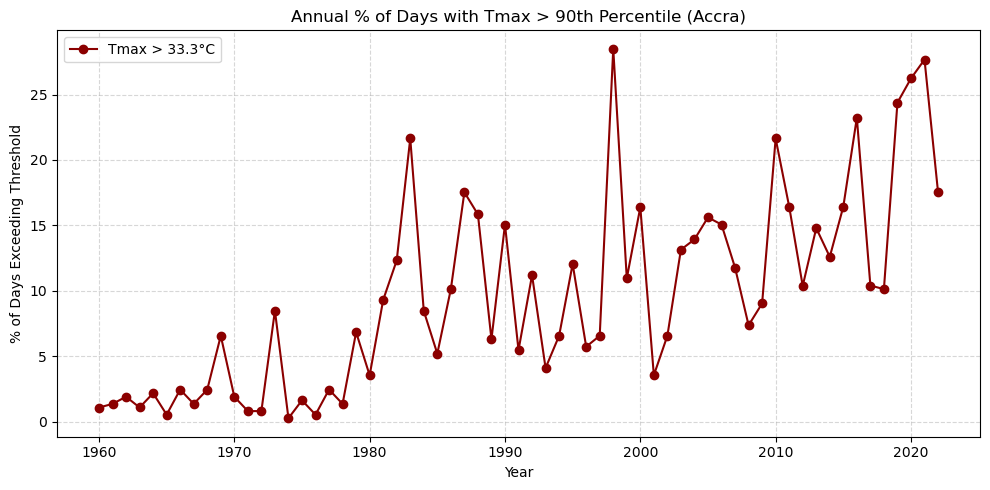

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
Accra_Tx = pd.read_csv('Accra_1960_2022_dTx_complete.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])

# Create datetime index
Accra_Tx['date'] = pd.to_datetime(Accra_Tx[['year', 'month', 'day']])
Accra_Tx.set_index('date', inplace=True)

# Drop missing or invalid values if any
Accra_Tx = Accra_Tx.dropna(subset=['Tmax'])

# Compute 90th percentile over the entire period
threshold_90 = np.percentile(Accra_Tx['Tmax'], 90)

# Identify exceedances
Accra_Tx['exceed'] = Accra_Tx['Tmax'] > threshold_90

# Group by year and compute % exceedance
annual_exceedance = Accra_Tx.groupby(Accra_Tx.index.year)['exceed'].mean() * 100

# Plot
plt.figure(figsize=(10, 5))
plt.plot(annual_exceedance.index, annual_exceedance.values, marker='o', color='darkred', label=f'Tmax > {threshold_90:.1f}°C')
plt.title('Annual % of Days with Tmax > 90th Percentile (Accra)')
plt.xlabel('Year')
plt.ylabel('% of Days Exceeding Threshold')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


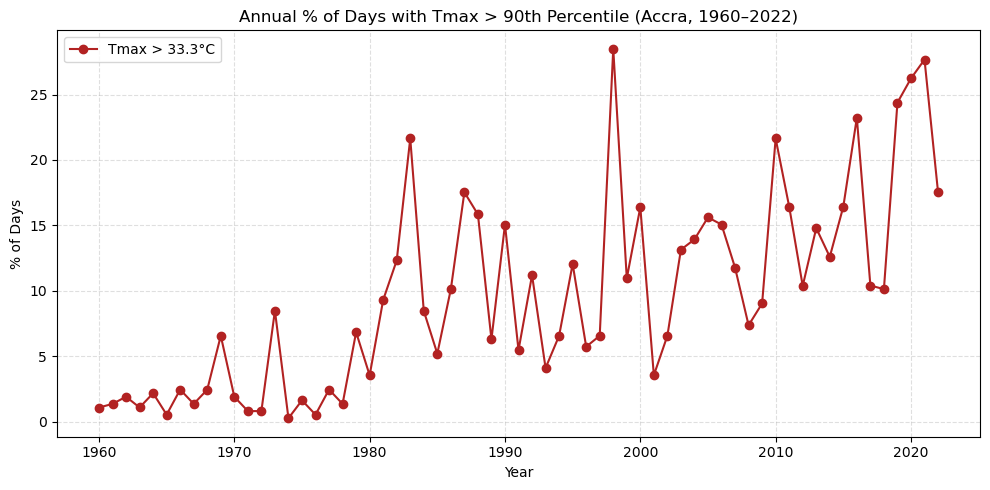

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load data
Accra_Tx = pd.read_csv('Accra_1960_2022_dTx_complete.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])

# Create datetime index
Accra_Tx['date'] = pd.to_datetime(Accra_Tx[['year', 'month', 'day']], errors='coerce')
Accra_Tx.dropna(subset=['date'], inplace=True)
Accra_Tx.set_index('date', inplace=True)

# Filter data for 1960–2022 only
#Accra_Tx = Accra_Tx[(Accra_Tx.index.year >= 1960) & (Accra_Tx.index.year <= 2022)]

# Drop missing Tmax values
Accra_Tx = Accra_Tx.dropna(subset=['Tmax'])

# Compute 90th percentile over 1960–2022
threshold_90 = np.percentile(Accra_Tx['Tmax'], 90)

# Determine if each day exceeds the 90th percentile
Accra_Tx['exceed'] = Accra_Tx['Tmax'] > threshold_90

# Group by year and compute % exceedance
annual_exceedance = Accra_Tx.groupby(Accra_Tx.index.year)['exceed'].mean() * 100

# Plot
plt.figure(figsize=(10, 5))
plt.plot(annual_exceedance.index, annual_exceedance.values, marker='o', color='firebrick', label=f'Tmax > {threshold_90:.1f}°C')
plt.title('Annual % of Days with Tmax > 90th Percentile (Accra, 1960–2022)')
plt.xlabel('Year')
plt.ylabel('% of Days')
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


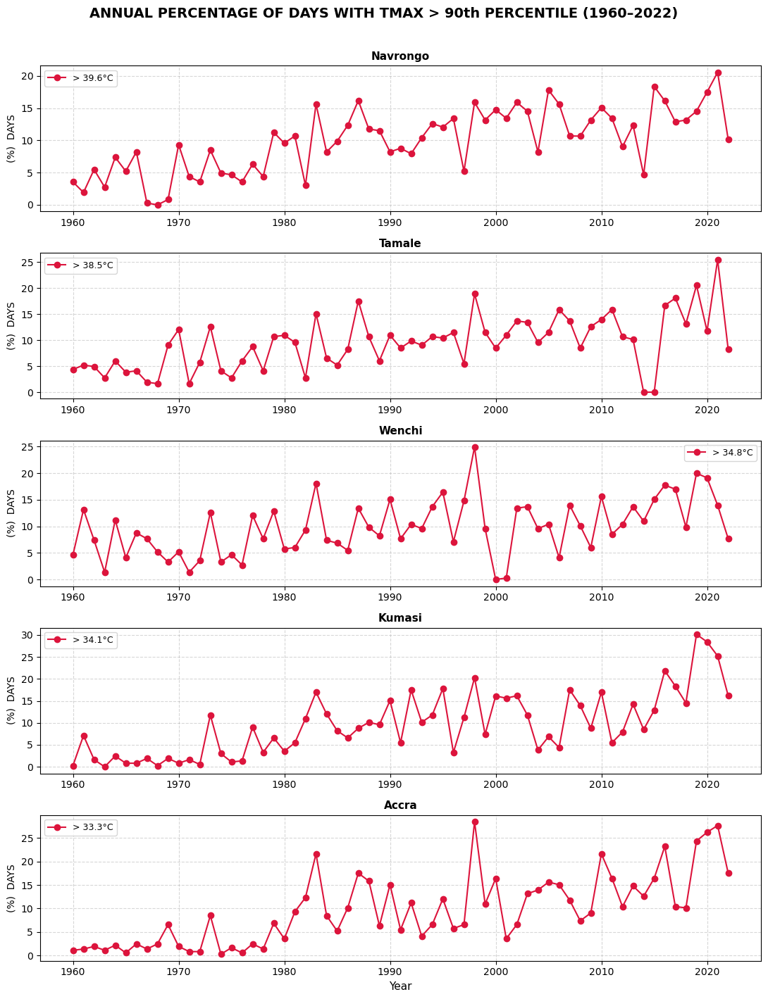

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station file paths and metadata
stations = {
    'Navrongo': 'Navrongo_1960_2022_dTx_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTx_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTx_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTx_complete.txt',
    'Accra': 'Accra_1960_2022_dTx_complete.txt',
}

# Create figure
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations.items()):
    # Load and preprocess
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmax'])

    # 90th percentile threshold
    p90 = np.percentile(df['Tmax'], 90)
    df['exceed'] = df['Tmax'] > p90

    # Compute annual exceedance %
    annual_exceed = df.groupby(df.index.year)['exceed'].mean() * 100

    # Plot
    ax = axes[i]
    ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='crimson', label=f'> {p90:.1f}°C')
    ax.set_title(f"{name}", fontweight='bold',fontsize=11)
    ax.set_ylabel('(%)  DAYS', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(fontsize=9)

# Final formatting
axes[-1].set_xlabel('Year', fontsize=11)
fig.suptitle("ANNUAL PERCENTAGE OF DAYS WITH TMAX > 90th PERCENTILE (1960–2022)",fontweight='bold', fontsize=14, y=1.01)
plt.tight_layout()
# fig.savefig('percent.png', bbox_inches='tight')
plt.show()


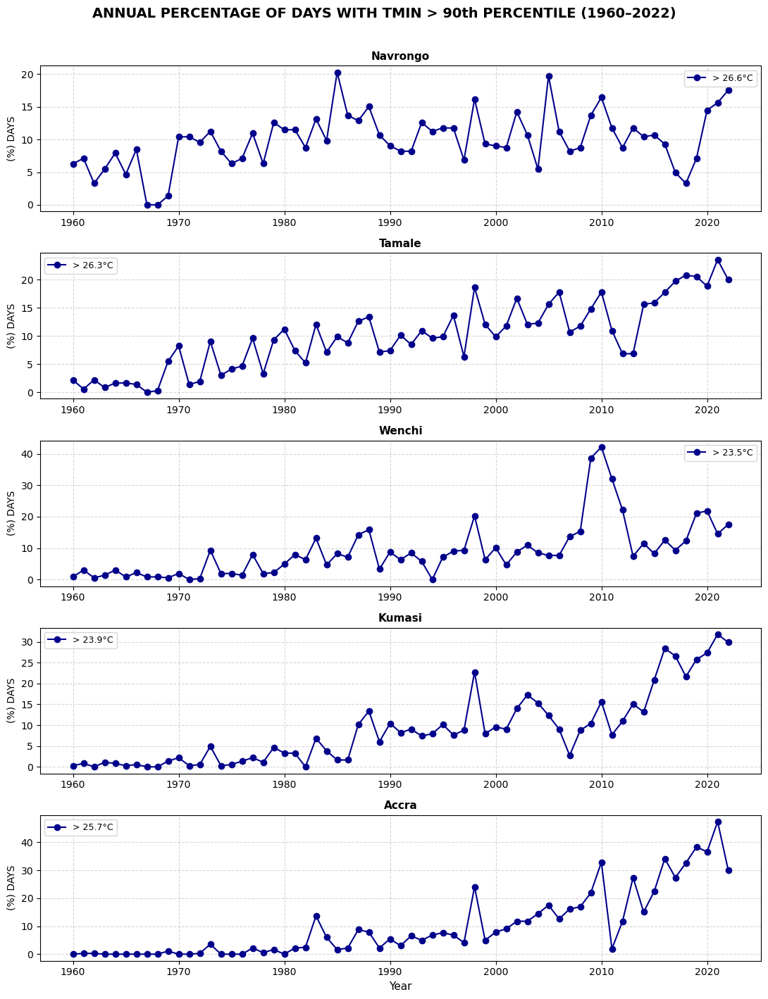

In [8]:

# Station Tmin file paths
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2022_dTn_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTn_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTn_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTn_complete.txt',
    'Accra': 'Accra_1960_2022_dTn_complete.txt',
}

# Create subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations_tmin.items()):
    # Load and preprocess
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmin'])

    # Calculate 90th percentile
    p90 = np.percentile(df['Tmin'], 90)
    df['exceed'] = df['Tmin'] > p90

    # Annual exceedance percentage
    annual_exceed = df.groupby(df.index.year)['exceed'].mean() * 100

    # Plotting
    ax = axes[i]
    ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='darkblue', label=f'> {p90:.1f}°C')
    ax.set_title(f"{name}",fontweight='bold', fontsize=11)
    ax.set_ylabel('(%) DAYS', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(fontsize=9)

# Final formatting
axes[-1].set_xlabel('Year', fontsize=11)
fig.suptitle("ANNUAL PERCENTAGE OF DAYS WITH TMIN > 90th PERCENTILE (1960–2022)",fontweight='bold', fontsize=14, y=1.01)
plt.tight_layout()
# fig.savefig('percentmin.png', bbox_inches='tight')
plt.show()


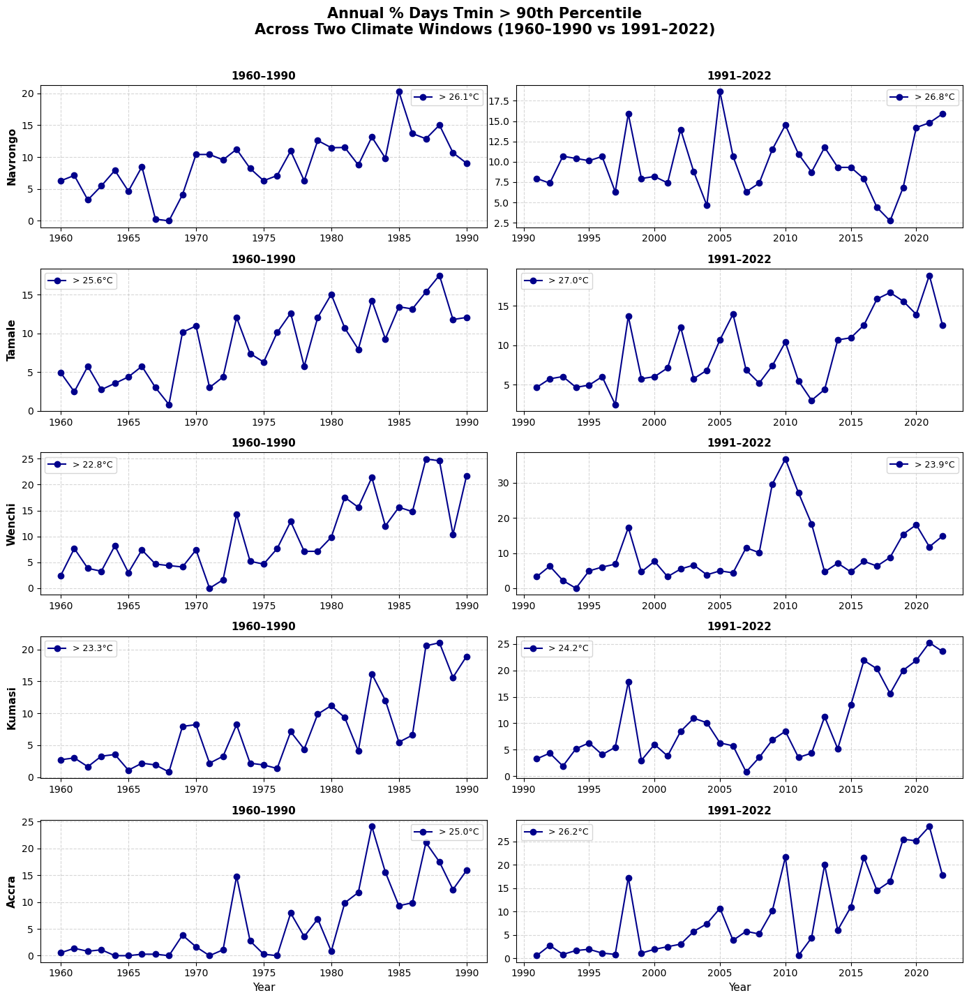

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station Tmin file paths
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2022_dTn_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTn_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTn_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTn_complete.txt',
    'Accra': 'Accra_1960_2022_dTn_complete.txt',
}

# Time windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Set up 5x2 subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False, sharey=False)

for row_idx, (station, file) in enumerate(stations_tmin.items()):
    # Load and preprocess
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df.dropna(subset=['Tmin'])

    for col_idx, (label, (start_year, end_year)) in enumerate(windows.items()):
        # Filter by window
        subset = df[(df.index.year >= start_year) & (df.index.year <= end_year)].copy()

        # Compute window-specific 90th percentile
        p90 = np.percentile(subset['Tmin'], 90)
        subset['exceed'] = subset['Tmin'] > p90

        # Annual exceedance %
        annual_exceed = subset.groupby(subset.index.year)['exceed'].mean() * 100

        # Plotting
        ax = axes[row_idx, col_idx]
        ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='darkblue', label=f'> {p90:.1f}°C')
        if col_idx == 0:
            ax.set_ylabel(f"{station}", fontsize=11, fontweight='bold')
        ax.set_title(f"{label}", fontsize=11, fontweight='bold')
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=9)

# Global labels
for ax in axes[-1, :]:
    ax.set_xlabel("Year", fontsize=11)

fig.suptitle("Annual % Days Tmin > 90th Percentile\nAcross Two Climate Windows (1960–1990 vs 1991–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
# fig.savefig('percentmin_split_windows.png', bbox_inches='tight')
plt.show()


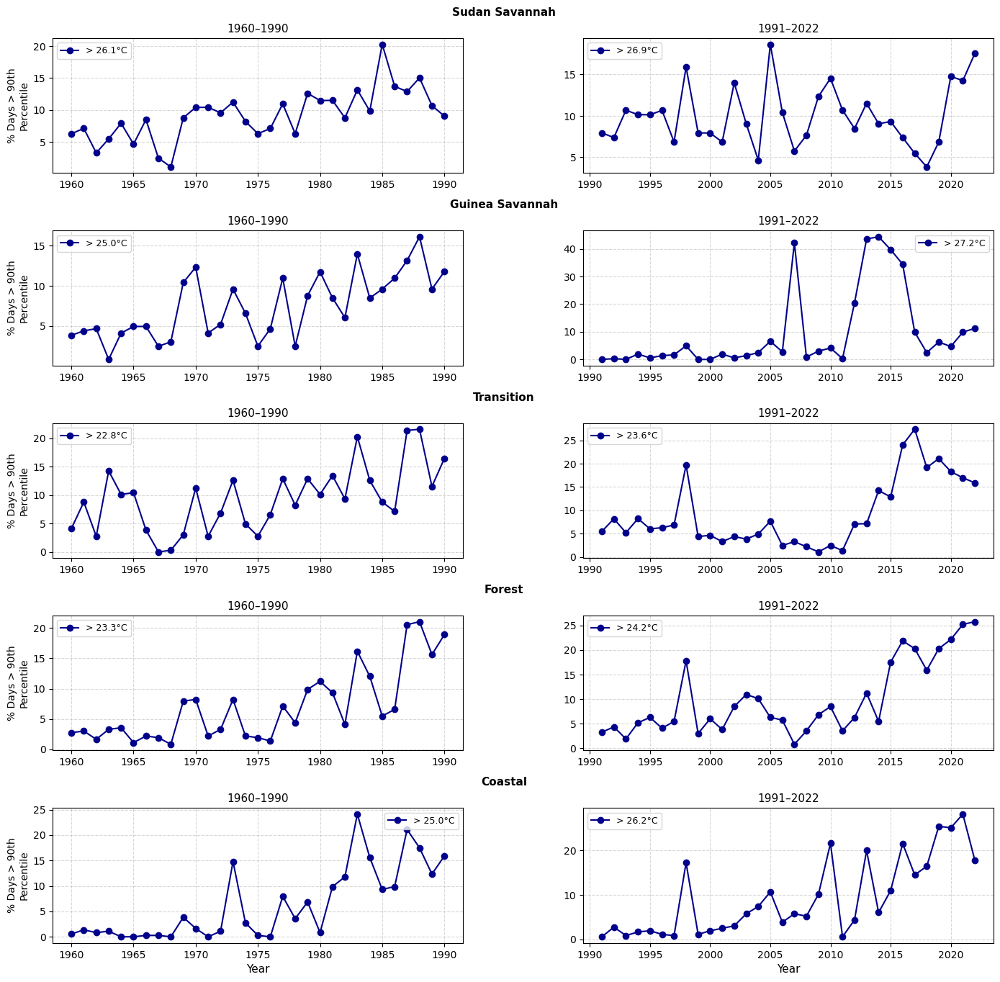

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station Tmin file paths
stations_tmin = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTn_complete.txt',
    'Guinea Savannah': 'Yendi_1960_2022_dTn_complete.txt',
    'Transition': 'Sunyani_1960_2022_dTn_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTn_complete.txt',
    'Coastal': 'Accra_1960_2022_dTn_complete.txt',
}

# Time windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Set up 5x2 subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False, sharey=False)

for row_idx, (station, file) in enumerate(stations_tmin.items()):
    # Load and preprocess
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df.dropna(subset=['Tmin'])

    for col_idx, (label, (start_year, end_year)) in enumerate(windows.items()):
        # Filter by window
        subset = df[(df.index.year >= start_year) & (df.index.year <= end_year)].copy()

        # Compute window-specific 90th percentile
        p90 = np.percentile(subset['Tmin'], 90)
        subset['exceed'] = subset['Tmin'] > p90

        # Annual exceedance %
        annual_exceed = subset.groupby(subset.index.year)['exceed'].mean() * 100

        # Plotting
        ax = axes[row_idx, col_idx]
        ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='darkblue', label=f'> {p90:.1f}°C')

        # Add window title
        ax.set_title(f"{label}", fontsize=11)

        # Y-axis label only on first column
        if col_idx == 0:
            ax.set_ylabel('% Days > 90th\nPercentile', fontsize=10)

        if col_idx == 0:
            ax.annotate(station, xy=(1.1, 1.15), xycoords='axes fraction',
                ha='center', va='bottom', fontsize=11, fontweight='bold')

        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=9)

# Global labels
for ax in axes[-1, :]:
    ax.set_xlabel("Year", fontsize=11)

#fig.suptitle("ANNUAL % OF DAYS WITH TMIN > 90TH PERCENTILE ACROSS TWO CLIMATE WINDOWS\n(1990 vs 1991–2022)", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
fig.savefig('min_split_windows.png', bbox_inches='tight')
plt.show()


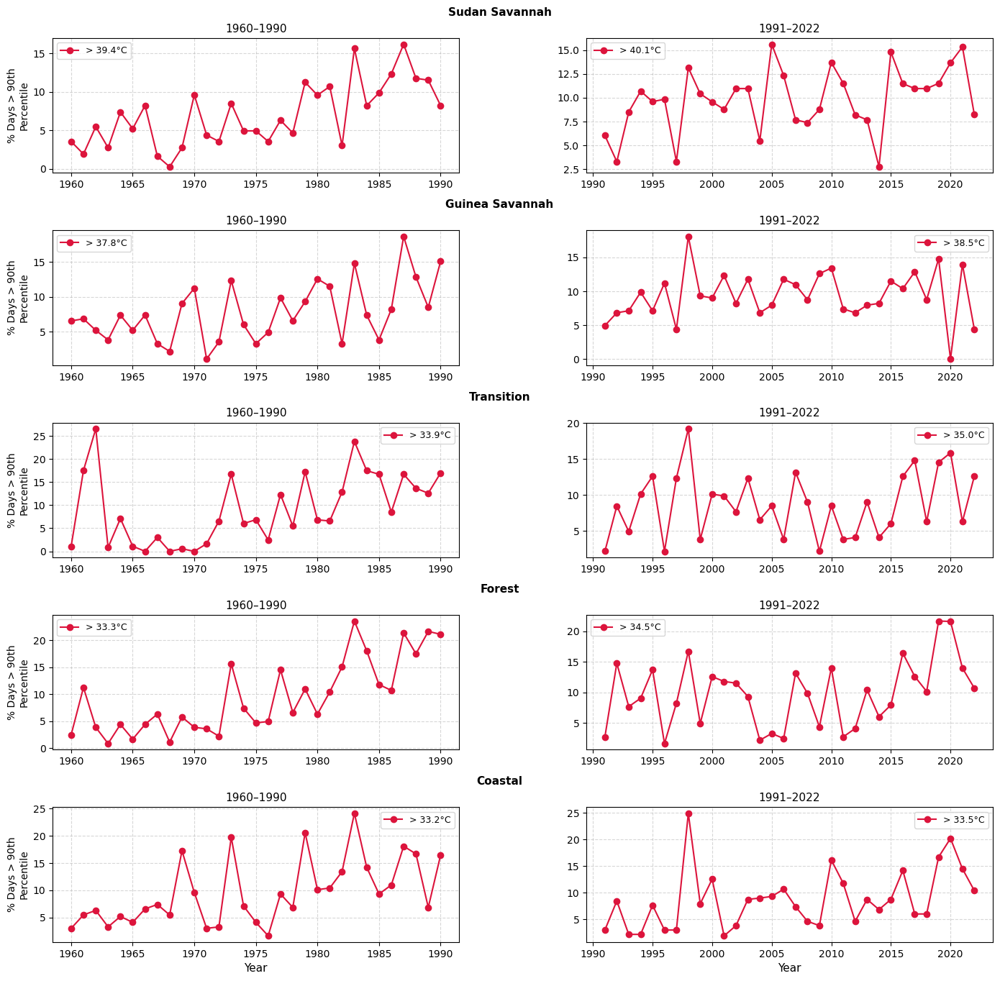

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station Tmin file paths
stations_tmin = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTx_complete.txt',
    'Guinea Savannah': 'Yendi_1960_2022_dTx_complete.txt',
    'Transition': 'Sunyani_1960_2022_dTx_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTx_complete.txt',
    'Coastal': 'Accra_1960_2022_dTx_complete.txt',
}

# Time windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Set up 5x2 subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False, sharey=False)

for row_idx, (station, file) in enumerate(stations_tmin.items()):
    # Load and preprocess
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df.dropna(subset=['Tmax'])

    for col_idx, (label, (start_year, end_year)) in enumerate(windows.items()):
        # Filter by window
        subset = df[(df.index.year >= start_year) & (df.index.year <= end_year)].copy()

        # Compute window-specific 90th percentile
        p90 = np.percentile(subset['Tmax'], 90)
        subset['exceed'] = subset['Tmax'] > p90

        # Annual exceedance %
        annual_exceed = subset.groupby(subset.index.year)['exceed'].mean() * 100

        # Plotting
        ax = axes[row_idx, col_idx]
        ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='crimson', label=f'> {p90:.1f}°C')

        # Add window title
        ax.set_title(f"{label}", fontsize=11)

        # Y-axis label only on first column
        if col_idx == 0:
            ax.set_ylabel('% Days > 90th\nPercentile', fontsize=10)

        if col_idx == 0:
            ax.annotate(station, xy=(1.1, 1.15), xycoords='axes fraction',
                ha='center', va='bottom', fontsize=11, fontweight='bold')

        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=9)

# Global labels
for ax in axes[-1, :]:
    ax.set_xlabel("Year", fontsize=11)

#fig.suptitle("ANNUAL % OF DAYS WITH TMAX > 90TH PERCENTILE ACROSS TWO CLIMATE WINDOWS\n(1990 vs 1991–2022)", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
fig.savefig('max_split_windows.png', bbox_inches='tight')
plt.show()


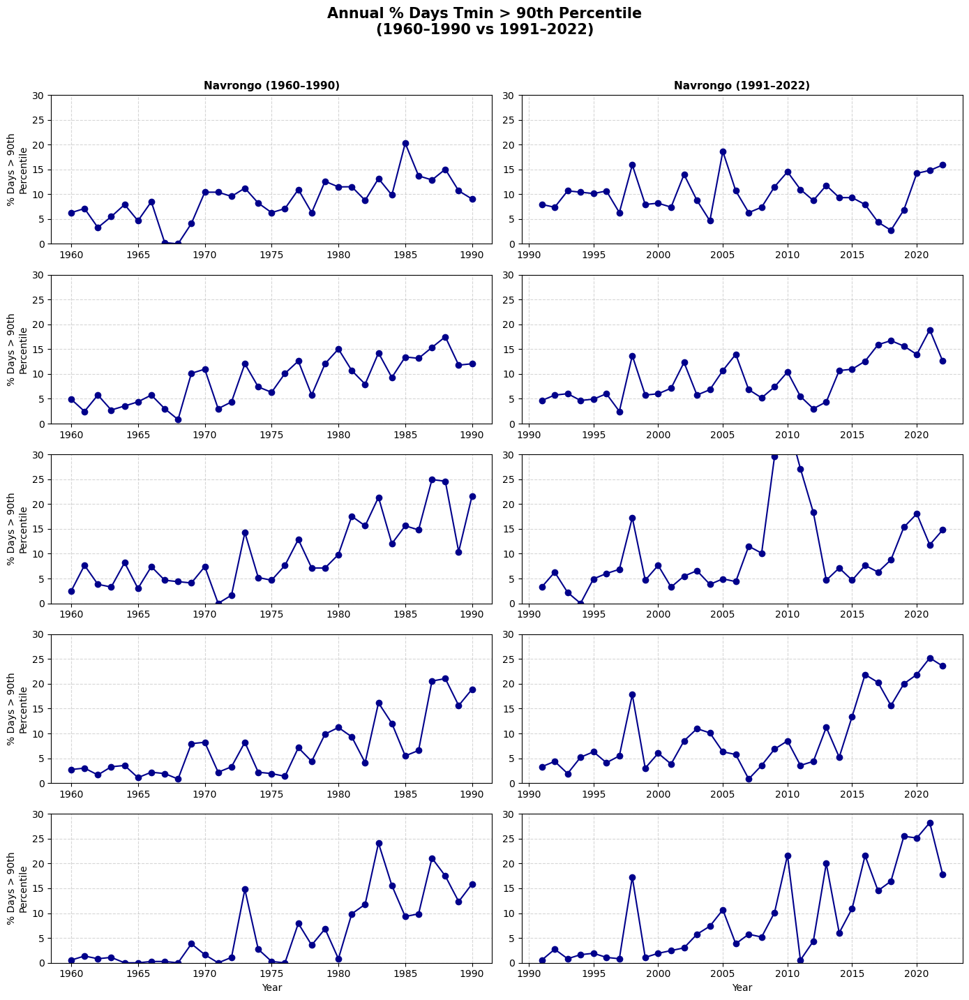

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station Tmin file paths
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2022_dTn_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTn_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTn_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTn_complete.txt',
    'Accra': 'Accra_1960_2022_dTn_complete.txt',
}

# Time windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Create 5x2 subplot grid
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False, sharey=False)

for row_idx, (station, file) in enumerate(stations_tmin.items()):
    # Load and clean
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df.dropna(subset=['Tmin'])

    for col_idx, (label, (start_year, end_year)) in enumerate(windows.items()):
        # Subset by time window
        subset = df[(df.index.year >= start_year) & (df.index.year <= end_year)].copy()

        # 90th percentile threshold for that window
        p90 = np.percentile(subset['Tmin'], 90)
        subset['exceed'] = subset['Tmin'] > p90

        # Annual % exceedance
        annual_exceed = subset.groupby(subset.index.year)['exceed'].mean() * 100

        # Plot
        ax = axes[row_idx, col_idx]
        ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='darkblue', label=f'> {p90:.1f}°C')
        ax.set_ylim(0, 30)
        ax.grid(True, linestyle='--', alpha=0.5)

        # Titles
        if row_idx == 0:
            ax.set_title(f"{station} ({label})", fontsize=11, fontweight='bold')

        # Y-axis label
        if col_idx == 0:
            ax.set_ylabel('% Days > 90th\nPercentile', fontsize=10)

        # X-axis label only on bottom row
        if row_idx == 4:
            ax.set_xlabel("Year", fontsize=10)

# Final touches
fig.suptitle("Annual % Days Tmin > 90th Percentile\n(1960–1990 vs 1991–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.93)
# fig.savefig('percentmin_split_windows_refined.png', bbox_inches='tight')
plt.show()


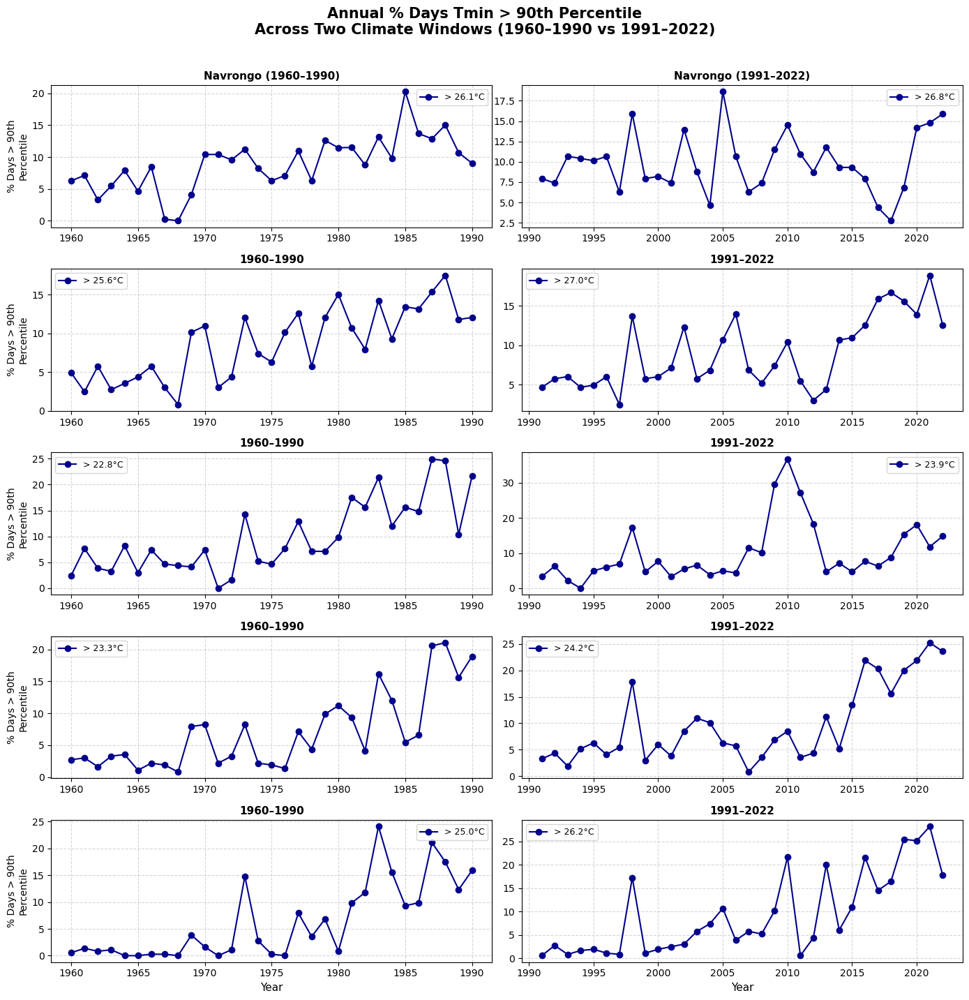

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station Tmin file paths
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2022_dTn_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTn_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTn_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTn_complete.txt',
    'Accra': 'Accra_1960_2022_dTn_complete.txt',
}

# Time windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Set up 5x2 subplots
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False, sharey=False)

for row_idx, (station, file) in enumerate(stations_tmin.items()):
    # Load and preprocess
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df.dropna(subset=['Tmin'])

    for col_idx, (label, (start_year, end_year)) in enumerate(windows.items()):
        # Filter by window
        subset = df[(df.index.year >= start_year) & (df.index.year <= end_year)].copy()

        # Compute window-specific 90th percentile
        p90 = np.percentile(subset['Tmin'], 90)
        subset['exceed'] = subset['Tmin'] > p90

        # Annual exceedance %
        annual_exceed = subset.groupby(subset.index.year)['exceed'].mean() * 100

        # Plotting
        ax = axes[row_idx, col_idx]
        ax.plot(annual_exceed.index, annual_exceed.values, marker='o', color='darkblue', label=f'> {p90:.1f}°C')

        # Set titles and labels
        if col_idx == 0:
            ax.set_ylabel('% Days > 90th\nPercentile', fontsize=10)

        if row_idx == 0:
            ax.set_title(f"{station} ({label})", fontsize=11, fontweight='bold')
        else:
            ax.set_title(f"{label}", fontsize=11, fontweight='bold')

        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=9)

# Global labels
for ax in axes[-1, :]:
    ax.set_xlabel("Year", fontsize=11)

fig.suptitle("Annual % Days Tmin > 90th Percentile\nAcross Two Climate Windows (1960–1990 vs 1991–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
# fig.savefig('percentmin_split_windows.png', bbox_inches='tight')
plt.show()


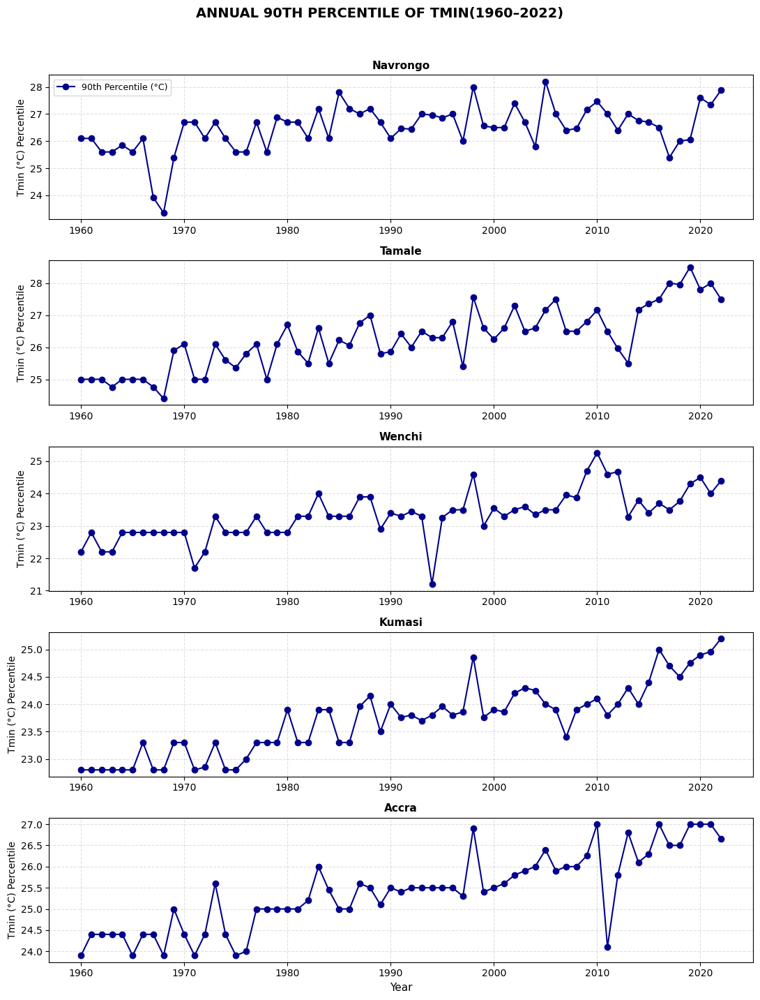

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths for Tmin
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2022_dTn_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTn_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTn_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTn_complete.txt',
    'Accra': 'Accra_1960_2022_dTn_complete.txt',
}

# Set up subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations_tmin.items()):
    # Load and format
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmin'])

    # Group by year and compute 90th percentile
    yearly_data = df.groupby(df.index.year)
    annual_90th = yearly_data['Tmin'].quantile(0.9)

    # Plot
    ax = axes[i]
    ax.plot(annual_90th.index, annual_90th.values, 'o-', color='darkblue', label='90th Percentile (°C)')
    ax.set_ylabel('Tmin (°C) Percentile')
    ax.set_title(f"{name}", fontweight='bold', fontsize=11)
    ax.grid(True, linestyle='--', alpha=0.4)

    if i == 0:
        ax.legend(loc='best', fontsize=9)

# Global X label and title
axes[-1].set_xlabel("Year", fontsize=11)
fig.suptitle("ANNUAL 90TH PERCENTILE OF TMIN(1960–2022)", fontweight='bold',fontsize=14, y=1.02)
plt.tight_layout()
# fig.savefig('tmin_annual90th_only.png', bbox_inches='tight')
plt.show()


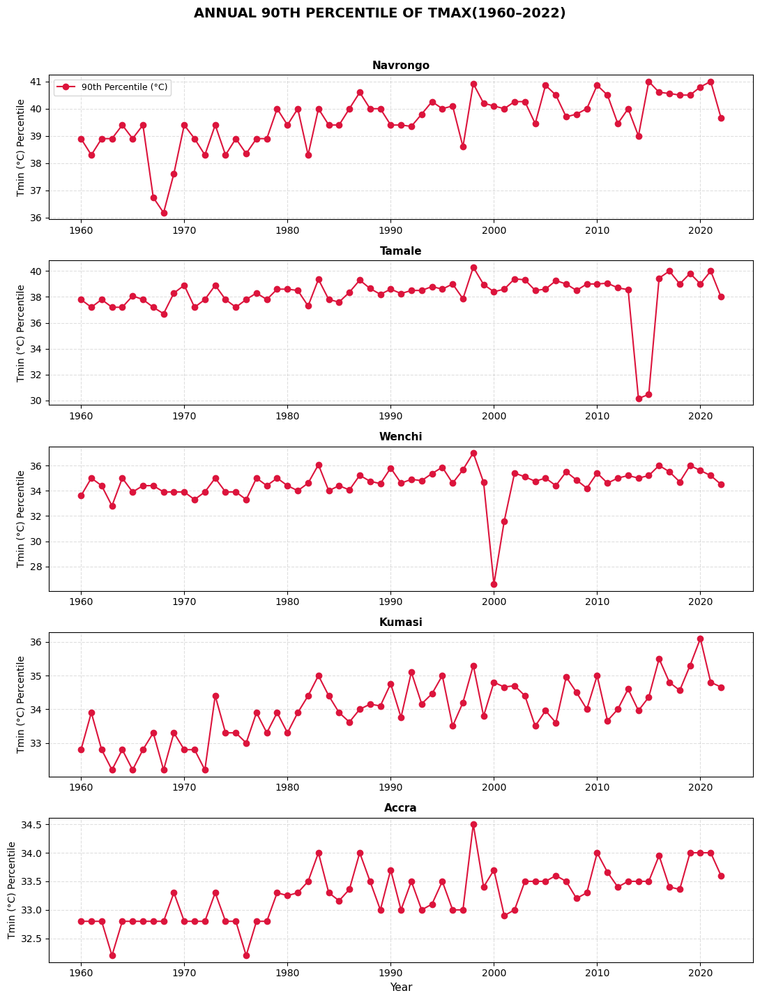

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths for Tmin
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2022_dTx_complete.txt',
    'Tamale': 'Tamale_1960_2022_dTx_complete.txt',
    'Wenchi': 'Wenchi_1960_2022_dTx_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTx_complete.txt',
    'Accra': 'Accra_1960_2022_dTx_complete.txt',
}

# Set up subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations_tmin.items()):
    # Load and format
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmax'])

    # Group by year and compute 90th percentile
    yearly_data = df.groupby(df.index.year)
    annual_90th = yearly_data['Tmax'].quantile(0.9)

    # Plot
    ax = axes[i]
    ax.plot(annual_90th.index, annual_90th.values, 'o-', color='crimson', label='90th Percentile (°C)')
    ax.set_ylabel('Tmin (°C) Percentile')
    ax.set_title(f"{name}", fontweight='bold', fontsize=11)
    ax.grid(True, linestyle='--', alpha=0.4)

    if i == 0:
        ax.legend(loc='best', fontsize=9)

# Global X label and title
axes[-1].set_xlabel("Year", fontsize=11)
fig.suptitle("ANNUAL 90TH PERCENTILE OF TMAX(1960–2022)", fontweight='bold',fontsize=14, y=1.02)
plt.tight_layout()
# fig.savefig('tmax_annual90th_only.png', bbox_inches='tight')
plt.show()

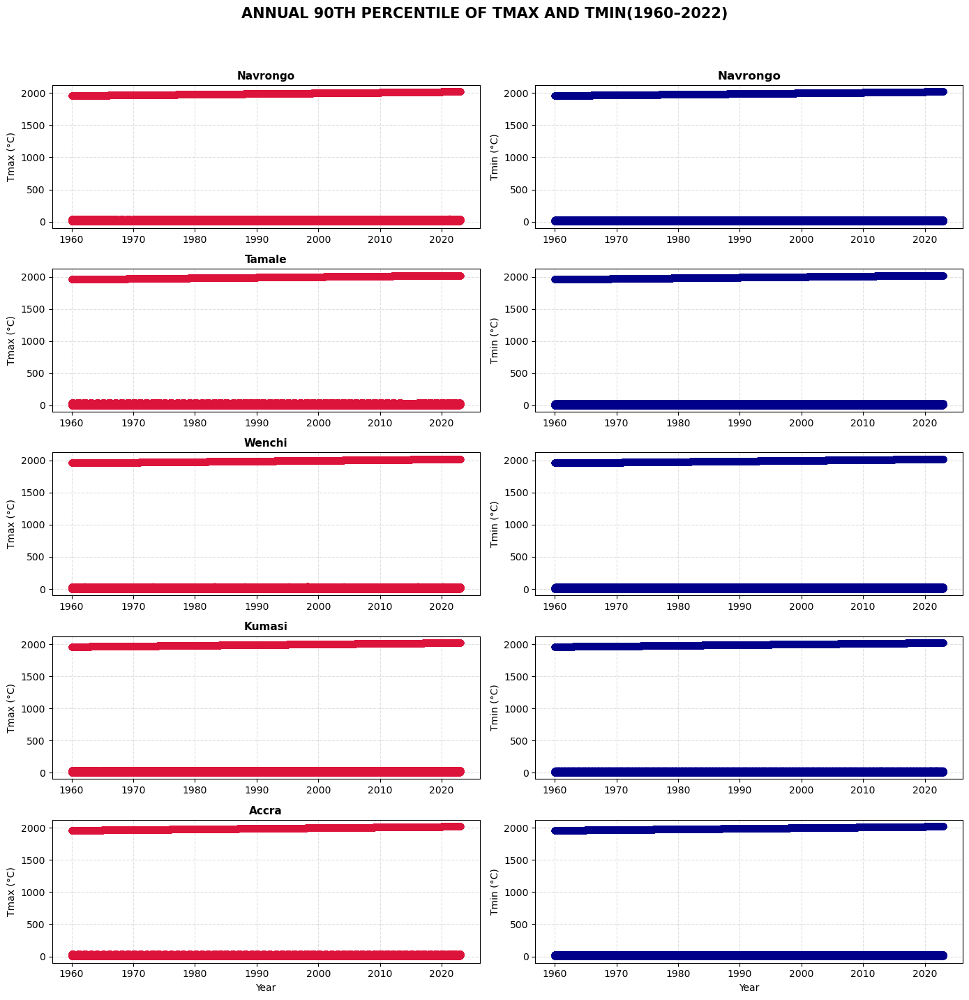

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths for Tmax and Tmin
stations = {
    'Navrongo': ('Navrongo_1960_2022_dTx_complete.txt', 'Navrongo_1960_2022_dTn_complete.txt'),
    'Tamale':   ('Tamale_1960_2022_dTx_complete.txt',   'Tamale_1960_2022_dTn_complete.txt'),
    'Wenchi':   ('Wenchi_1960_2022_dTx_complete.txt',   'Wenchi_1960_2022_dTn_complete.txt'),
    'Kumasi':   ('Kumasi_1960_2022_dTx_complete.txt',   'Kumasi_1960_2022_dTn_complete.txt'),
    'Accra':    ('Accra_1960_2022_dTx_complete.txt',    'Accra_1960_2022_dTn_complete.txt'),
}

# Create subplot: 5 rows x 2 columns (Tmax on left, Tmin on right)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False)

for i, (station, (file_tx, file_tn)) in enumerate(stations.items()):
    # --- Tmax processing ---
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
    df_tx.dropna(subset=['date'], inplace=True)
    df_tx.set_index('date', inplace=True)
    # df_tx = df_tx[(df_tx.index.year >= 1960) & (df_tx.index.year <= 2022)].dropna(subset=['Tmax'])

    annual_90th_tx = df_tx.groupby(df_tx.index.year)['Tmax'].mean()

    ax_tx = axes[i, 0]
    ax_tx.plot(annual_90th_tx.index, annual_90th_tx.values, 'o-', color='crimson', label='90th Percentile (°C)')
    ax_tx.set_ylabel('Tmax (°C)', fontsize=10)
    ax_tx.grid(True, linestyle='--', alpha=0.4)
    if i == 0:
        ax_tx.set_title("Tmax 90th Percentile", fontweight='bold', fontsize=12)
    if i == 4:
        ax_tx.set_xlabel("Year", fontsize=10)
    ax_tx.set_title(f"{station}", fontsize=11, fontweight='bold', loc='center')

    # --- Tmin processing ---
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df_tn['date'] = pd.to_datetime(df_tn[['year', 'month', 'day']], errors='coerce')
    df_tn.dropna(subset=['date'], inplace=True)
    df_tn.set_index('date', inplace=True)
    # df_tn = df_tn[(df_tn.index.year >= 1960) & (df_tn.index.year <= 2022)].dropna(subset=['Tmin'])

    annual_90th_tn = df_tn.groupby(df_tn.index.year)['Tmin'].mean()

    ax_tn = axes[i, 1]
    ax_tn.plot(annual_90th_tn.index, annual_90th_tn.values, 'o-', color='darkblue', label='90th Percentile (°C)')
    ax_tn.set_ylabel('Tmin (°C)', fontsize=10)
    ax_tn.grid(True, linestyle='--', alpha=0.4)
    if i == 0:
        ax_tn.set_title(f"{station}", fontweight='bold', fontsize=12)
    if i == 4:
        ax_tn.set_xlabel("Year", fontsize=10)

# Final touches
fig.suptitle("ANNUAL 90TH PERCENTILE OF TMAX AND TMIN(1960–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
# fig.savefig("tmax_tmin_annual_90th_dual.png", bbox_inches='tight')
plt.show()


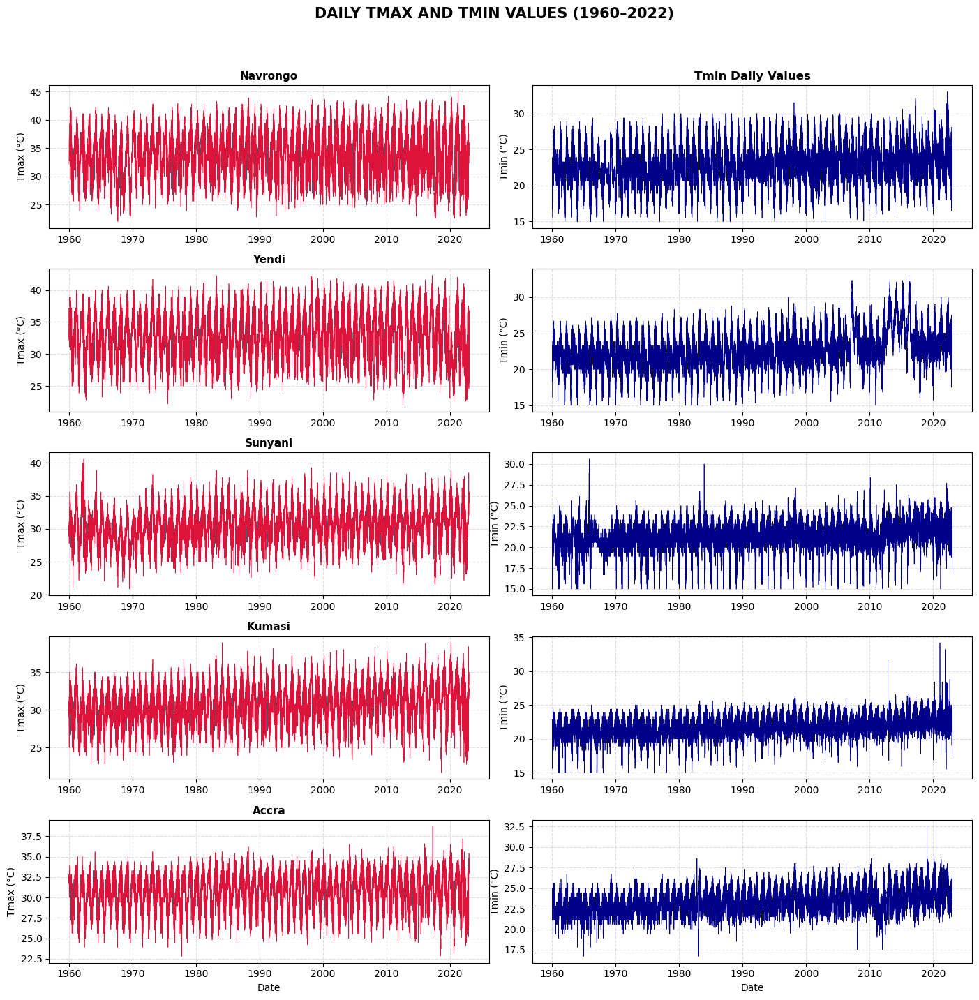

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# File paths for Tmax and Tmin
stations = {
    'Navrongo': ('Navrongo_1960_2022_dTx_complete.txt', 'Navrongo_1960_2022_dTn_complete.txt'),
    'Yendi':   ('Yendi_1960_2022_dTx_complete.txt',   'Yendi_1960_2022_dTn_complete.txt'),
    'Sunyani':   ('Sunyani_1960_2022_dTx_complete.txt',   'Sunyani_1960_2022_dTn_complete.txt'),
    'Kumasi':   ('Kumasi_1960_2022_dTx_complete.txt',   'Kumasi_1960_2022_dTn_complete.txt'),
    'Accra':    ('Accra_1960_2022_dTx_complete.txt',    'Accra_1960_2022_dTn_complete.txt'),
}

# Create subplot: 5 rows x 2 columns (Tmax on left, Tmin on right)
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False)

for i, (station, (file_tx, file_tn)) in enumerate(stations.items()):
    # --- Tmax: load and plot raw daily values ---
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
    df_tx.dropna(subset=['date'], inplace=True)
    df_tx.set_index('date', inplace=True)

    ax_tx = axes[i, 0]
    ax_tx.plot(df_tx.index, df_tx['Tmax'], color='crimson', linewidth=0.5)
    ax_tx.set_ylabel('Tmax (°C)', fontsize=10)
    ax_tx.grid(True, linestyle='--', alpha=0.4)
    if i == 0:
        ax_tx.set_title("Tmax Daily Values", fontweight='bold', fontsize=12)
    if i == 4:
        ax_tx.set_xlabel("Date", fontsize=10)
    ax_tx.set_title(f"{station}", fontsize=11, fontweight='bold', loc='center')

    # --- Tmin: load and plot raw daily values ---
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df_tn['date'] = pd.to_datetime(df_tn[['year', 'month', 'day']], errors='coerce')
    df_tn.dropna(subset=['date'], inplace=True)
    df_tn.set_index('date', inplace=True)

    ax_tn = axes[i, 1]
    ax_tn.plot(df_tn.index, df_tn['Tmin'], color='darkblue', linewidth=0.5)
    ax_tn.set_ylabel('Tmin (°C)', fontsize=10)
    ax_tn.grid(True, linestyle='--', alpha=0.4)
    if i == 0:
        ax_tn.set_title("Tmin Daily Values", fontweight='bold', fontsize=12)
    if i == 4:
        ax_tn.set_xlabel("Date", fontsize=10)

# Final touches
fig.suptitle("DAILY TMAX AND TMIN VALUES (1960–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
# fig.savefig("daily_tmax_tmin_allstations.png", bbox_inches='tight', dpi=400)
plt.show()


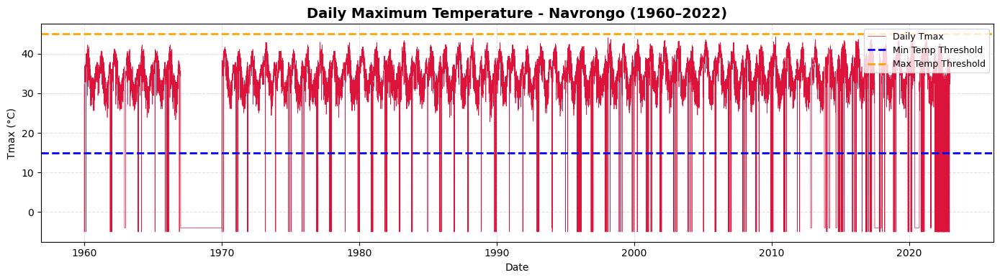

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Load Navrongo Tmax file
file_tx = 'Navrongo_flagging_dTx_QC.txt'

# Read and format
df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
df_tx.dropna(subset=['date'], inplace=True)
df_tx.set_index('date', inplace=True)

# Plot
plt.figure(figsize=(14, 4))
plt.plot(df_tx.index, df_tx['Tmax'], color='crimson', linewidth=0.5, label='Daily Tmax')

# Add threshold lines
plt.axhline(15, color='blue', linestyle='--', linewidth=2, label='Min Temp Threshold')
plt.axhline(45, color='orange', linestyle='--', linewidth=2, label='Max Temp Threshold')

# Styling
plt.title("Daily Maximum Temperature - Navrongo (1960–2022)", fontsize=14, fontweight='bold')
plt.xlabel("Date", fontsize=10)
plt.ylabel("Tmax (°C)", fontsize=10)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc='upper right', fontsize=9)
plt.tight_layout()
# plt.savefig("Navrongo_daily_Tmax_thresholds.png", dpi=400, bbox_inches='tight')
plt.show()


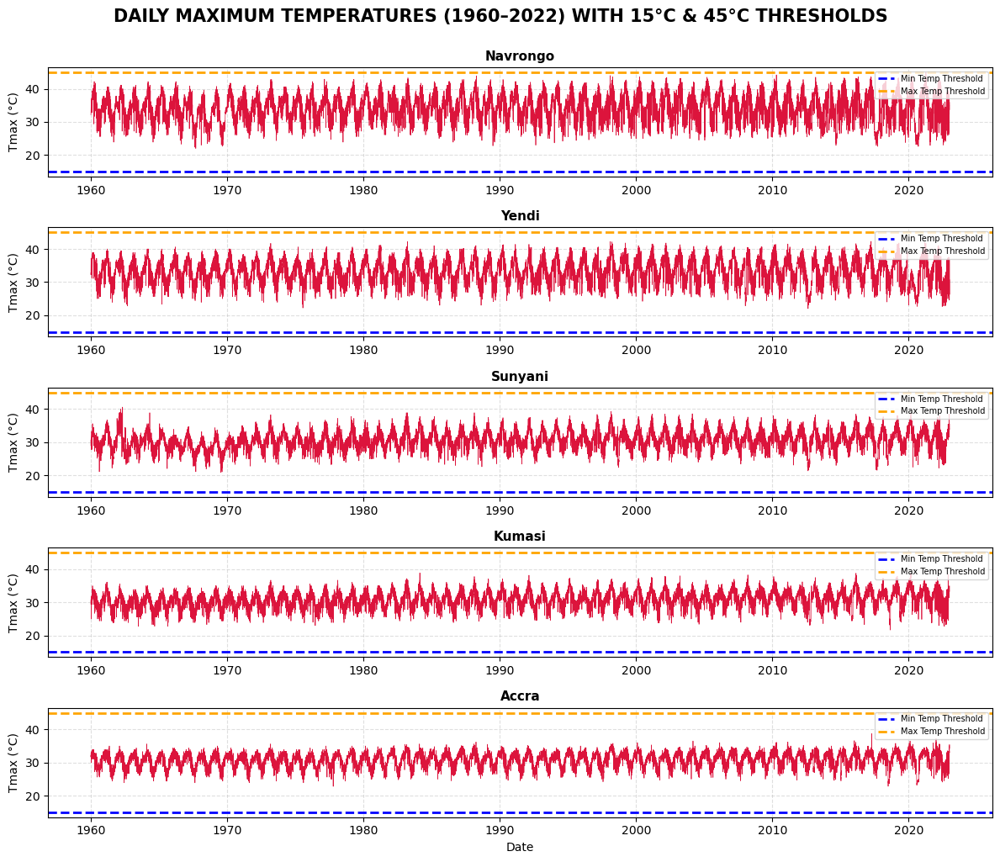

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# File paths for Tmax only
stations = {
    'Navrongo': 'Navrongo_1960_2022_dTx_complete.txt',
    'Yendi': 'Yendi_1960_2022_dTx_complete.txt',
    'Sunyani': 'Sunyani_1960_2022_dTx_complete.txt',
    'Kumasi': 'Kumasi_1960_2022_dTx_complete.txt',
    'Accra': 'Accra_1960_2022_dTx_complete.txt',
}

# Create subplots: 5 rows x 1 column (Tmax only)
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 10), sharex=False)
axes = axes.flatten()

for i, (station, file_tx) in enumerate(stations.items()):
    # Load Tmax data
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
    df_tx.dropna(subset=['date'], inplace=True)
    df_tx.set_index('date', inplace=True)

    ax = axes[i]
    ax.plot(df_tx.index, df_tx['Tmax'], color='crimson', linewidth=0.5)
    
    # Add horizontal lines at 15°C and 45°C
    ax.axhline(15, color='blue', linestyle='--', linewidth=2, label='Min Temp Threshold')
    ax.axhline(45, color='orange', linestyle='--', linewidth=2, label='Max Temp Threshold')

    # Styling
    ax.set_title(f"{station}", fontsize=11, fontweight='bold', loc='center')
    ax.set_ylabel('Tmax (°C)', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.4)
    if i == 4:
        ax.set_xlabel("Date", fontsize=10)

    ax.legend(loc='upper right', fontsize=7)

# Final figure styling
fig.suptitle("DAILY MAXIMUM TEMPERATURES (1960–2022) WITH 15°C & 45°C THRESHOLDS", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.95)
# plt.savefig("daily_tmax_thresholds_allstations.png", bbox_inches='tight', dpi=400)
plt.show()


In [10]:
ds = pd.read_csv('Navrongo_flagging_dTx_QC.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
ds

,year,month,day,Flag
0,1960,1,1,32.2
1,1960,1,2,-5.0
2,1960,1,3,32.8
3,1960,1,4,33.3
4,1960,1,5,34.4
...,...,...,...,...
23006,2022,12,27,35.0
23007,2022,12,28,36.0
23008,2022,12,29,35.0
23009,2022,12,30,35.0


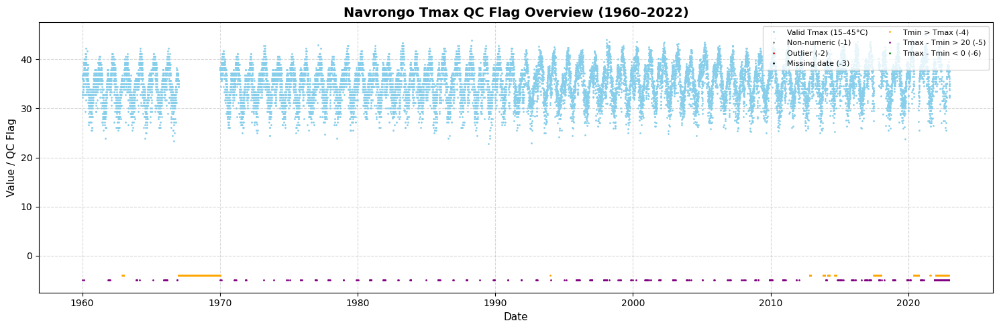

In [11]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your QC-flagged Tmax data
df = pd.read_csv('Navrongo_flagging_dTx_QC.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)

# Define mask and colors for different QC flags
flag_conditions = {
    'Valid Tmax (15–45°C)':         (df['Flag'] >= 15) & (df['Flag'] <= 45),
    'Non-numeric (-1)':             df['Flag'] == -1,
    'Outlier (-2)':                 df['Flag'] == -2,
    'Missing date (-3)':            df['Flag'] == -3,
    'Tmin > Tmax (-4)':             df['Flag'] == -4,
    'Tmax - Tmin > 20 (-5)':        df['Flag'] == -5,
    'Tmax - Tmin < 0 (-6)':         df['Flag'] == -6,
}

colors = {
    'Valid Tmax (15–45°C)': 'skyblue',
    'Non-numeric (-1)': 'gray',
    'Outlier (-2)': 'red',
    'Missing date (-3)': 'black',
    'Tmin > Tmax (-4)': 'orange',
    'Tmax - Tmin > 20 (-5)': 'purple',
    'Tmax - Tmin < 0 (-6)': 'green',
}

# Plot
fig, ax = plt.subplots(figsize=(15, 5))

for label, condition in flag_conditions.items():
    ax.plot(df[condition].index, df[condition]['Flag'], '.', color=colors[label], label=label, markersize=2)

ax.set_title("Navrongo Tmax QC Flag Overview (1960–2022)", fontsize=14, fontweight='bold')
ax.set_ylabel("Value / QC Flag", fontsize=11)
ax.set_xlabel("Date", fontsize=11)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='upper right', fontsize=8, ncol=2)

plt.tight_layout()
# plt.savefig('Navrongo_QC_Flag_Overview.png', dpi=300)
plt.show()


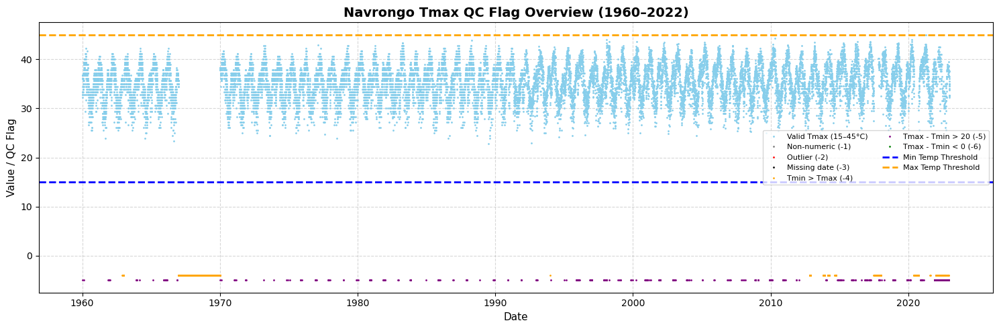

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your QC-flagged Tmax data
df = pd.read_csv('Navrongo_flagging_dTx_QC.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)

# Define mask and colors for different QC flags
flag_conditions = {
    'Valid Tmax (15–45°C)':         (df['Flag'] >= 15) & (df['Flag'] <= 45),
    'Non-numeric (-1)':             df['Flag'] == -1,
    'Outlier (-2)':                 df['Flag'] == -2,
    'Missing date (-3)':            df['Flag'] == -3,
    'Tmin > Tmax (-4)':             df['Flag'] == -4,
    'Tmax - Tmin > 20 (-5)':        df['Flag'] == -5,
    'Tmax - Tmin < 0 (-6)':         df['Flag'] == -6,
}

colors = {
    'Valid Tmax (15–45°C)': 'skyblue',
    'Non-numeric (-1)': 'gray',
    'Outlier (-2)': 'red',
    'Missing date (-3)': 'black',
    'Tmin > Tmax (-4)': 'orange',
    'Tmax - Tmin > 20 (-5)': 'purple',
    'Tmax - Tmin < 0 (-6)': 'green',
}

# Plot
fig, ax = plt.subplots(figsize=(15, 5))

# Scatter plot for each category
for label, condition in flag_conditions.items():
    ax.plot(df[condition].index, df[condition]['Flag'], '.', color=colors[label], label=label, markersize=2)

# Add horizontal lines at 15°C and 45°C
ax.axhline(15, color='blue', linestyle='--', linewidth=2, label='Min Temp Threshold')
ax.axhline(45, color='orange', linestyle='--', linewidth=2, label='Max Temp Threshold')

# Labels and formatting
ax.set_title("Navrongo Tmax QC Flag Overview (1960–2022)", fontsize=14, fontweight='bold')
ax.set_ylabel("Value / QC Flag", fontsize=11)
ax.set_xlabel("Date", fontsize=11)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='best', fontsize=8, ncol=2)

plt.tight_layout()
# plt.savefig('Navrongo_QC_Flag_Overview_withThresholds.png', dpi=300)
plt.show()


In [3]:
Sudan_Savannah = pd.read_csv('Navrongo_flagging_dTn_QC.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
Guinea_Savannah = pd.read_csv('Yendi_flagging_dTn_QC.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
Transition = pd.read_csv('Sunyani_flagging_dTn_QC.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
Forest = pd.read_csv('Kumasi_flagging_dTn_QC.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
Coastal = pd.read_csv('Accra_flagging_dTn_QC.txt',sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])

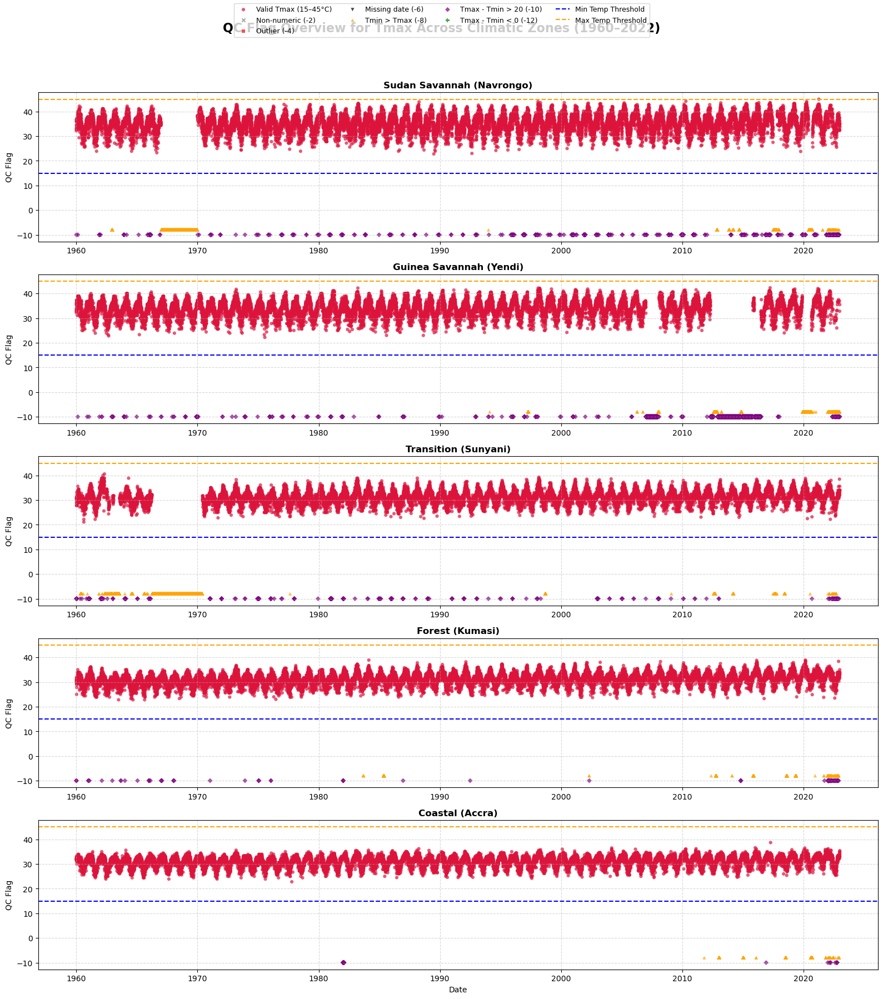

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Define dataset file paths for Tmax
file_paths = {
    'Sudan Savannah ': 'Navrongo_flagging_dTx_QC.txt',
    'Guinea Savannah ': 'Yendi_flagging_dTx_QC.txt',
    'Transition ': 'Sunyani_flagging_dTx_QC.txt',
    'Forest ': 'Kumasi_flagging_dTx_QC.txt',
    'Coastal ': 'Accra_flagging_dTx_QC.txt',
}

# Define color and marker styles
colors = {
    'Valid Tmax (15–45°C)': 'crimson',
    'Non-numeric (-2)': 'gray',
    'Outlier (-4)': 'red',
    'Missing date (-6)': 'black',
    'Tmin > Tmax (-8)': 'orange',
    'Tmax - Tmin > 20 (-10)': 'purple',
    'Tmax - Tmin < 0 (-12)': 'green',
}

markers = {
    'Valid Tmax (15–45°C)': 'o',
    'Non-numeric (-2)': 'x',
    'Outlier (-4)': 's',
    'Missing date (-6)': 'v',
    'Tmin > Tmax (-8)': '^',
    'Tmax - Tmin > 20 (-10)': 'D',
    'Tmax - Tmin < 0 (-12)': 'P',
}

# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(16, 18), sharex=False)

# Loop through files and plot
for ax, (zone, path) in zip(axes, file_paths.items()):
    df = pd.read_csv(path, sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)

    # Define condition masks
    flag_conditions = {
        'Valid Tmax (15–45°C)': (df['Flag'] >= 15) & (df['Flag'] <= 45),
        'Non-numeric (-2)': df['Flag'] == -2,
        'Outlier (-4)': df['Flag'] == -4,
        'Missing date (-6)': df['Flag'] == -6,
        'Tmin > Tmax (-8)': df['Flag'] == -8,
        'Tmax - Tmin > 20 (-10)': df['Flag'] == -10,
        'Tmax - Tmin < 0 (-12)': df['Flag'] == -12,
    }

    for label, condition in flag_conditions.items():
        ax.scatter(
            df[condition].index,
            df[condition]['Flag'],
            color=colors[label],
            marker=markers[label],
            label=label,
            s=20,
            alpha=0.7,
            edgecolors='none'
        )

    ax.axhline(15, color='blue', linestyle='--', linewidth=1.5, label='Min Temp Threshold')
    ax.axhline(45, color='orange', linestyle='--', linewidth=1.5, label='Max Temp Threshold')

    ax.set_title(zone, fontsize=12, fontweight='bold')
    ax.set_ylabel("QC Flag", fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)

# X label and legend
axes[-1].set_xlabel("Date")
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=4, fontsize=9)
fig.suptitle("QC Flag Overview for Tmax Across Climatic Zones (1960–2022)", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


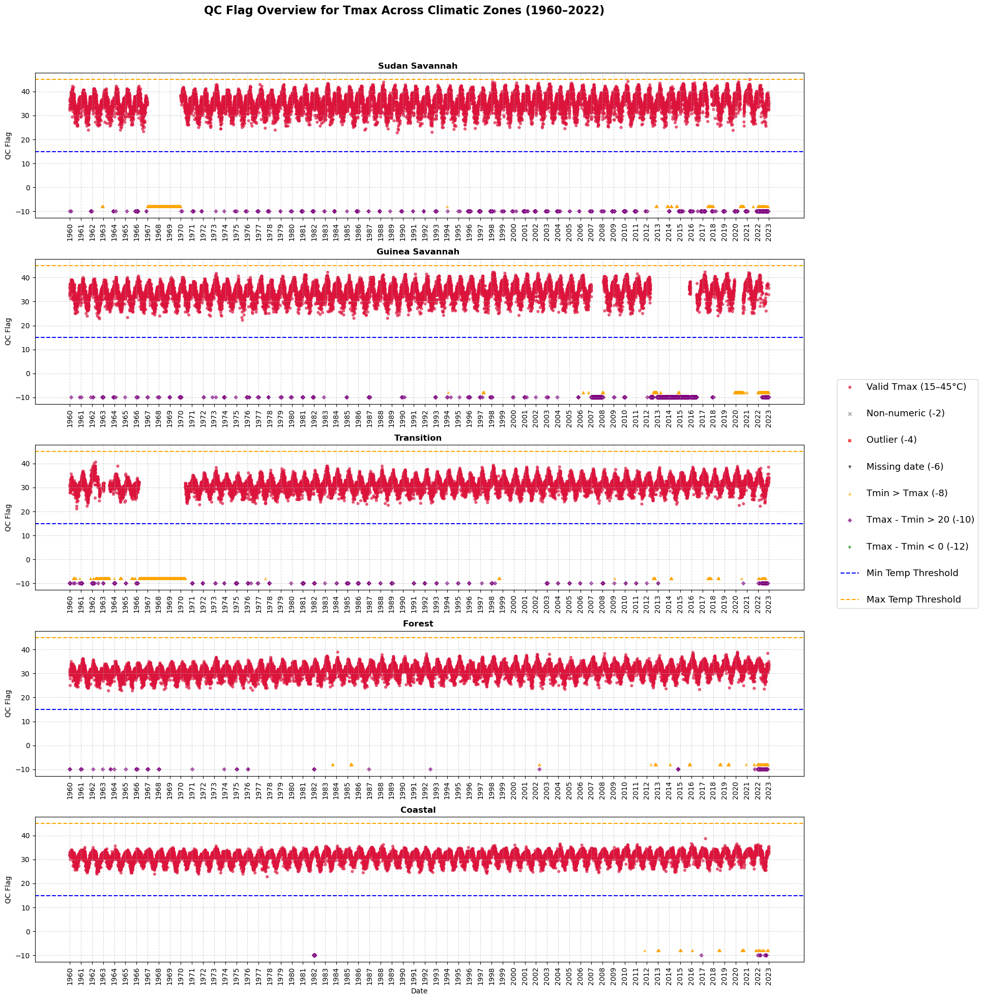

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Define dataset file paths for Tmax
file_paths = {
    'Sudan Savannah ': 'Navrongo_flagging_dTx_QC.txt',
    'Guinea Savannah ': 'Yendi_flagging_dTx_QC.txt',
    'Transition ': 'Sunyani_flagging_dTx_QC.txt',
    'Forest ': 'Kumasi_flagging_dTx_QC.txt',
    'Coastal ': 'Accra_flagging_dTx_QC.txt',
}

# Define color and marker styles
colors = {
    'Valid Tmax (15–45°C)': 'crimson',
    'Non-numeric (-2)': 'gray',
    'Outlier (-4)': 'red',
    'Missing date (-6)': 'black',
    'Tmin > Tmax (-8)': 'orange',
    'Tmax - Tmin > 20 (-10)': 'purple',
    'Tmax - Tmin < 0 (-12)': 'green',
}

markers = {
    'Valid Tmax (15–45°C)': 'o',
    'Non-numeric (-2)': 'x',
    'Outlier (-4)': 's',
    'Missing date (-6)': 'v',
    'Tmin > Tmax (-8)': '^',
    'Tmax - Tmin > 20 (-10)': 'D',
    'Tmax - Tmin < 0 (-12)': 'P',
}

# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(16, 20), sharex=False)

# Loop through files and plot
for ax, (zone, path) in zip(axes, file_paths.items()):
    df = pd.read_csv(path, sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)

    # Define condition masks
    flag_conditions = {
        'Valid Tmax (15–45°C)': (df['Flag'] >= 15) & (df['Flag'] <= 45),
        'Non-numeric (-2)': df['Flag'] == -2,
        'Outlier (-4)': df['Flag'] == -4,
        'Missing date (-6)': df['Flag'] == -6,
        'Tmin > Tmax (-8)': df['Flag'] == -8,
        'Tmax - Tmin > 20 (-10)': df['Flag'] == -10,
        'Tmax - Tmin < 0 (-12)': df['Flag'] == -12,
    }

    for label, condition in flag_conditions.items():
        ax.scatter(
            df[condition].index,
            df[condition]['Flag'],
            color=colors[label],
            marker=markers[label],
            label=label,
            s=20,
            alpha=0.7,
            edgecolors='none'
        )

    ax.axhline(15, color='blue', linestyle='--', linewidth=1.5, label='Min Temp Threshold')
    ax.axhline(45, color='orange', linestyle='--', linewidth=1.5, label='Max Temp Threshold')

    # Format x-axis
    ax.set_xticks(pd.date_range(start='1960', end='2023', freq='YS'))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.tick_params(axis='x', rotation=90)

    ax.set_title(zone, fontsize=12, fontweight='bold')
    ax.set_ylabel("QC Flag", fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)

# X label and legend
axes[-1].set_xlabel("Date")
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),  # Slightly more to the right
    ncol=1,
    fontsize=13,
    borderaxespad=1.0,
    labelspacing=1.9,  # Increases vertical space between entries
    frameon=True  # Optional: adds a box around the legend
)

fig.suptitle("QC Flag Overview for Tmax Across Climatic Zones (1960–2022)", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Define dataset file paths for Tmax
file_paths = {
    'Sudan Savannah ': 'Navrongo_flagging_dTx_QC.txt',
    'Guinea Savannah ': 'Yendi_flagging_dTx_QC.txt',
    'Forest ': 'Kumasi_flagging_dTx_QC.txt',
    'Coastal ': 'Accra_flagging_dTx_QC.txt',
}

# Define color and marker styles
colors = {
    'Valid Tmax (15–45°C)': 'crimson',
    'Non-numeric (-2)': 'gray',
    'Outlier (-4)': 'red',
    'Missing date (-6)': 'black',
    'Tmin > Tmax (-8)': 'orange',
    'Tmax - Tmin > 20 (-10)': 'purple',
    'Tmax - Tmin < 0 (-12)': 'green',
}

markers = {
    'Valid Tmax (15–45°C)': 'o',
    'Non-numeric (-2)': 'x',
    'Outlier (-4)': 's',
    'Missing date (-6)': 'v',
    'Tmin > Tmax (-8)': '^',
    'Tmax - Tmin > 20 (-10)': 'D',
    'Tmax - Tmin < 0 (-12)': 'P',
}

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(16, 20), sharex=False)

# Loop through files and plot
for ax, (zone, path) in zip(axes, file_paths.items()):
    df = pd.read_csv(path, sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)

    flag_conditions = {
        'Valid Tmax (15–45°C)': (df['Flag'] >= 15) & (df['Flag'] <= 45),
        'Non-numeric (-2)': df['Flag'] == -2,
        'Outlier (-4)': df['Flag'] == -4,
        'Missing date (-6)': df['Flag'] == -6,
        'Tmin > Tmax (-8)': df['Flag'] == -8,
        'Tmax - Tmin > 20 (-10)': df['Flag'] == -10,
        'Tmax - Tmin < 0 (-12)': df['Flag'] == -12,
    }

    for label, condition in flag_conditions.items():
        ax.scatter(
            df[condition].index,
            df[condition]['Flag'],
            color=colors[label],
            marker=markers[label],
            label=label,
            s=20,
            alpha=0.7,
            edgecolors='none'
        )

    ax.axhline(15, color='blue', linestyle='--', linewidth=1.5, label='Min Temp Threshold')
    ax.axhline(45, color='orange', linestyle='--', linewidth=1.5, label='Max Temp Threshold')

   # Format x-axis
    ax.set_xticks(pd.date_range(start='1960', end='2023', freq='YS'))
    ax.set_xticklabels(
    [dt.strftime('%Y') for dt in pd.date_range(start='1960', end='2023', freq='YS')],
    rotation=90,
    fontsize=10,
    fontweight='bold',
    color='black'
)

# Format y-axis tick values (make them bold too)
    ax.tick_params(axis='y', labelsize=10)
    ax.set_yticklabels([str(label) for label in ax.get_yticks()], fontsize=10, fontweight='bold', color='black')

    ax.set_title(zone, fontsize=13, fontweight='bold')
    ax.set_ylabel("QC Flag", fontsize=11, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)

# Set x-label for last subplot
axes[-1].set_xlabel("Date", fontsize=12, fontweight='bold')

# Legend
handles, labels = axes[-1].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    ncol=1,
    fontsize=13,
    borderaxespad=1.0,
    labelspacing=1.9,
    frameon=True
)

fig.suptitle("QUALITY CONTROL FLAG OVERVIEW FOR TMAX ACROSS CLIMATIC ZONES(1960–2022)", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
fig.savefig("QC.png", bbox_inches='tight')

plt.show()


C:\Users\ampon\AppData\Local\Temp\ipykernel_20612\2815428532.py:55: UserWarning: You passed a edgecolor/edgecolors ('none') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(
C:\Users\ampon\AppData\Local\Temp\ipykernel_20612\2815428532.py:81: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([str(label) for label in ax.get_yticks()], fontsize=10, fontweight='bold', color='black')
C:\Users\ampon\AppData\Local\Temp\ipykernel_20612\2815428532.py:55: UserWarning: You passed a edgecolor/edgecolors ('none') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(
C:\Users\ampon\AppData\Local\Temp\ipykernel_20612\2815428532.py:81: UserWarning: set_ticklabels() should only be used with a fixed number of tick

C:\Users\ampon\AppData\Local\Temp\ipykernel_1900\4156721675.py:45: UserWarning: You passed a edgecolor/edgecolors ('none') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(


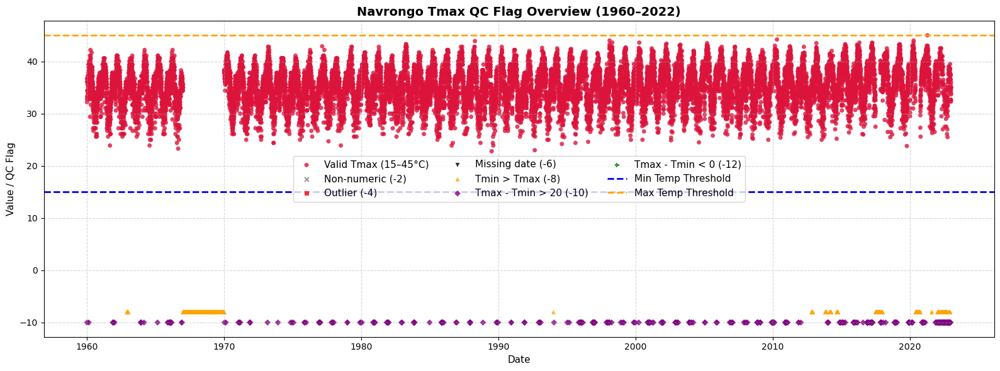

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the QC-flagged data
df = pd.read_csv('Navrongo_flagging_dTx_QC.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Flag"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)

# Define categories, colors, and markers
flag_conditions = {
    'Valid Tmax (15–45°C)':         (df['Flag'] >= 15) & (df['Flag'] <= 45),
    'Non-numeric (-2)':             df['Flag'] == -2,
    'Outlier (-4)':                 df['Flag'] == -4,
    'Missing date (-6)':            df['Flag'] == -6,
    'Tmin > Tmax (-8)':             df['Flag'] == -8,
    'Tmax - Tmin > 20 (-10)':        df['Flag'] == -10,
    'Tmax - Tmin < 0 (-12)':         df['Flag'] == -12,
}

colors = {
    'Valid Tmax (15–45°C)': 'crimson',
    'Non-numeric (-2)': 'gray',
    'Outlier (-4)': 'red',
    'Missing date (-6)': 'black',
    'Tmin > Tmax (-8)': 'orange',
    'Tmax - Tmin > 20 (-10)': 'purple',
    'Tmax - Tmin < 0 (-12)': 'green',
}

markers = {
    'Valid Tmax (15–45°C)': 'o',
    'Non-numeric (-2)': 'x',
    'Outlier (-4)': 's',
    'Missing date (-6)': 'v',
    'Tmin > Tmax (-8)': '^',
    'Tmax - Tmin > 20 (-10)': 'D',
    'Tmax - Tmin < 0 (-12)': 'P',
}

# Plotting
fig, ax = plt.subplots(figsize=(16, 6))

for label, condition in flag_conditions.items():
    ax.scatter(
        df[condition].index,
        df[condition]['Flag'],
        color=colors[label],
        marker=markers[label],
        label=label,
        s=25,  # size of marker (larger than before)
        alpha=0.8,
        edgecolors='none'
    )

# Add horizontal threshold lines
ax.axhline(15, color='blue', linestyle='--', linewidth=2, label='Min Temp Threshold')
ax.axhline(45, color='orange', linestyle='--', linewidth=2, label='Max Temp Threshold')

# Formatting
ax.set_title("Navrongo Tmax QC Flag Overview (1960–2022)", fontsize=14, fontweight='bold')
ax.set_ylabel("Value / QC Flag", fontsize=11)
ax.set_xlabel("Date", fontsize=11)
ax.grid(True, linestyle='--', alpha=0.5)
ax.legend(loc='center', fontsize=11, ncol=3)

plt.tight_layout()
# plt.savefig("Navrongo_QC_Flag_Enhanced.png", dpi=300)
plt.show()


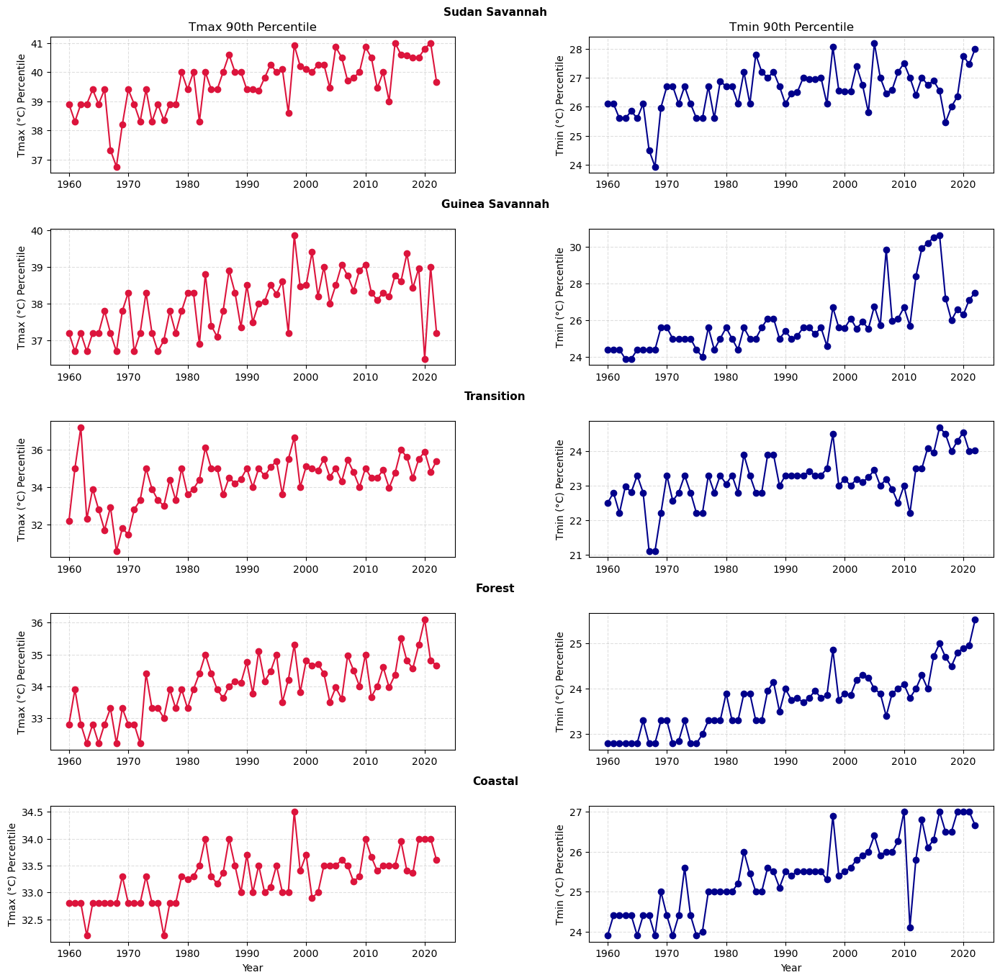

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

stations = {
    'Sudan Savannah': ('Navrongo_1960_2022_dTx_complete.txt', 'Navrongo_1960_2022_dTn_complete.txt'),
    'Guinea Savannah':   ('Yendi_1960_2022_dTx_complete.txt',   'Yendi_1960_2022_dTn_complete.txt'),
    'Transition':   ('Sunyani_1960_2022_dTx_complete.txt',   'Sunyani_1960_2022_dTn_complete.txt'),
    'Forest':   ('Kumasi_1960_2022_dTx_complete.txt',   'Kumasi_1960_2022_dTn_complete.txt'),
    'Coastal':    ('Accra_1960_2022_dTx_complete.txt',    'Accra_1960_2022_dTn_complete.txt'),
}

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(14, 14), sharex=False)

station_names = list(stations.keys())

for i, (station, (file_tx, file_tn)) in enumerate(stations.items()):
    # --- Tmax ---
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
    df_tx.dropna(subset=['date'], inplace=True)
    df_tx.set_index('date', inplace=True)
    # df_tx = df_tx[(df_tx.index.year >= 1960) & (df_tx.index.year <= 2022)].dropna(subset=['Tmax'])
    annual_90th_tx = df_tx.groupby(df_tx.index.year)['Tmax'].quantile(0.9)

    ax_tx = axes[i, 0]
    ax_tx.plot(annual_90th_tx.index, annual_90th_tx.values, 'o-', color='crimson')
    ax_tx.set_ylabel('Tmax (°C) Percentile', fontsize=10)
    ax_tx.grid(True, linestyle='--', alpha=0.4)
    if i == 4:
        ax_tx.set_xlabel("Year", fontsize=10)

    # --- Tmin ---
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df_tn['date'] = pd.to_datetime(df_tn[['year', 'month', 'day']], errors='coerce')
    df_tn.dropna(subset=['date'], inplace=True)
    df_tn.set_index('date', inplace=True)
    # df_tn = df_tn[(df_tn.index.year >= 1960) & (df_tn.index.year <= 2022)].dropna(subset=['Tmin'])
    annual_90th_tn = df_tn.groupby(df_tn.index.year)['Tmin'].quantile(0.9)

    ax_tn = axes[i, 1]
    ax_tn.plot(annual_90th_tn.index, annual_90th_tn.values, 'o-', color='darkblue')
    ax_tn.set_ylabel('Tmin (°C) Percentile', fontsize=10)
    ax_tn.grid(True, linestyle='--', alpha=0.4)
    if i == 4:
        ax_tn.set_xlabel("Year", fontsize=10)

    # Label each row with station name across both plots (centered above row)
    axes[i, 0].annotate(
        station, xy=(1.10, 1.18), xycoords='axes fraction',
        ha='center', va='center', fontsize=11, fontweight='bold'
    )

# Column headers
axes[0, 0].set_title("Tmax 90th Percentile",  fontsize=12)
axes[0, 1].set_title("Tmin 90th Percentile", fontsize=12)

# Suptitle and layout
# fig.suptitle("ANNUAL 90TH PERCENTILE OF TMAX AND TMIN (1960–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.94)
fig.savefig("tmax_tmin_annual_90th_dual.png", bbox_inches='tight')
plt.show()


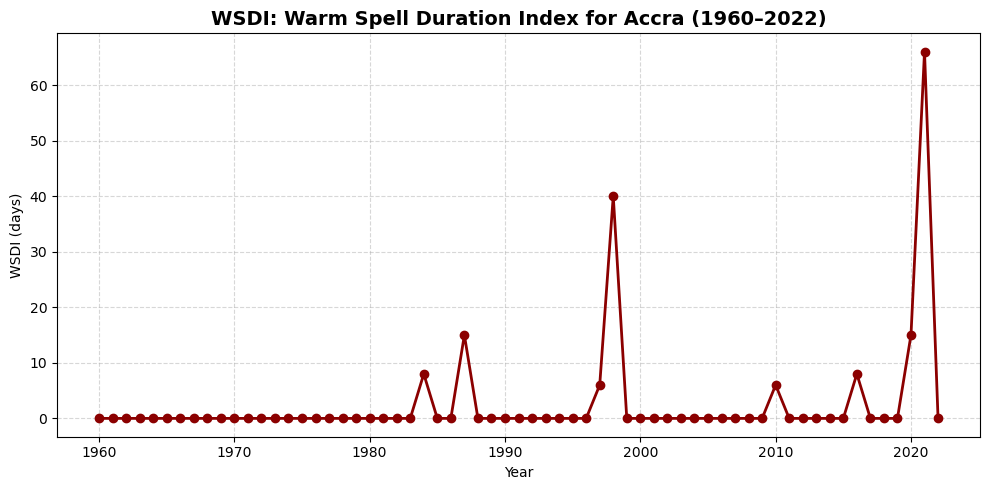

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load Tmax data for Accra
df = pd.read_csv('Accra_1960_2024_dTx_complete.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)
df = df[(df.index.year >= 1960) & (df.index.year <= 2022)].dropna(subset=['Tmax'])

# Assign day of year
df['doy'] = df.index.dayofyear
# Adjust for leap years: Remove Feb 29 to maintain consistency
df = df[~((df.index.month == 2) & (df.index.day == 29))]

# Step 1: Calculate 90th percentile by calendar day
climatology = df.groupby('doy')['Tmax'].quantile(0.9)

# Step 2: Apply thresholds per year
wsdi_dict = {}

for year, group in df.groupby(df.index.year):
    # Get DOY-based thresholds
    group = group.copy()
    group['threshold'] = group['doy'].map(climatology)
    group['exceed'] = group['Tmax'] > group['threshold']

    # Identify warm spells (6+ consecutive exceedances)
    exceed = group['exceed'].values
    count = 0
    i = 0
    while i < len(exceed):
        if exceed[i]:
            j = i
            while j < len(exceed) and exceed[j]:
                j += 1
            length = j - i
            if length >= 6:
                count += length
            i = j
        else:
            i += 1
    wsdi_dict[year] = count

# Convert to Series
wsdi_series = pd.Series(wsdi_dict)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(wsdi_series.index, wsdi_series.values, marker='o', color='darkred', linewidth=2)
plt.grid(True, linestyle='--', alpha=0.5)
plt.title("WSDI: Warm Spell Duration Index for Accra (1960–2022)", fontsize=14, fontweight='bold')
plt.xlabel("Year")
plt.ylabel("WSDI (days)")
plt.tight_layout()
# plt.savefig("accra_wsdi.png", bbox_inches='tight')
plt.show()


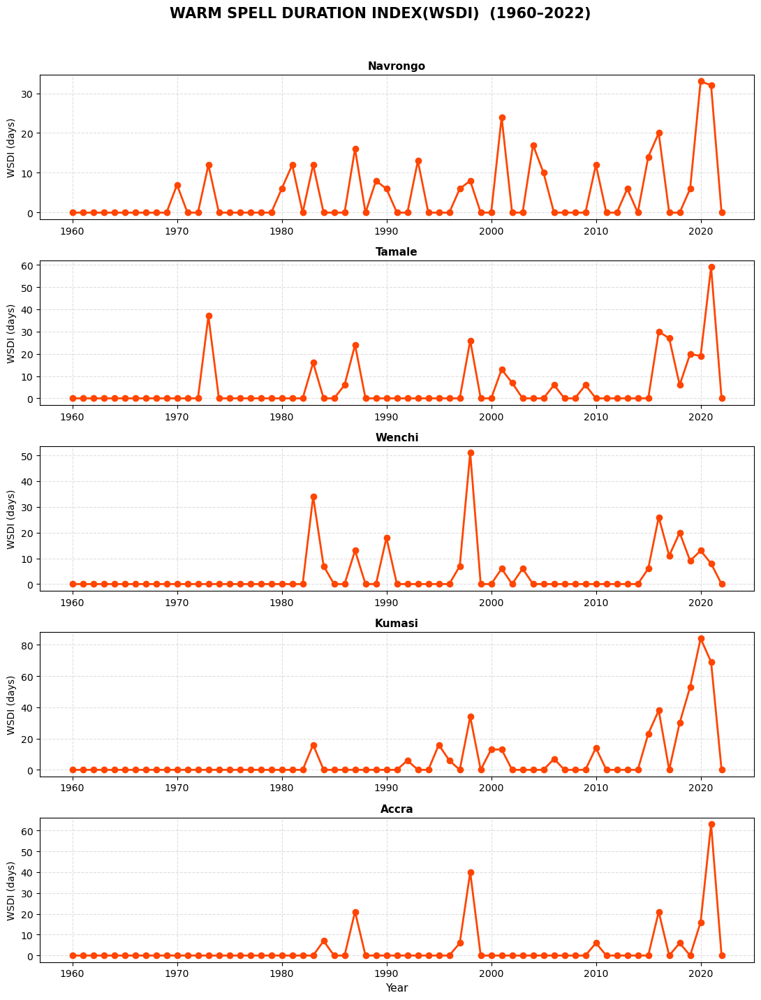

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Station Tmax files
stations_tmax = {
    'Navrongo': 'Navrongo_1960_2022_dTx_complete.txt',
    'Tamale':   'Tamale_1960_2022_dTx_complete.txt',
    'Wenchi':   'Wenchi_1960_2022_dTx_complete.txt',
    'Kumasi':   'Kumasi_1960_2022_dTx_complete.txt',
    'Accra':    'Accra_1960_2022_dTx_complete.txt',
}

# Set up 5x1 subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (station, file) in enumerate(stations_tmax.items()):
    # Load data
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)].dropna(subset=['Tmax'])

    # Create calendar day key (month-day) for climatology
    df['calday'] = df.index.strftime('%m-%d')

    # Climatological 90th percentile by calendar day (include Feb 29!)
    clim_90th = df.groupby('calday')['Tmax'].quantile(0.9)

    # Compute WSDI per year
    wsdi = {}
    for yr, group in df.groupby(df.index.year):
        group = group.copy()
        group['calday'] = group.index.strftime('%m-%d')
        group['threshold'] = group['calday'].map(clim_90th)
        group['exceed'] = group['Tmax'] > group['threshold']

        # Identify warm spells (≥6 consecutive exceedances)
        flags = group['exceed'].values
        count = 0
        i_flag = 0
        while i_flag < len(flags):
            if flags[i_flag]:
                j = i_flag
                while j < len(flags) and flags[j]:
                    j += 1
                span = j - i_flag
                if span >= 6:
                    count += span
                i_flag = j
            else:
                i_flag += 1
        wsdi[yr] = count

    # Convert to Series and plot
    wsdi_series = pd.Series(wsdi)

    ax = axes[i]
    ax.plot(wsdi_series.index, wsdi_series.values, marker='o', color='orangered', linewidth=2)
    ax.set_ylabel("WSDI (days)", fontsize=10)
    ax.set_title(station, fontsize=11, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.4)

# Final formatting
axes[-1].set_xlabel("Year", fontsize=11)
fig.suptitle("WARM SPELL DURATION INDEX(WSDI)  (1960–2022)", fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
fig.subplots_adjust(top=0.95)
# plt.savefig("wsdi_feb29_included.png", bbox_inches='tight')
plt.show()


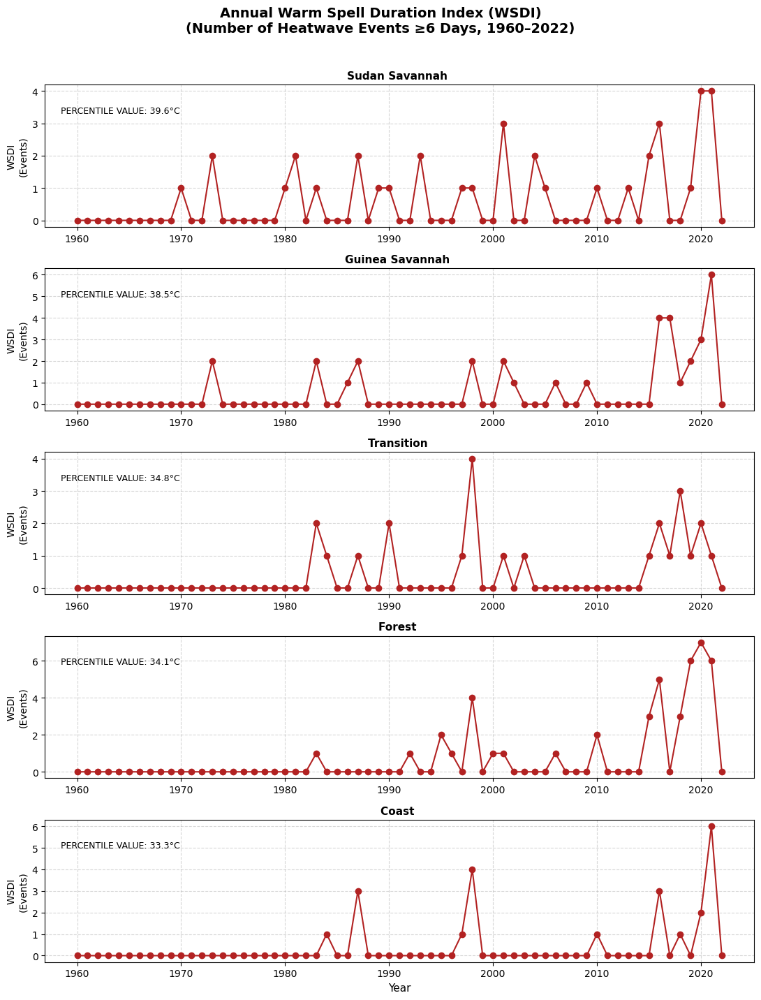

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Define station files (Tmax)
stations = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTx_complete.txt',
    'Guinea Savannah': 'Tamale_1960_2022_dTx_complete.txt',
    'Transition': 'Wenchi_1960_2022_dTx_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTx_complete.txt',
    'Coast': 'Accra_1960_2022_dTx_complete.txt',
}

# Helper function to detect heatwave episodes (≥6 consecutive exceedance days)
def count_heatwave_events(series, min_length=6):
    events = 0
    count = 0
    for val in series:
        if val:
            count += 1
        else:
            if count >= min_length:
                events += 1
            count = 0
    if count >= min_length:
        events += 1
    return events

# Store WSDI results for all stations
wsdi_results = {}

# Prepare figure
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

# Process each station
for i, (name, file) in enumerate(stations.items()):
    # Load data
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmax'])

    # Include Feb 29th by not filtering out leap years
    df['doy'] = df.index.strftime('%m-%d')

    # Compute station-specific 90th percentile by calendar day (climatology)
    clim_percentile = df.groupby('doy')['Tmax'].quantile(0.9)

    # Match daily threshold
    df['threshold'] = df['doy'].map(clim_percentile)
    df['exceed'] = df['Tmax'] > df['threshold']

    # Compute WSDI (heatwave event count) per year
    wsdi_per_year = df.groupby(df.index.year)['exceed'].apply(lambda x: count_heatwave_events(x.values))

    # Store results
    wsdi_results[name] = wsdi_per_year

    # Plot
    ax = axes[i]
    ax.plot(wsdi_per_year.index, wsdi_per_year.values, marker='o', color='firebrick')
    ax.set_title(f"{name} ", fontsize=11, fontweight='bold')
    ax.set_ylabel("WSDI\n(Events)", fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)

    # Annotate overall 90th percentile value for reference
    overall_p90 = df['Tmax'].quantile(0.9)
    ax.text(0.19, 0.85, f" PERCENTILE VALUE: {overall_p90:.1f}°C", transform=ax.transAxes,
            ha='right', va='top', fontsize=9, color='black')

axes[-1].set_xlabel("Year", fontsize=11)
fig.suptitle("Annual Warm Spell Duration Index (WSDI)\n(Number of Heatwave Events ≥6 Days, 1960–2022)", fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
# plt.savefig("wsdi.png", bbox_inches='tight')
plt.subplots_adjust(top=0.94)



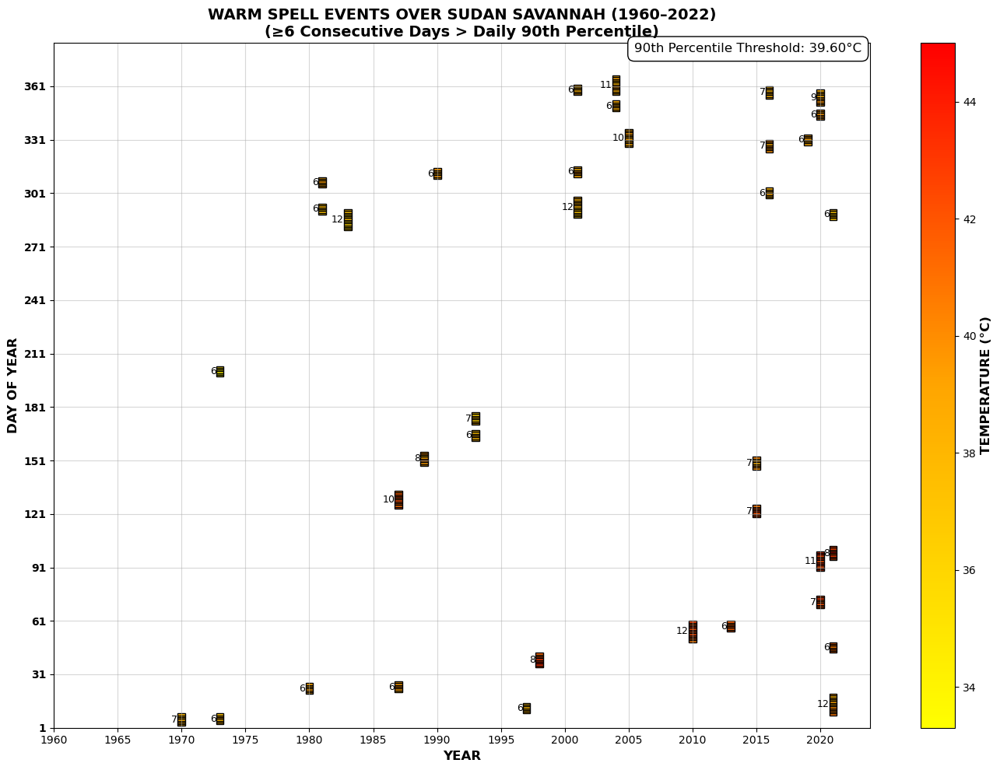

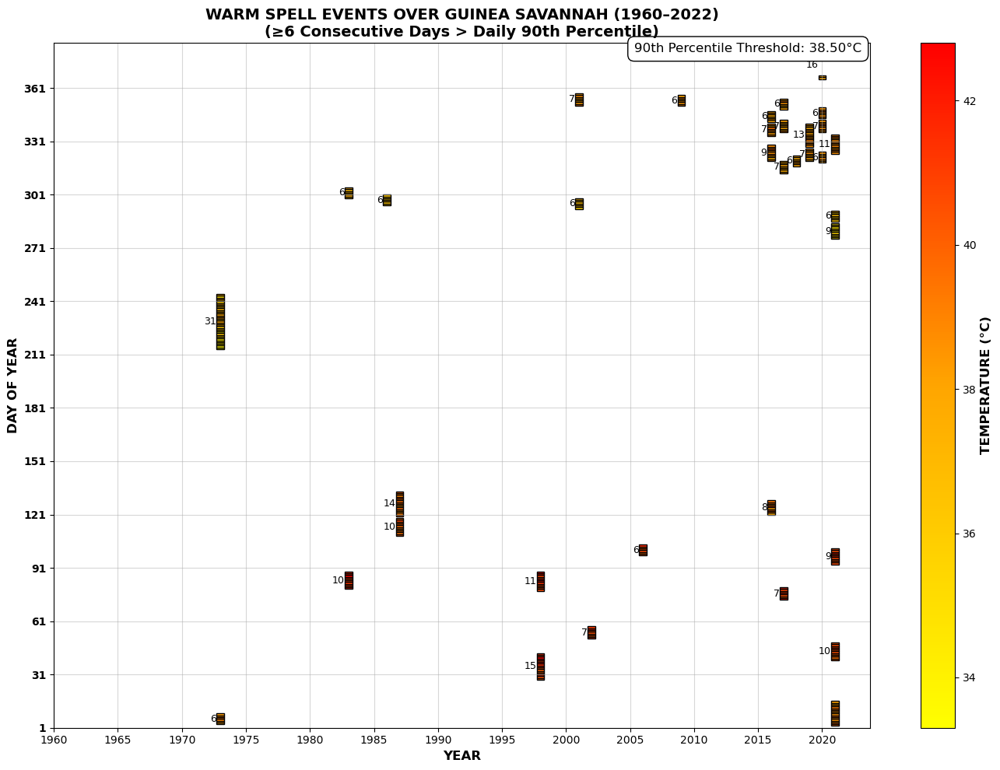

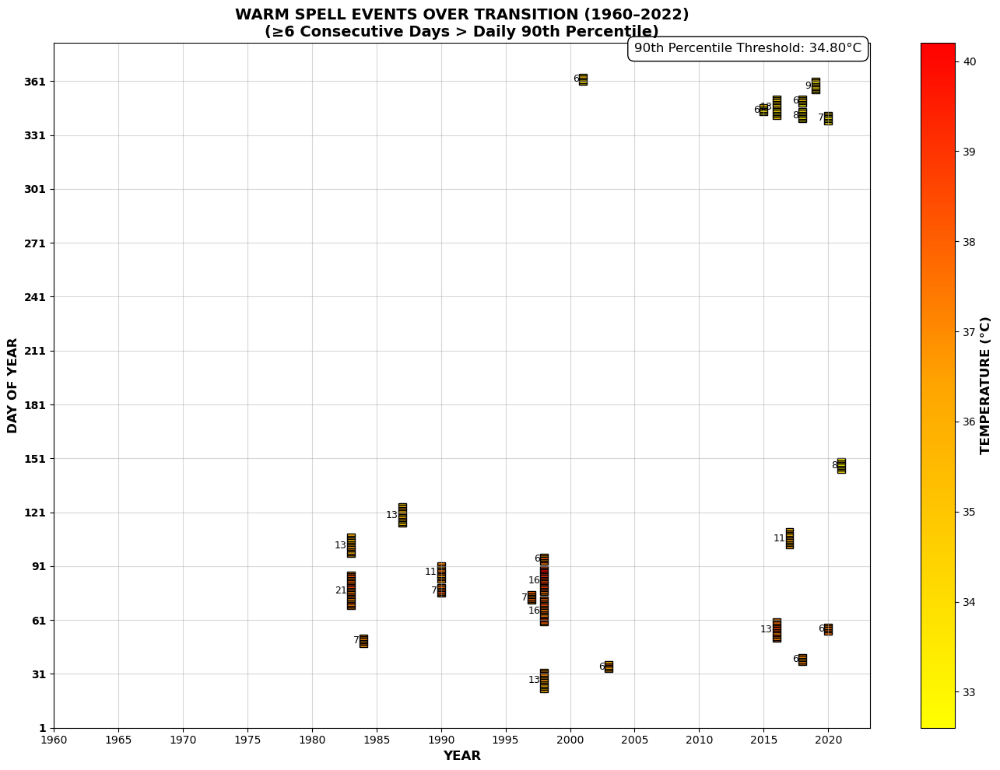

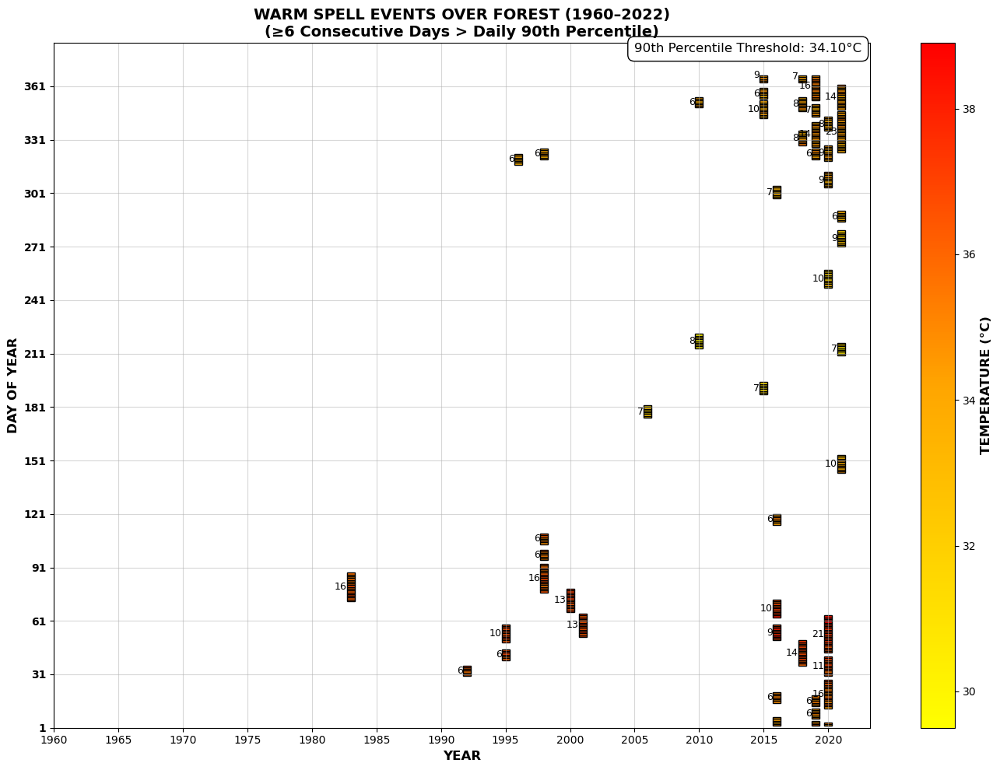

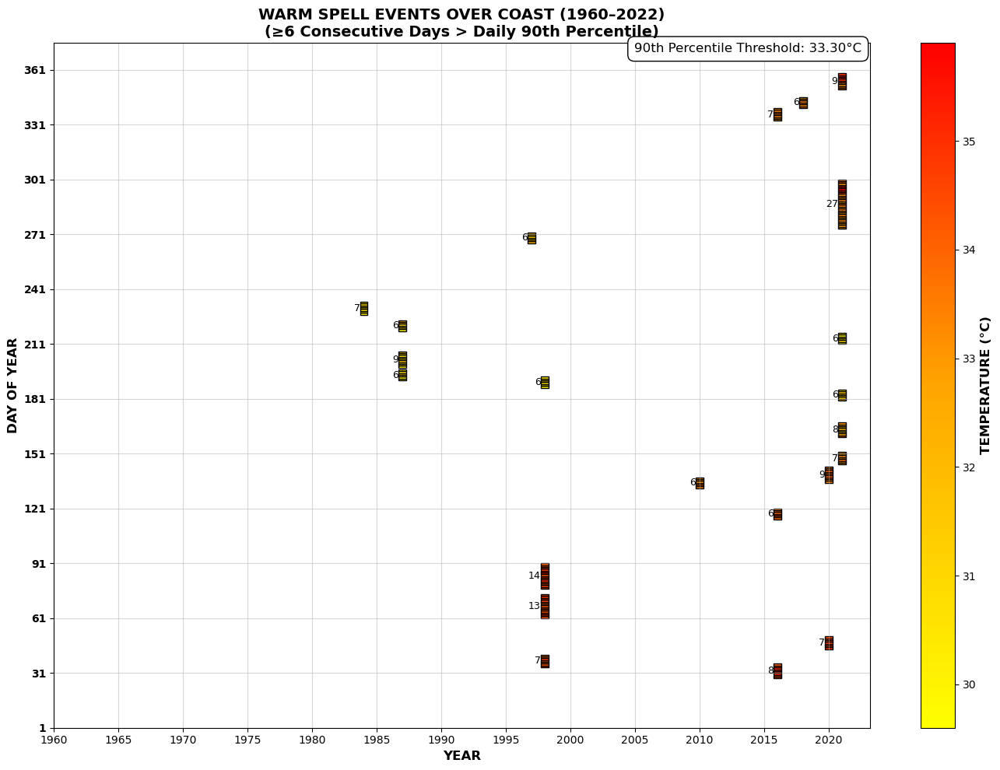

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
from matplotlib.cm import ScalarMappable

# Create colormap
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["yellow", "orange", "red"])

# Define station files
stations = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTx_complete.txt',
    'Guinea Savannah': 'Yendi_1960_2022_dTx_complete.txt',
    'Transition': 'Wenchi_1960_2022_dTx_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTx_complete.txt',
    'Coast': 'Accra_1960_2022_dTx_complete.txt',
}

# Function to detect warm spell episodes
def detect_warm_spells(df, min_duration=6):
    episodes = []
    df['group'] = (df['exceed'] != df['exceed'].shift()).cumsum()
    for _, group in df.groupby('group'):
        if group['exceed'].iloc[0] and len(group) >= min_duration:
            episodes.append({
                'date_start': group.index[0],
                'date_end': group.index[-1],
                'temperatures': group['Tmax'].values
            })
    return episodes

# Plotting function
def plot_warm_spell_events(episodes, percentile, station_name):
    if not episodes:
        print(f"No heatwave events for {station_name}")
        return

    # Flatten all temps for colormap scaling
    all_temps = np.concatenate([ep['temperatures'] for ep in episodes])
    norm = Normalize(vmin=all_temps.min(), vmax=all_temps.max())

    fig, ax = plt.subplots(figsize=(14, 10))

    for ep in episodes:
        for i, temp in enumerate(ep['temperatures']):
            date = ep['date_start'] + pd.Timedelta(days=i)
            year = date.year
            doy = date.timetuple().tm_yday
            ax.bar(year, 1, bottom=doy, width=0.6, color=cmap(norm(temp)), edgecolor='black')

        # Annotate duration
        y_mid = ep['date_start'].timetuple().tm_yday + len(ep['temperatures']) / 2
        ax.text(ep['date_start'].year - 0.3, y_mid, f"{len(ep['temperatures'])}", ha='right', va='center', fontsize=9, color='black')

    # Labels
    ax.set_xticks(np.arange(1960, 2023, 5))
    ax.set_yticks(np.arange(0, 366, 30))
    ax.set_yticklabels([f'{i}' for i in range(1, 366, 30)], fontweight='bold')
    ax.set_xlabel('YEAR', fontsize=12, fontweight='bold')
    ax.set_ylabel('DAY OF YEAR', fontsize=12, fontweight='bold')
    ax.set_title(f"WARM SPELL EVENTS OVER {station_name.upper()} (1960–2022)\n(≥6 Consecutive Days > Daily 90th Percentile)", fontsize=14, fontweight='bold')

    # Colorbar
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('TEMPERATURE (°C)', fontsize=12, fontweight='bold')

    ax.annotate(f'90th Percentile Threshold: {percentile:.2f}°C', xy=(0.99, 1), xycoords='axes fraction',
                ha='right', va='top', fontsize=12, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

    ax.grid(True, alpha=0.5)
    plt.tight_layout()
    plt.savefig(f"WSDI_EVENTS_{station_name.replace(' ', '_')}.png", dpi=300)
    plt.show()

# Process each station
for station_name, file in stations.items():
    df = pd.read_csv(file, sep=r'\s+', header=None, names=['year', 'month', 'day', 'Tmax'])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df['doy'] = df.index.strftime('%m-%d')

    # Daily 90th percentile threshold (climatology)
    clim_p90 = df.groupby('doy')['Tmax'].quantile(0.9)
    df['threshold'] = df['doy'].map(clim_p90)
    df['exceed'] = df['Tmax'] > df['threshold']

    # Detect episodes
    episodes = detect_warm_spells(df, min_duration=6)

    # Overall 90th percentile for annotation
    overall_p90 = df['Tmax'].quantile(0.9)

    # Plot
    plot_warm_spell_events(episodes, overall_p90, station_name)


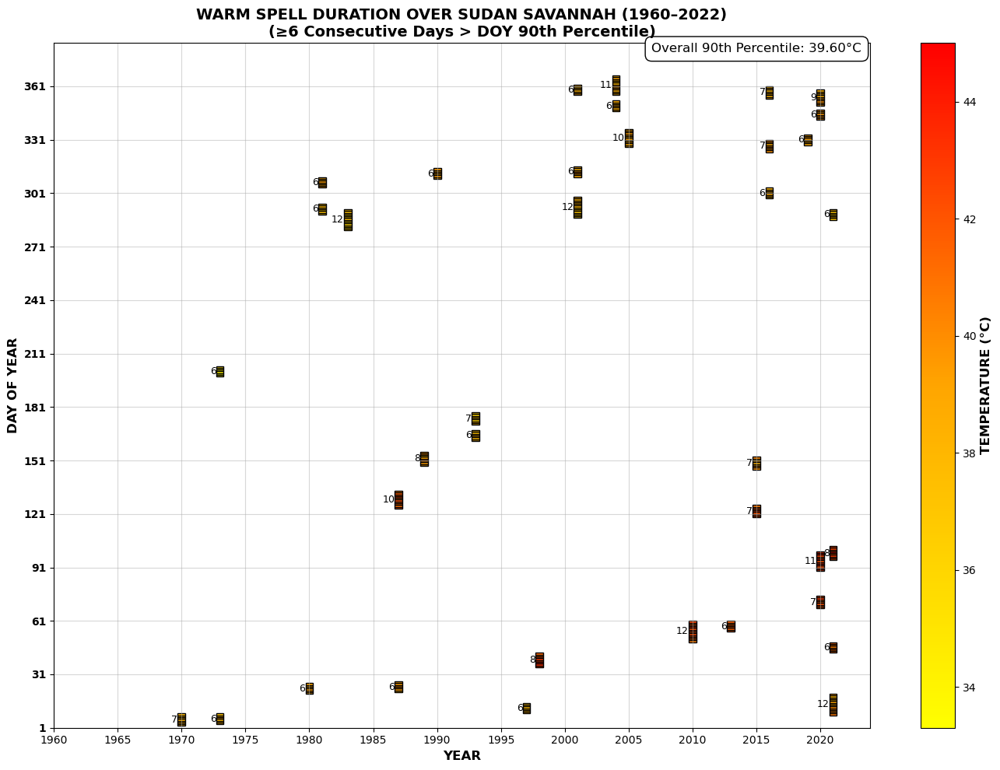

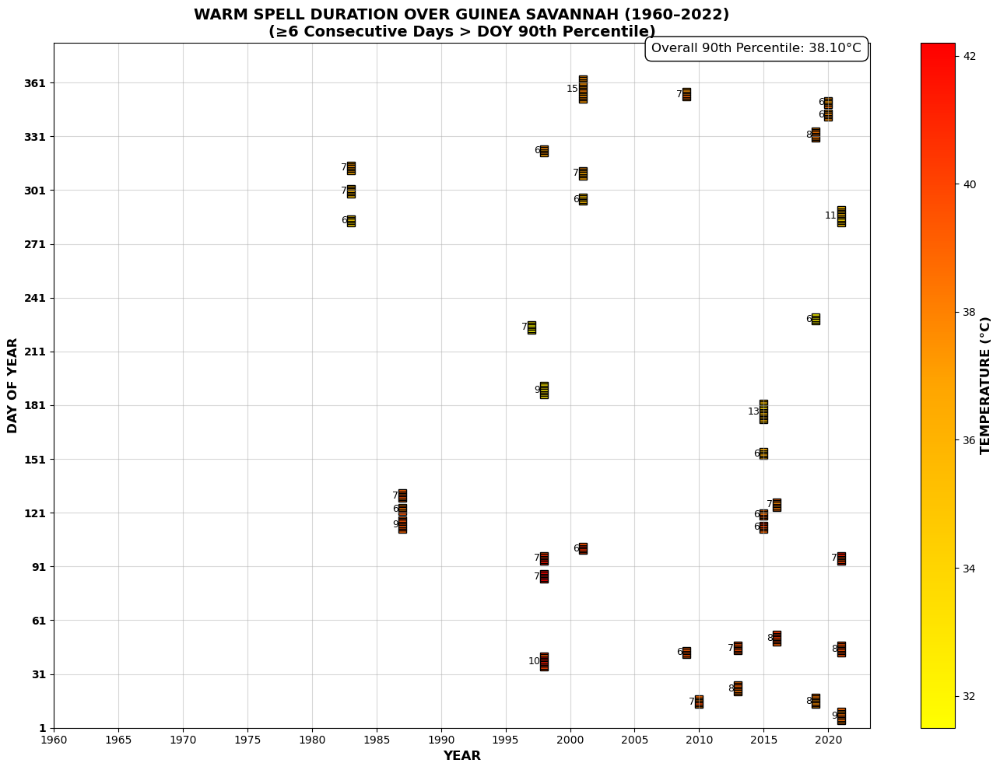

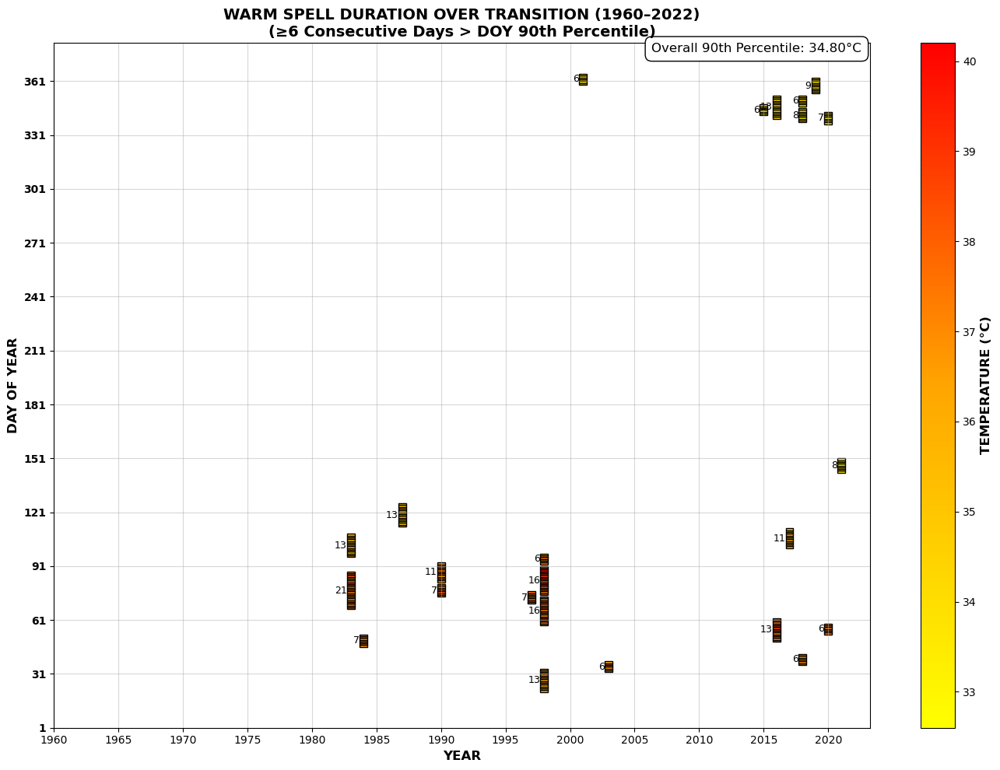

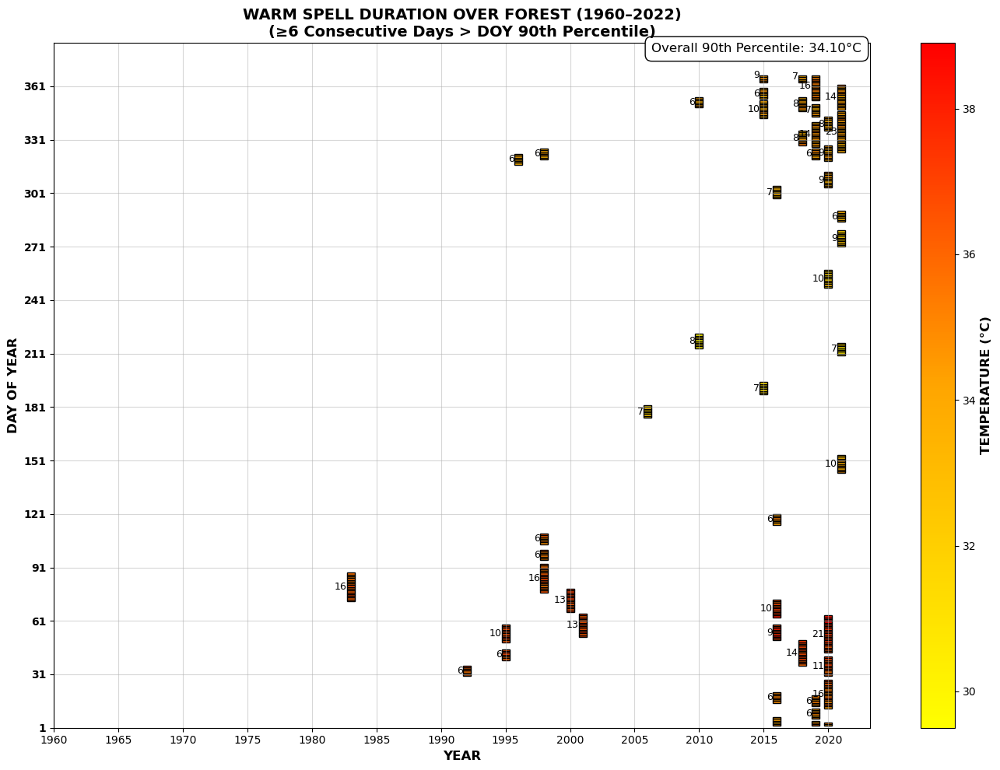

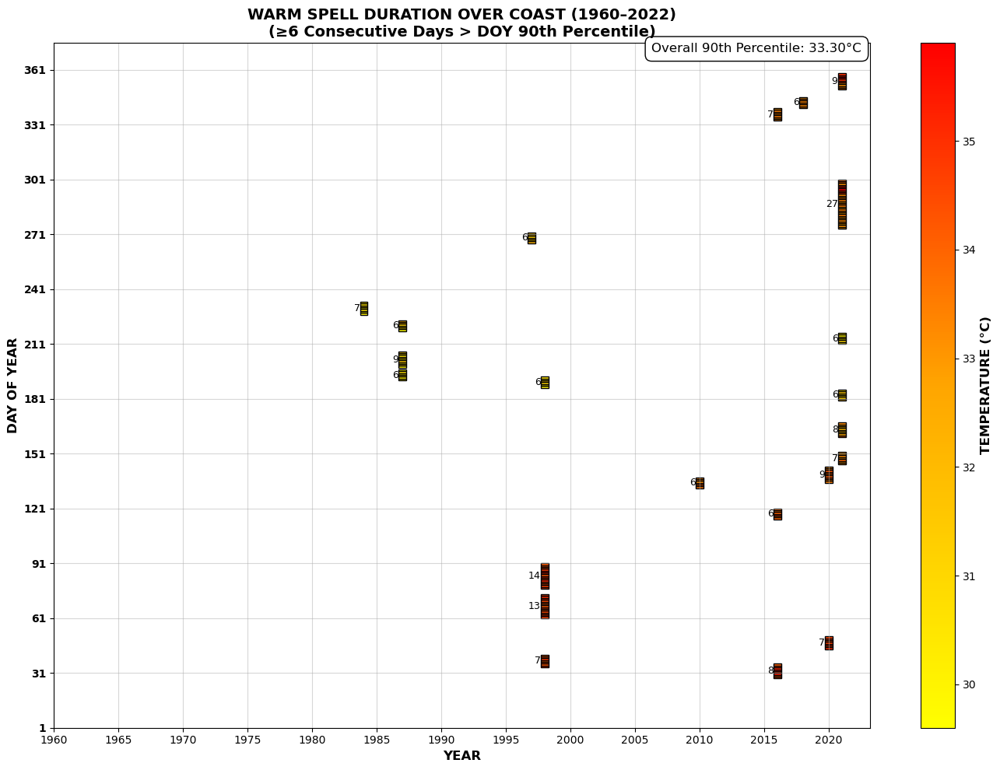

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
from matplotlib.cm import ScalarMappable

# Custom heatwave color map
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["yellow", "orange", "red"])

# Station file paths
stations = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTx_complete.txt',
    'Guinea Savannah': 'Yendi_1960_2022_dTx_complete.txt',
    'Transition': 'Wenchi_1960_2022_dTx_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTx_complete.txt',
    'Coast': 'Accra_1960_2022_dTx_complete.txt',
}

# Function to identify consecutive exceedance events
def detect_heatwave_events(df, min_duration=6):
    events = []
    df = df.copy()
    df['exceed'] = df['Tmax'] > df['threshold']
    df = df[df['exceed']]  # Only keep exceeding days

    df['gap'] = (df.index.to_series().diff() != pd.Timedelta(days=1)).cumsum()
    for _, group in df.groupby('gap'):
        if len(group) >= min_duration:
            events.append({
                'date_start': group.index[0],
                'date_end': group.index[-1],
                'temperatures': group['Tmax'].values
            })
    return events

# Plotting function
def plot_heatwave_events(episodes, percentile, station_name):
    if not episodes:
        print(f"No heatwave events for {station_name}")
        return

    all_temps = np.concatenate([ep['temperatures'] for ep in episodes])
    norm = Normalize(vmin=all_temps.min(), vmax=all_temps.max())

    fig, ax = plt.subplots(figsize=(14, 10))

    for ep in episodes:
        for i, temp in enumerate(ep['temperatures']):
            date = ep['date_start'] + pd.Timedelta(days=i)
            year = date.year
            doy = date.timetuple().tm_yday
            ax.bar(year, 1, bottom=doy, width=0.6, color=cmap(norm(temp)), edgecolor='black')

        y_mid = ep['date_start'].timetuple().tm_yday + len(ep['temperatures']) / 2
        ax.text(ep['date_start'].year - 0.3, y_mid, f"{len(ep['temperatures'])}", ha='right', va='center',
                fontsize=9, color='black')

    ax.set_xticks(np.arange(1960, 2023, 5))
    ax.set_yticks(np.arange(0, 366, 30))
    ax.set_yticklabels([str(d) for d in range(1, 366, 30)], fontweight='bold')
    ax.set_xlabel('YEAR', fontsize=12, fontweight='bold')
    ax.set_ylabel('DAY OF YEAR', fontsize=12, fontweight='bold')
    ax.set_title(f"WARM SPELL DURATION OVER {station_name.upper()} (1960–2022)\n(≥6 Consecutive Days > DOY 90th Percentile)",
                 fontsize=14, fontweight='bold')

    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('TEMPERATURE (°C)', fontsize=12, fontweight='bold')

    ax.annotate(f'Overall 90th Percentile: {percentile:.2f}°C', xy=(0.99, 1), xycoords='axes fraction',
                ha='right', va='top', fontsize=12,
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

    ax.grid(True, alpha=0.5)
    plt.tight_layout()
    plt.savefig(f"HEATWAVE_EVENTS_{station_name.replace(' ', '_')}.png", dpi=300)
    plt.show()

# Main loop for all stations
for station_name, file in stations.items():
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    # df = df[(df.index.year >= 1960) & (df.index.year <= 2022)].dropna()

    # Include Feb 29 in climatology
    df['doy'] = df.index.strftime('%m-%d')
    clim_p90 = df.groupby('doy')['Tmax'].quantile(0.9)
    df['threshold'] = df['doy'].map(clim_p90)

    # Detect heatwave events (≥6 days above threshold consecutively)
    heatwave_events = detect_heatwave_events(df, min_duration=6)

    # Overall 90th percentile for annotation
    overall_p90 = df['Tmax'].quantile(0.9)

    # Plot results
    plot_heatwave_events(heatwave_events, overall_p90, station_name)


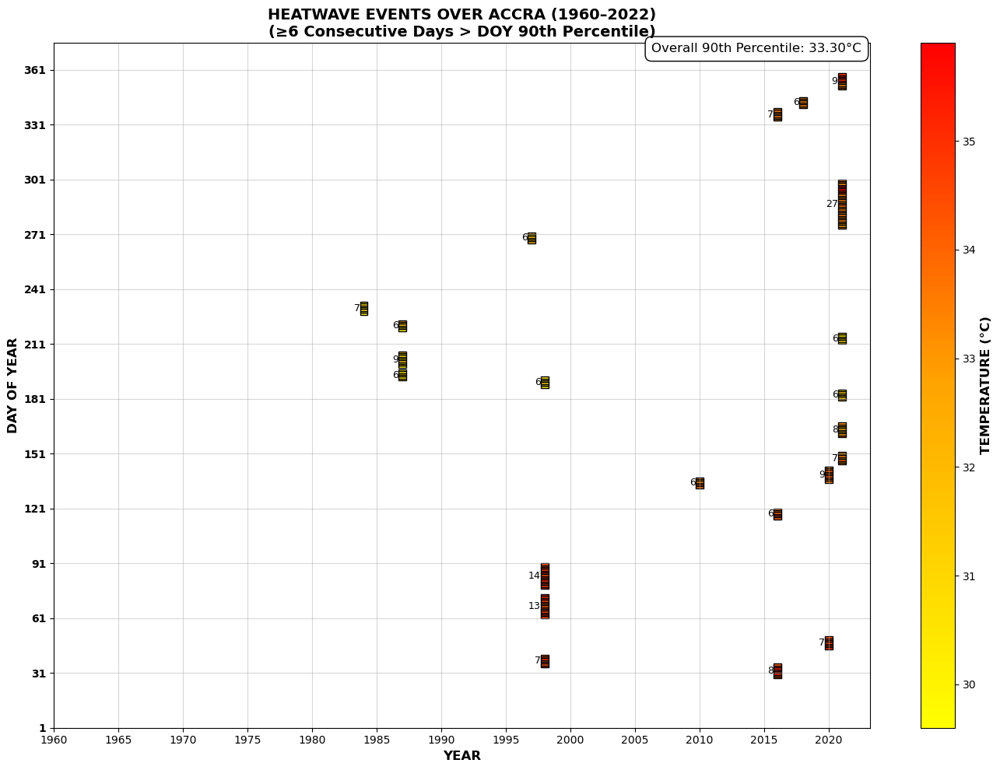

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
from matplotlib.cm import ScalarMappable

# Define colormap
cmap = LinearSegmentedColormap.from_list("custom_cmap", ["yellow", "orange", "red"])

# Load Accra Tmax data
file = 'Accra_1960_2022_dTx_complete.txt'
station_name = 'Accra'

# Read and process data
df = pd.read_csv(file, sep=r'\s+', header=None, names=['year', 'month', 'day', 'Tmax'])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)
# df = df[(df.index.year >= 1960) & (df.index.year <= 2022)].dropna(subset=['Tmax'])

# Include Feb 29 for daily climatology
df['doy'] = df.index.strftime('%m-%d')

# Compute DOY-specific 90th percentile
clim_p90 = df.groupby('doy')['Tmax'].quantile(0.90)
df['threshold'] = df['doy'].map(clim_p90)
df['exceed'] = df['Tmax'] > df['threshold']

# Keep only exceedance days
df_exceed = df[df['exceed']].copy()

# Detect consecutive periods (heatwaves)
df_exceed['gap'] = (df_exceed.index.to_series().diff() != pd.Timedelta(days=1)).cumsum()

heatwaves = []
for _, group in df_exceed.groupby('gap'):
    if len(group) >= 6:
        heatwaves.append({
            'date_start': group.index[0],
            'date_end': group.index[-1],
            'temperatures': group['Tmax'].values
        })

# Check if any found
if not heatwaves:
    print("No heatwaves detected for Accra.")
else:
    # Flatten temperatures for normalization
    all_temps = np.concatenate([ep['temperatures'] for ep in heatwaves])
    norm = Normalize(vmin=all_temps.min(), vmax=all_temps.max())

    # Plotting
    fig, ax = plt.subplots(figsize=(14, 10))

    for ep in heatwaves:
        for i, temp in enumerate(ep['temperatures']):
            date = ep['date_start'] + pd.Timedelta(days=i)
            year = date.year
            doy = date.timetuple().tm_yday
            ax.bar(year, 1, bottom=doy, width=0.6, color=cmap(norm(temp)), edgecolor='black')

        y_mid = ep['date_start'].timetuple().tm_yday + len(ep['temperatures']) / 2
        ax.text(ep['date_start'].year - 0.3, y_mid, f"{len(ep['temperatures'])}", ha='right',
                va='center', fontsize=9, color='black')

    # Axis and colorbar settings
    ax.set_xticks(np.arange(1960, 2023, 5))
    ax.set_yticks(np.arange(0, 366, 30))
    ax.set_yticklabels([str(d) for d in range(1, 366, 30)], fontweight='bold')
    ax.set_xlabel('YEAR', fontsize=12, fontweight='bold')
    ax.set_ylabel('DAY OF YEAR', fontsize=12, fontweight='bold')
    ax.set_title(f"HEATWAVE EVENTS OVER {station_name.upper()} (1960–2022)\n(≥6 Consecutive Days > DOY 90th Percentile)",
                 fontsize=14, fontweight='bold')

    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('TEMPERATURE (°C)', fontsize=12, fontweight='bold')

    overall_p90 = df['Tmax'].quantile(0.90)
    ax.annotate(f'Overall 90th Percentile: {overall_p90:.2f}°C', xy=(0.99, 1), xycoords='axes fraction',
                ha='right', va='top', fontsize=12,
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

    ax.grid(True, alpha=0.5)
    plt.tight_layout()
    plt.savefig(f"HEATWAVE_EVENTS_{station_name}.png", dpi=300)
    plt.show()


In [24]:
import pandas as pd
import numpy as np

# Load Accra Tmax data
file = 'Accra_1960_2022_dTx_complete.txt'
df = pd.read_csv(file, sep=r'\s+', header=None, names=['year', 'month', 'day', 'Tmax'])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)
# df = df[(df.index.year >= 1960) & (df.index.year <= 2022)].dropna(subset=['Tmax'])

# Include Feb 29
df['doy'] = df.index.strftime('%m-%d')

# Compute daily 90th percentile
clim_p90 = df.groupby('doy')['Tmax'].quantile(0.9)
df['threshold'] = df['doy'].map(clim_p90)
df['exceed'] = df['Tmax'] > df['threshold']

# Filter only exceedance days
df_exceed = df[df['exceed']].copy()

# Identify consecutive periods
df_exceed['gap'] = (df_exceed.index.to_series().diff() != pd.Timedelta(days=1)).cumsum()

# Prepare a list of consecutive exceedance sequences
consecutive_groups = []
for _, group in df_exceed.groupby('gap'):
    if len(group) >= 6:
        consecutive_groups.append(group[['Tmax']])

# Preview first few exceedance days and a few consecutive sequences
exceed_preview = df[df['exceed']][['year', 'month', 'day', 'Tmax']].head(10)
first_sequence = consecutive_groups[0] if consecutive_groups else pd.DataFrame()

exceed_preview, first_sequence.to_csv('exceed.csv')


(            year  month  day  Tmax
 date                              
 1960-05-29  1960      5   29  32.8
 1960-05-30  1960      5   30  32.2
 1960-06-17  1960      6   17  31.7
 1960-07-24  1960      7   24  30.0
 1960-09-07  1960      9    7  31.1
 1960-09-25  1960      9   25  31.1
 1960-10-02  1960     10    2  31.7
 1960-10-10  1960     10   10  32.2
 1960-11-29  1960     11   29  32.8
 1960-12-05  1960     12    5  33.3,
 None)

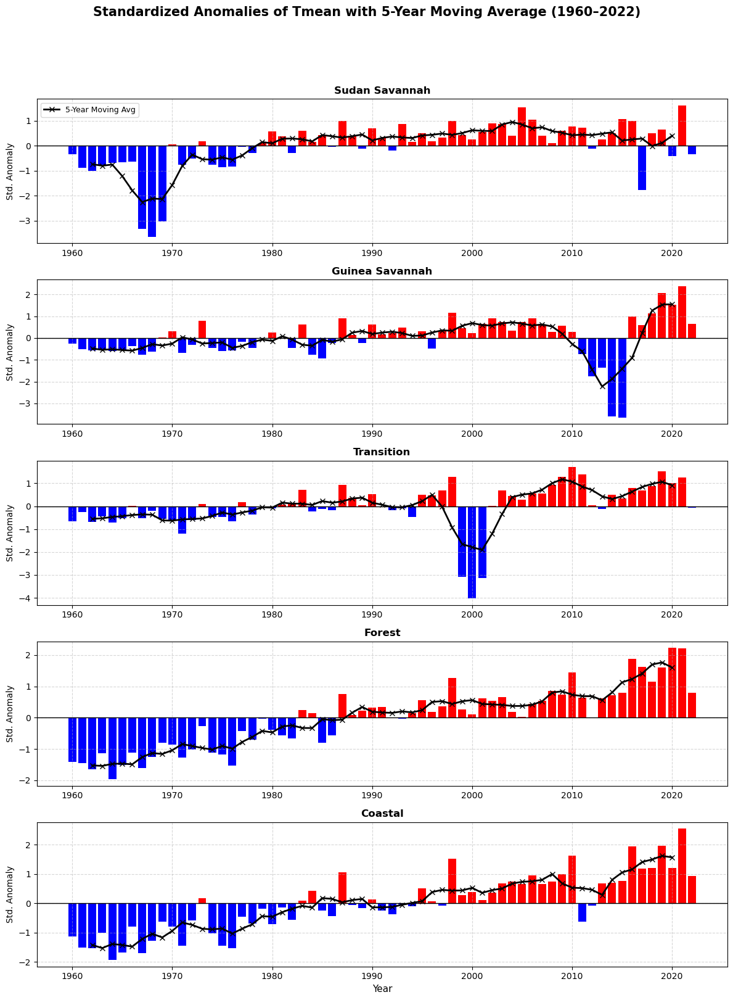

In [32]:
import pandas as pd
import matplotlib.pyplot as plt

# Define station names and corresponding Tmax and Tmin files
stations = {
    'Sudan Savannah': ('Navrongo_1960_2022_dTx_complete.txt', 'Navrongo_1960_2022_dTn_complete.txt'),
    'Guinea Savannah': ('Tamale_1960_2022_dTx_complete.txt', 'Tamale_1960_2022_dTn_complete.txt'),
    'Transition': ('Wenchi_1960_2022_dTx_complete.txt', 'Wenchi_1960_2022_dTn_complete.txt'),
    'Forest': ('Kumasi_1960_2022_dTx_complete.txt', 'Kumasi_1960_2022_dTn_complete.txt'),
    'Coastal': ('Accra_1960_2022_dTx_complete.txt', 'Accra_1960_2022_dTn_complete.txt')
}

# Create subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 16), sharex=False)
axes = axes.flatten()

for i, (station, (file_tx, file_tn)) in enumerate(stations.items()):
    # Load Tmax and Tmin
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])

    # Compute Tmean
    df_tx['Tmin'] = df_tn['Tmin']
    df_tx['Tmean'] = (df_tx['Tmax'] + df_tx['Tmin']) / 2

    # Parse date and set index
    df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
    df_tx.dropna(subset=['date'], inplace=True)
    df_tx.set_index('date', inplace=True)

    # Resample to get annual mean Tmean
    annual_mean = df_tx['Tmean'].resample('Y').mean()
    df = pd.DataFrame({'year': annual_mean.index.year, 'Tmean': annual_mean.values})
    df.dropna(inplace=True)
    df.set_index('year', inplace=True)

    # Calculate standardized anomaly
    df['anomaly'] = (df['Tmean'] - df['Tmean'].mean()) / df['Tmean'].std()

    # 5-year moving average
    df['moving_avg'] = df['anomaly'].rolling(window=5, center=True).mean()

    # Bar colors based on sign
    colors = ['red' if val > 0 else 'blue' for val in df['anomaly']]

    # Plotting
    ax = axes[i]
    ax.bar(df.index, df['anomaly'], color=colors, width=0.8)
    ax.plot(df.index, df['moving_avg'], color='black', linewidth=2, marker='x', label='5-Year Moving Avg')
    ax.axhline(0, color='black', linewidth=1)

    # Styling
    ax.set_title(station, fontsize=12, fontweight='bold')
    ax.set_ylabel("Std. Anomaly", fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 4:
        ax.set_xlabel("Year", fontsize=11)
    if i == 0:
        ax.legend(loc='upper left', fontsize=9)

# Suptitle and layout
fig.suptitle("Standardized Anomalies of Tmean with 5-Year Moving Average (1960–2022)", fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save figure
# plt.savefig("Tmean_Standardized_Anomalies_with_Moving_Average.png", dpi=500)
plt.show()


C:\Users\ampon\AppData\Local\Temp\ipykernel_16924\3442241429.py:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_mean = df_tx['Tmean'].resample('Y').mean()
C:\Users\ampon\AppData\Local\Temp\ipykernel_16924\3442241429.py:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_mean = df_tx['Tmean'].resample('Y').mean()
C:\Users\ampon\AppData\Local\Temp\ipykernel_16924\3442241429.py:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_mean = df_tx['Tmean'].resample('Y').mean()
C:\Users\ampon\AppData\Local\Temp\ipykernel_16924\3442241429.py:32: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  annual_mean = df_tx['Tmean'].resample('Y').mean()
C:\Users\ampon\AppData\Local\Temp\ipykernel_16924\3442241429.py:32: FutureWarning: 'Y' is deprecated and will be removed in 

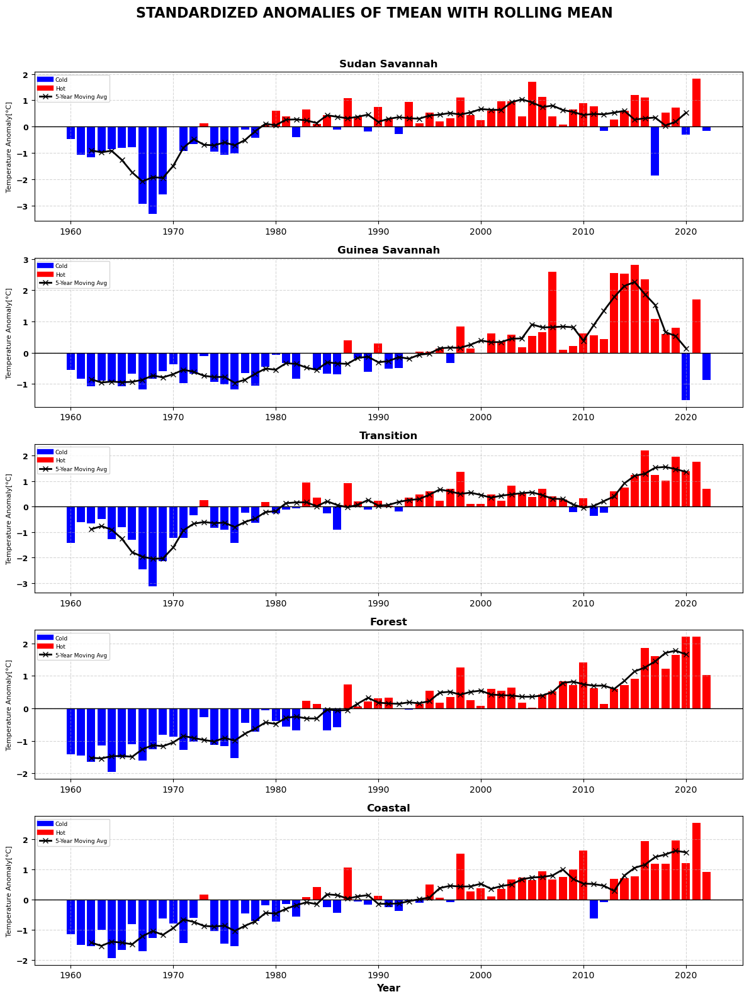

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Define station names and corresponding Tmax and Tmin files
stations = {
    'Sudan Savannah': ('Navrongo_1960_2022_dTx_complete.txt', 'Navrongo_1960_2022_dTn_complete.txt'),
    'Guinea Savannah': ('Yendi_1960_2022_dTx_complete.txt', 'Yendi_1960_2022_dTn_complete.txt'),
    'Transition': ('Sunyani_1960_2022_dTx_complete.txt', 'Sunyani_1960_2022_dTn_complete.txt'),
    'Forest': ('Kumasi_1960_2022_dTx_complete.txt', 'Kumasi_1960_2022_dTn_complete.txt'),
    'Coastal': ('Accra_1960_2022_dTx_complete.txt', 'Accra_1960_2022_dTn_complete.txt')
}

# Create subplots (not sharing X)
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 16), sharex=False)
axes = axes.flatten()

for i, (station, (file_tx, file_tn)) in enumerate(stations.items()):
    # Load Tmax and Tmin
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])

    # Compute Tmean
    df_tx['Tmin'] = df_tn['Tmin']
    df_tx['Tmean'] = (df_tx['Tmax'] + df_tx['Tmin']) / 2

    # Parse date and set index
    df_tx['date'] = pd.to_datetime(df_tx[['year', 'month', 'day']], errors='coerce')
    df_tx.dropna(subset=['date'], inplace=True)
    df_tx.set_index('date', inplace=True)

    # Resample to get annual mean Tmean
    annual_mean = df_tx['Tmean'].resample('Y').mean()
    df = pd.DataFrame({'year': annual_mean.index.year, 'Tmean': annual_mean.values})
    df.dropna(inplace=True)
    df.set_index('year', inplace=True)

    # Calculate standardized anomaly
    df['anomaly'] = (df['Tmean'] - df['Tmean'].mean()) / df['Tmean'].std()

    # 5-year moving average
    df['moving_avg'] = df['anomaly'].rolling(window=5, center=True).mean()

    # Color code bars
    colors = ['red' if val > 0 else 'blue' for val in df['anomaly']]

    # Plotting
    ax = axes[i]
    bars = ax.bar(df.index, df['anomaly'], color=colors, width=0.8, label='Standardized Anomaly')
    line = ax.plot(df.index, df['moving_avg'], color='black', linewidth=2, marker='x', label='5-Year Moving Avg')
    ax.axhline(0, color='black', linewidth=1)


    # Make y-axis tick labels bold
    ax.tick_params(axis='y', labelsize=9)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Styling
    ax.set_title(station, fontsize=12, fontweight='bold')
    ax.set_ylabel("Temperature Anomaly[°C]", fontsize=8)#, fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 4:
        ax.set_xlabel("Year", fontsize=11, fontweight='bold')

    # Custom legend per subplot
    ax.legend(
        handles=[
            plt.Line2D([0], [0], color='blue', lw=6, label='Cold'),
            plt.Line2D([0], [0], color='red', lw=6, label='Hot'),
            plt.Line2D([0], [0], color='black', marker='x', lw=2, label='5-Year Moving Avg')
        ],
        loc='upper left', fontsize=6.5
    )

# Add overall title
fig.suptitle("STANDARDIZED ANOMALIES OF TMEAN WITH ROLLING MEAN", fontsize=16, fontweight='bold', y=0.99)

# Tight layout and save
plt.tight_layout(rect=[0, 0, 1, 0.97])
# plt.savefig("Tmean_Standardized_Anomalies_Legend_Ybold.png", dpi=500)
plt.show()


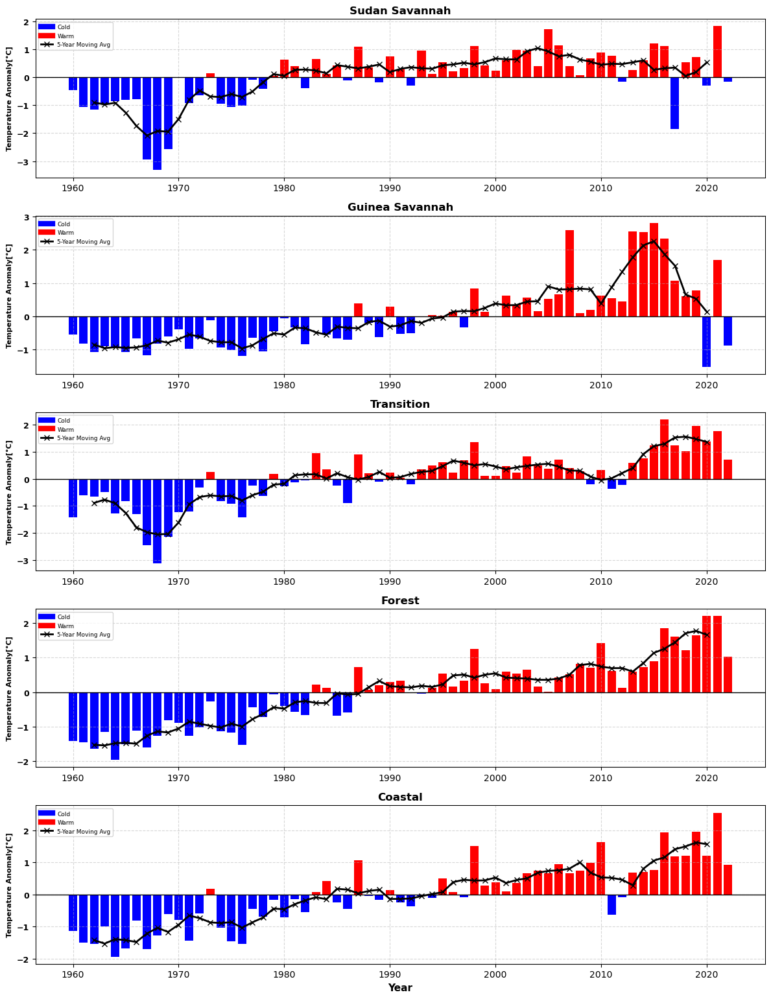

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Define station names and corresponding Tmax and Tmin files
stations = {
    'Sudan Savannah': ('Navrongo_1960_2022_dTx_complete.txt', 'Navrongo_1960_2022_dTn_complete.txt'),
    'Guinea Savannah': ('Yendi_1960_2022_dTx_complete.txt', 'Yendi_1960_2022_dTn_complete.txt'),
    'Transition': ('Sunyani_1960_2022_dTx_complete.txt', 'Sunyani_1960_2022_dTn_complete.txt'),
    'Forest': ('Kumasi_1960_2022_dTx_complete.txt', 'Kumasi_1960_2022_dTn_complete.txt'),
    'Coastal': ('Accra_1960_2022_dTx_complete.txt', 'Accra_1960_2022_dTn_complete.txt')
}

# Create subplots (not sharing X)
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 16), sharex=False)
axes = axes.flatten()

for i, (station, (file_tx, file_tn)) in enumerate(stations.items()):
    # Load Tmax and Tmin
    df_tx = pd.read_csv(file_tx, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])

    # Combine to compute Tmean
    df_tx['Tmin'] = df_tn['Tmin']
    df_tx['Tmean'] = (df_tx['Tmax'] + df_tx['Tmin']) / 2

    # Drop missing values
    df_tx.dropna(subset=['Tmean'], inplace=True)

    # Group by year and compute annual mean Tmean
    annual_mean = df_tx.groupby('year')['Tmean'].mean().reset_index()
    annual_mean.set_index('year', inplace=True)

    # Standardized anomaly
    annual_mean['anomaly'] = (annual_mean['Tmean'] - annual_mean['Tmean'].mean()) / annual_mean['Tmean'].std()

    # 5-year centered moving average
    annual_mean['moving_avg'] = annual_mean['anomaly'].rolling(window=5, center=True).mean()

    # Color code
    colors = ['red' if val > 0 else 'blue' for val in annual_mean['anomaly']]

    # Plotting
    ax = axes[i]
    ax.bar(annual_mean.index, annual_mean['anomaly'], color=colors, width=0.8, label='Standardized Anomaly')
    ax.plot(annual_mean.index, annual_mean['moving_avg'], color='black', linewidth=2, marker='x', label='5-Year Moving Avg')
    ax.axhline(0, color='black', linewidth=1)

    # Bold y-tick labels
    ax.tick_params(axis='y', labelsize=9)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Titles and axis
    ax.set_title(station, fontsize=12, fontweight='bold')
    ax.set_ylabel("Temperature Anomaly[°C]",fontweight='bold', fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 4:
        ax.set_xlabel("Year", fontsize=11, fontweight='bold')

    # Legend
    ax.legend(
        handles=[
            plt.Line2D([0], [0], color='blue', lw=6, label='Cold'),
            plt.Line2D([0], [0], color='red', lw=6, label='Warm'),
            plt.Line2D([0], [0], color='black', marker='x', lw=2, label='5-Year Moving Avg')
        ],
        loc='upper left', fontsize=6.5
    )

# Title and layout
#fig.suptitle("STANDARDIZED ANOMALIES OF TMEAN WITH ROLLING MEAN", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig("Tmean_Standardized_Anomalies.png")
plt.show()


In [ ]:
Nav

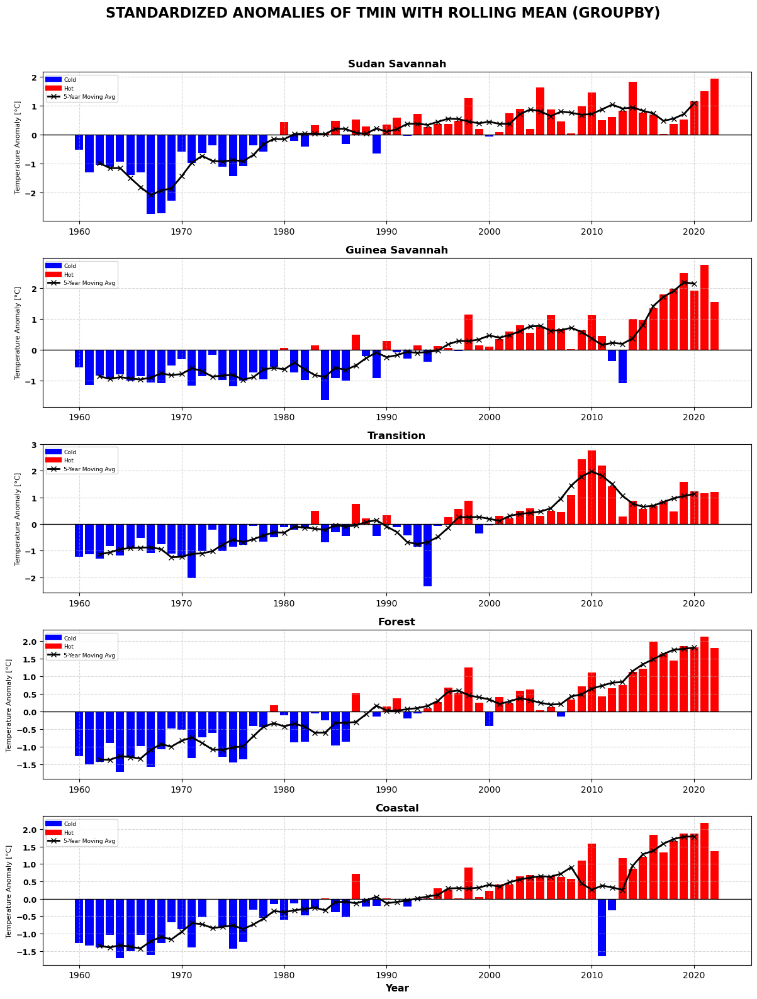

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# Define station names and corresponding Tmin files
stations = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTn_complete.txt',
    'Guinea Savannah': 'Tamale_1960_2022_dTn_complete.txt',
    'Transition': 'Wenchi_1960_2022_dTn_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTn_complete.txt',
    'Coastal': 'Accra_1960_2022_dTn_complete.txt'
}

# Create subplots (not sharing X)
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 16), sharex=False)
axes = axes.flatten()

for i, (station, file_tn) in enumerate(stations.items()):
    # Load Tmin data
    df = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    
    # Drop missing Tmin values
    df.dropna(subset=['Tmin'], inplace=True)

    # Group by year and calculate annual average Tmin
    annual_avg = df.groupby('year')['Tmin'].mean().reset_index()
    annual_avg.set_index('year', inplace=True)

    # Standardized anomaly
    mean_val = annual_avg['Tmin'].mean()
    std_val = annual_avg['Tmin'].std()
    annual_avg['anomaly'] = (annual_avg['Tmin'] - mean_val) / std_val

    # 5-year centered moving average
    annual_avg['moving_avg'] = annual_avg['anomaly'].rolling(window=5, center=True).mean()

    # Colors
    colors = ['red' if x > 0 else 'blue' for x in annual_avg['anomaly']]

    # Plotting
    ax = axes[i]
    ax.bar(annual_avg.index, annual_avg['anomaly'], color=colors, width=0.8)
    ax.plot(annual_avg.index, annual_avg['moving_avg'], color='black', linewidth=2, marker='x')
    ax.axhline(0, color='black', linewidth=1)

    # Bold y-axis ticks
    ax.tick_params(axis='y', labelsize=9)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Labels and styling
    ax.set_title(station, fontsize=12, fontweight='bold')
    ax.set_ylabel("Temperature Anomaly [°C]", fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 4:
        ax.set_xlabel("Year", fontsize=11, fontweight='bold')

    # Legend
    ax.legend(
        handles=[
            plt.Line2D([0], [0], color='blue', lw=6, label='Cold'),
            plt.Line2D([0], [0], color='red', lw=6, label='Hot'),
            plt.Line2D([0], [0], color='black', marker='x', lw=2, label='5-Year Moving Avg')
        ],
        loc='upper left', fontsize=6.5
    )

# Title and layout
fig.suptitle("STANDARDIZED ANOMALIES OF TMIN WITH ROLLING MEAN ", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout(rect=[0, 0, 1, 0.97])
# plt.savefig("Tmin_Standardized_Anomalies_GroupBy.png", dpi=500)
plt.show()


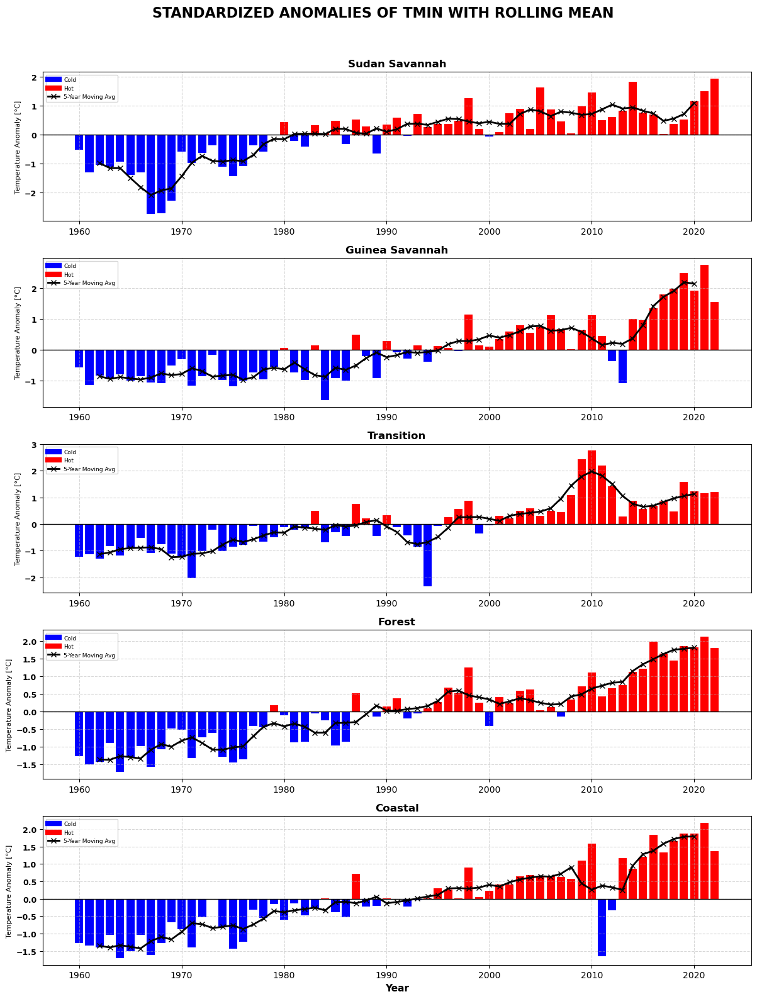

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Define station names and corresponding Tmin files
stations = {
    'Sudan Savannah': 'Navrongo_1960_2022_dTn_complete.txt',
    'Guinea Savannah': 'Tamale_1960_2022_dTn_complete.txt',
    'Transition': 'Wenchi_1960_2022_dTn_complete.txt',
    'Forest': 'Kumasi_1960_2022_dTn_complete.txt',
    'Coastal': 'Accra_1960_2022_dTn_complete.txt'
}

# Create subplots (not sharing X)
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 16), sharex=False)
axes = axes.flatten()

for i, (station, file_tn) in enumerate(stations.items()):
    # Load Tmin
    df_tn = pd.read_csv(file_tn, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])

    # Parse date and set index
    df_tn['date'] = pd.to_datetime(df_tn[['year', 'month', 'day']], errors='coerce')
    df_tn.dropna(subset=['date'], inplace=True)
    df_tn.set_index('date', inplace=True)

    # Resample to get annual mean Tmin
    annual_mean = df_tn['Tmin'].resample('Y').mean()
    df = pd.DataFrame({'year': annual_mean.index.year, 'Tmin': annual_mean.values})
    df.dropna(inplace=True)
    df.set_index('year', inplace=True)

    # Calculate standardized anomaly
    df['anomaly'] = (df['Tmin'] - df['Tmin'].mean()) / df['Tmin'].std()

    # 5-year moving average
    df['moving_avg'] = df['anomaly'].rolling(window=5, center=True).mean()

    # Color code bars
    colors = ['red' if val > 0 else 'blue' for val in df['anomaly']]

    # Plotting
    ax = axes[i]
    ax.bar(df.index, df['anomaly'], color=colors, width=0.8, label='Standardized Anomaly')
    ax.plot(df.index, df['moving_avg'], color='black', linewidth=2, marker='x', label='5-Year Moving Avg')
    ax.axhline(0, color='black', linewidth=1)

    # Bold y-axis tick labels
    ax.tick_params(axis='y', labelsize=9)
    for label in ax.get_yticklabels():
        label.set_fontweight('bold')

    # Styling
    ax.set_title(station, fontsize=12, fontweight='bold')
    ax.set_ylabel("Temperature Anomaly [°C]", fontsize=8)
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 4:
        ax.set_xlabel("Year", fontsize=11, fontweight='bold')

    # Custom legend
    ax.legend(
        handles=[
            plt.Line2D([0], [0], color='blue', lw=6, label='Cold'),
            plt.Line2D([0], [0], color='red', lw=6, label='Hot'),
            plt.Line2D([0], [0], color='black', marker='x', lw=2, label='5-Year Moving Avg')
        ],
        loc='upper left', fontsize=6.5
    )

# Overall title
fig.suptitle("STANDARDIZED ANOMALIES OF TMIN WITH ROLLING MEAN", fontsize=16, fontweight='bold', y=0.99)

# Layout and save
plt.tight_layout(rect=[0, 0, 1, 0.97])
# plt.savefig("Tmin_Standardized_Anomalies.png", dpi=500)
plt.show()


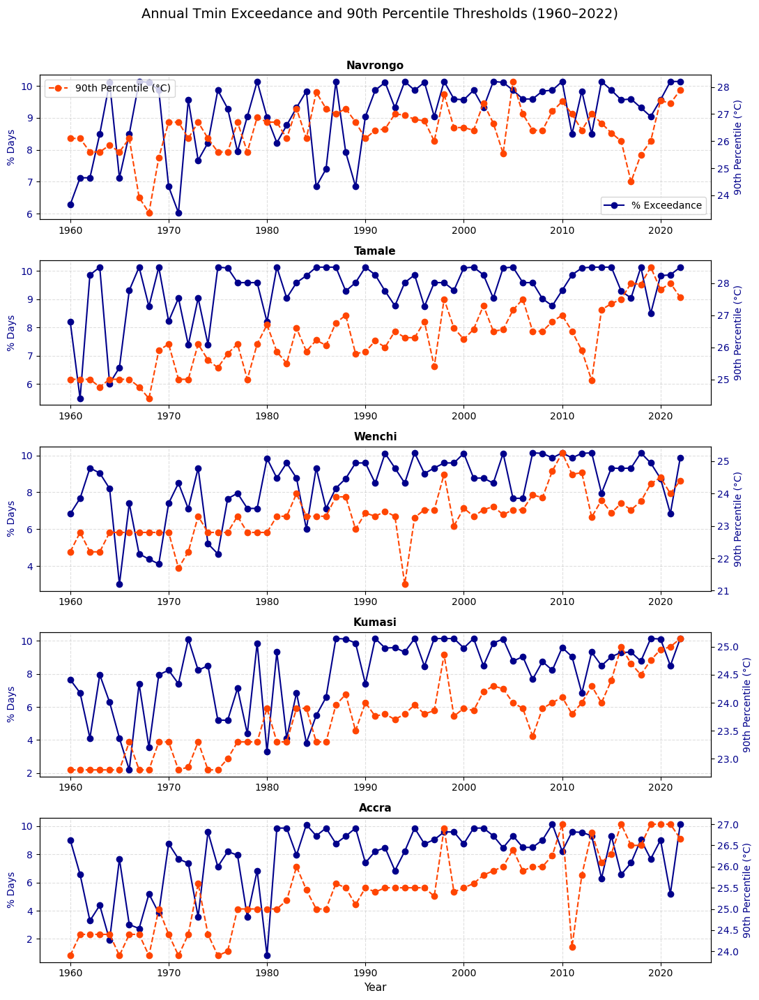

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths for Tmin
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2024_dTn_complete.txt',
    'Tamale': 'Tamale_1960_2024_dTn_complete.txt',
    'Wenchi': 'Wenchi_1960_2024_dTn_complete.txt',
    'Kumasi': 'Kumasi_1960_2024_dTn_complete.txt',
    'Accra': 'Accra_1960_2024_dTn_complete.txt',
}

# Set up subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations_tmin.items()):
    # Load and format
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmin"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmin'])

    # Group by year
    yearly_data = df.groupby(df.index.year)

    # For each year, compute 90th percentile and % exceedance
    annual_90th = yearly_data['Tmin'].quantile(0.9)
    annual_exceed = yearly_data.apply(lambda x: (x['Tmin'] > np.percentile(x['Tmin'], 90)).mean() * 100)

    # Plot
    ax = axes[i]
    ax2 = ax.twinx()

    ax.plot(annual_exceed.index, annual_exceed.values, 'o-',color='darkblue', label='% Exceedance')
    ax.set_ylabel('% Days', color='darkblue')
    ax.tick_params(axis='y', labelcolor='darkblue')

    ax2.plot(annual_90th.index, annual_90th.values, 'o--',color='orangered', label='90th Percentile (°C)')
    ax2.set_ylabel('90th Percentile (°C)', color='darkblue')
    ax2.tick_params(axis='y', labelcolor='darkblue')

    ax.set_title(f"{name}",fontweight='bold', fontsize=11)
    ax.grid(True, linestyle='--', alpha=0.4)

    # Optional legends (only on one side for clarity)
    if i == 0:
        ax.legend(loc='best')
        ax2.legend(loc='best')

# Global X label and title
axes[-1].set_xlabel("Year", fontsize=11)
fig.suptitle("Annual Tmin Exceedance and 90th Percentile Thresholds (1960–2022)", fontsize=14, y=1.02)
plt.tight_layout()
fig.savefig('percentmin_both.png', bbox_inches='tight')
plt.show()


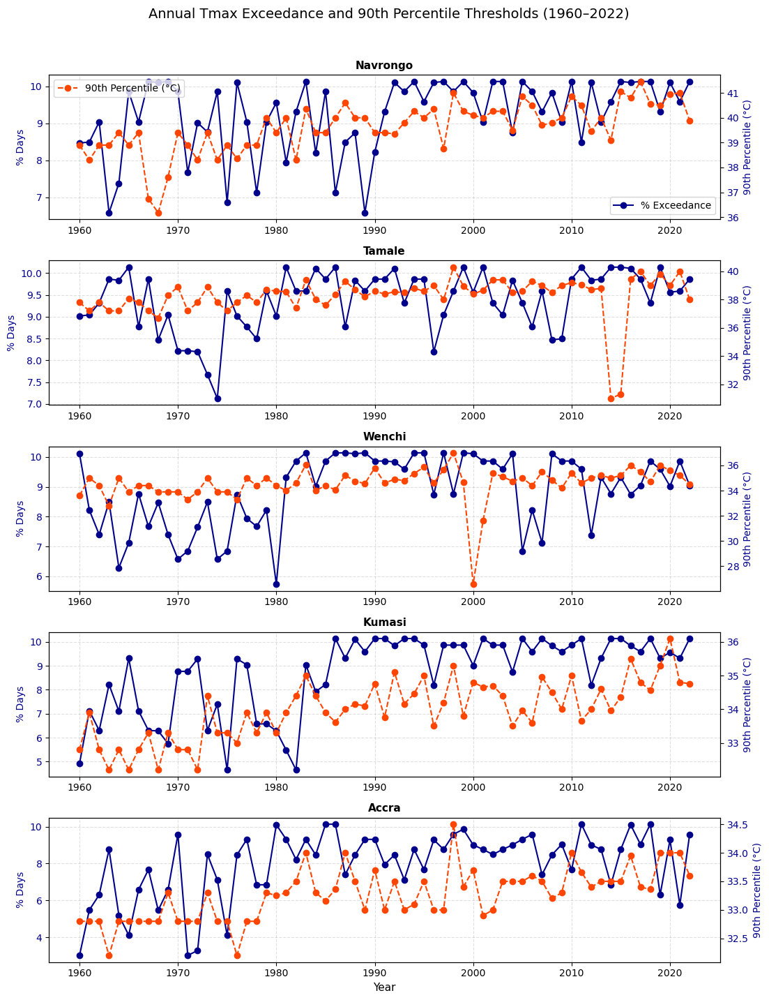

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths for Tmin
stations_tmin = {
    'Navrongo': 'Navrongo_1960_2024_dTx_complete.txt',
    'Tamale': 'Tamale_1960_2024_dTx_complete.txt',
    'Wenchi': 'Wenchi_1960_2024_dTx_complete.txt',
    'Kumasi': 'Kumasi_1960_2024_dTx_complete.txt',
    'Accra': 'Accra_1960_2024_dTx_complete.txt',
}

# Set up subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations_tmin.items()):
    # Load and format
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmax'])

    # Group by year
    yearly_data = df.groupby(df.index.year)

    # For each year, compute 90th percentile and % exceedance
    annual_90th = yearly_data['Tmax'].quantile(0.9)
    annual_exceed = yearly_data.apply(lambda x: (x['Tmax'] > np.percentile(x['Tmax'], 90)).mean() * 100)

    # Plot
    ax = axes[i]
    ax2 = ax.twinx()

    ax.plot(annual_exceed.index, annual_exceed.values, 'o-',color='darkblue', label='% Exceedance')
    ax.set_ylabel('% Days', color='darkblue')
    ax.tick_params(axis='y', labelcolor='darkblue')

    ax2.plot(annual_90th.index, annual_90th.values, 'o--',color='orangered', label='90th Percentile (°C)')
    ax2.set_ylabel('90th Percentile (°C)', color='darkblue')
    ax2.tick_params(axis='y', labelcolor='darkblue')

    ax.set_title(f"{name}",fontweight='bold', fontsize=11)
    ax.grid(True, linestyle='--', alpha=0.4)

    # Optional legends (only on one side for clarity)
    if i == 0:
        ax.legend(loc='best')
        ax2.legend(loc='best')

# Global X label and title
axes[-1].set_xlabel("Year", fontsize=11)
fig.suptitle("Annual Tmax Exceedance and 90th Percentile Thresholds (1960–2022)", fontsize=14, y=1.02)
plt.tight_layout()
fig.savefig('percentmax_both.png', bbox_inches='tight')
plt.show()


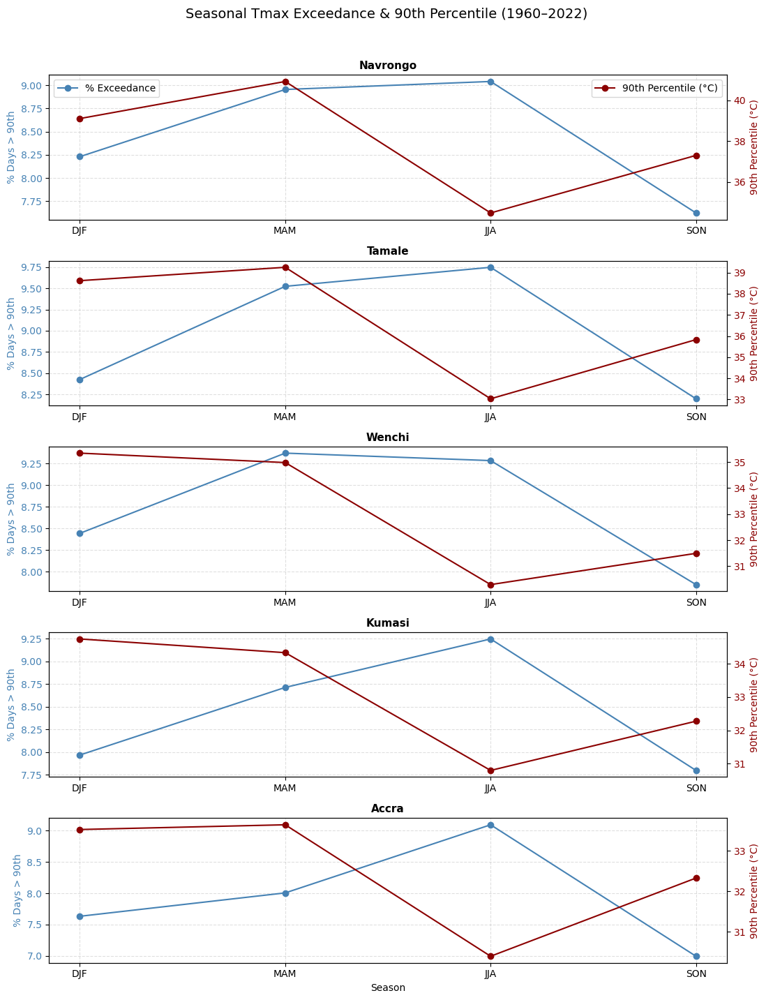

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths for Tmax
stations_tmax = {
    'Navrongo': 'Navrongo_1960_2024_dTx_complete.txt',
    'Tamale': 'Tamale_1960_2024_dTx_complete.txt',
    'Wenchi': 'Wenchi_1960_2024_dTx_complete.txt',
    'Kumasi': 'Kumasi_1960_2024_dTx_complete.txt',
    'Accra': 'Accra_1960_2024_dTx_complete.txt',
}

# Helper: Assign season
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

# Set up subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(11, 14), sharex=False)

for i, (name, file) in enumerate(stations_tmax.items()):
    # Load and format
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmax'])

    # Add year and season
    df['year'] = df.index.year
    df['season'] = df.index.month.map(assign_season)

    # Group by year and season
    grouped = df.groupby(['year', 'season'])

    seasonal_results = []
    for (yr, szn), group in grouped:
        if len(group) < 10:  # avoid unstable percentiles
            continue
        perc90 = np.percentile(group['Tmax'], 90)
        exceed_pct = (group['Tmax'] > perc90).mean() * 100
        seasonal_results.append({
            'year': yr,
            'season': szn,
            'perc90': perc90,
            'exceed_pct': exceed_pct
        })

    # Convert to DataFrame
    seasonal_df = pd.DataFrame(seasonal_results)

    # Aggregate: mean % exceedance and mean 90th percentile per season
    summary = seasonal_df.groupby('season')[['exceed_pct', 'perc90']].mean().reindex(['DJF', 'MAM', 'JJA', 'SON'])

    # Plot
    ax = axes[i]
    ax2 = ax.twinx()

    ax.plot(summary.index, summary['exceed_pct'], color='steelblue',marker='o', label='% Exceedance')
    ax.set_ylabel('% Days > 90th', color='steelblue')
    ax.tick_params(axis='y', labelcolor='steelblue')

    ax2.plot(summary.index, summary['perc90'], color='darkred', marker='o', label='90th Percentile (°C)')
    ax2.set_ylabel('90th Percentile (°C)', color='darkred')
    ax2.tick_params(axis='y', labelcolor='darkred')

    ax.set_title(f"{name}", fontweight='bold', fontsize=11)
    ax.grid(True, linestyle='--', alpha=0.4)

    # Add legends for first plot
    if i == 0:
        ax.legend(loc='upper left')
        ax2.legend(loc='upper right')

# Final touches
fig.suptitle("Seasonal Tmax Exceedance & 90th Percentile (1960–2022)", fontsize=14, y=1.02)
axes[-1].set_xlabel("Season")
plt.tight_layout()
fig.savefig("seasonal_percentmax_dual.png", bbox_inches='tight')
plt.show()


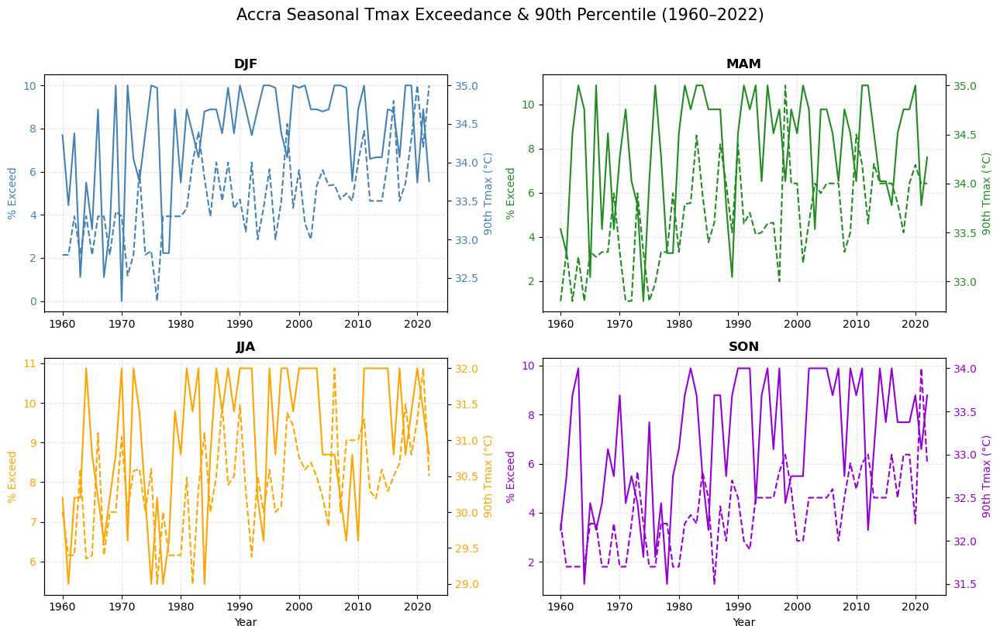

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load Accra Tmax data
df = pd.read_csv('Accra_1960_2024_dTx_complete.txt', sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)
df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
df = df.dropna(subset=['Tmax'])

# Assign season
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

df['year'] = df.index.year
df['season'] = df.index.month.map(assign_season)

# Group by year and season
grouped = df.groupby(['year', 'season'])

records = []
for (yr, szn), group in grouped:
    if len(group) < 10:
        continue
    perc90 = np.percentile(group['Tmax'], 90)
    exceed_pct = (group['Tmax'] > perc90).mean() * 100
    records.append({
        'year': yr,
        'season': szn,
        'perc90': perc90,
        'exceed_pct': exceed_pct
    })

seasonal_df = pd.DataFrame(records)

# Pivot to get yearly trends for each season
exceed_df = seasonal_df.pivot(index='year', columns='season', values='exceed_pct')
pctl_df = seasonal_df.pivot(index='year', columns='season', values='perc90')

# Set up 2x2 subplot
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(13, 8), sharex=False)
season_order = ['DJF', 'MAM', 'JJA', 'SON']
colors = {'DJF': 'steelblue', 'MAM': 'forestgreen', 'JJA': 'orange', 'SON': 'darkviolet'}

for ax, season in zip(axs.flat, season_order):
    ax2 = ax.twinx()
    
    # Plot exceedance
    ax.plot(exceed_df.index, exceed_df[season], label='% Exceedance', color=colors[season], linestyle='-')
    ax.set_ylabel('% Exceed', color=colors[season])
    ax.tick_params(axis='y', labelcolor=colors[season])

    # Plot percentile
    ax2.plot(pctl_df.index, pctl_df[season], label='90th Percentile', color=colors[season], linestyle='--')
    ax2.set_ylabel('90th Tmax (°C)', color=colors[season])
    ax2.tick_params(axis='y', labelcolor=colors[season])

    ax.set_title(f"{season}", fontweight='bold')
    ax.grid(True, linestyle='--', alpha=0.3)

# Set shared x label
for ax in axs[-1]:
    ax.set_xlabel("Year")

# Title
fig.suptitle("Accra Seasonal Tmax Exceedance & 90th Percentile (1960–2022)", fontsize=15, y=1.02)
plt.tight_layout()
plt.show()


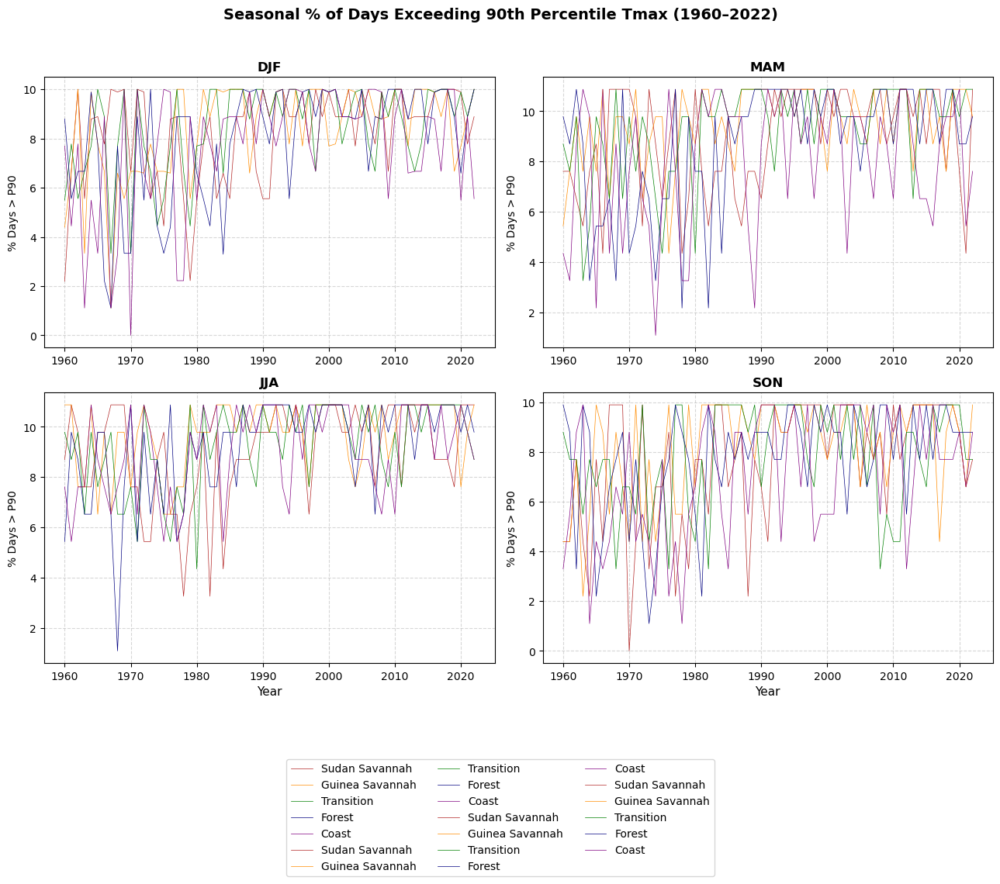

In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths per station
stations = {
    'Sudan Savannah': 'Navrongo_1960_2024_dTx_complete.txt',
    'Guinea Savannah': 'Tamale_1960_2024_dTx_complete.txt',
    'Transition': 'Wenchi_1960_2024_dTx_complete.txt',
    'Forest': 'Kumasi_1960_2024_dTx_complete.txt',
    'Coast': 'Accra_1960_2024_dTx_complete.txt',
}

# Helper to assign season
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

# Store seasonal exceedance % for each station
all_results = {}

for name, file in stations.items():
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df[(df.index.year >= 1960) & (df.index.year <= 2022)]
    df = df.dropna(subset=['Tmax'])

    df['year'] = df.index.year
    df['season'] = df.index.month.map(assign_season)

    grouped = df.groupby(['year', 'season'])

    records = []
    for (yr, szn), group in grouped:
        if len(group) < 10:
            continue
        p90 = np.percentile(group['Tmax'], 90)
        exceed = (group['Tmax'] > p90).mean() * 100
        records.append({'year': yr, 'season': szn, 'exceed_pct': exceed})

    seasonal_df = pd.DataFrame(records)
    pivot_df = seasonal_df.pivot(index='year', columns='season', values='exceed_pct')
    all_results[name] = pivot_df

# Set up plots: 2x2 for 4 seasons
fig, axs = plt.subplots(2, 2, figsize=(13, 9), sharex=False)
season_order = ['DJF', 'MAM', 'JJA', 'SON']
color_map = {
    'Sudan Savannah': 'firebrick',
    'Guinea Savannah': 'darkorange',
    'Transition': 'green',
    'Forest': 'navy',
    'Coast': 'purple'
}

for ax, season in zip(axs.flat, season_order):
    for station, df in all_results.items():
        if season in df.columns:
            ax.plot(df.index, df[season], label=station, linewidth=0.5, markersize=1, color=color_map[station])
    ax.set_title(season, fontsize=12, fontweight='bold')
    ax.set_ylabel('% Days > P90', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.5)

# Final tweaks
for ax in axs[-1]:
    ax.set_xlabel('Year', fontsize=11)
fig.suptitle("Seasonal % of Days Exceeding 90th Percentile Tmax (1960–2022)", fontsize=14, fontweight='bold', y=1.02)
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=10)
plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.08)
# plt.savefig("seasonal_exceedance_by_location.png", dpi=300)
plt.show()


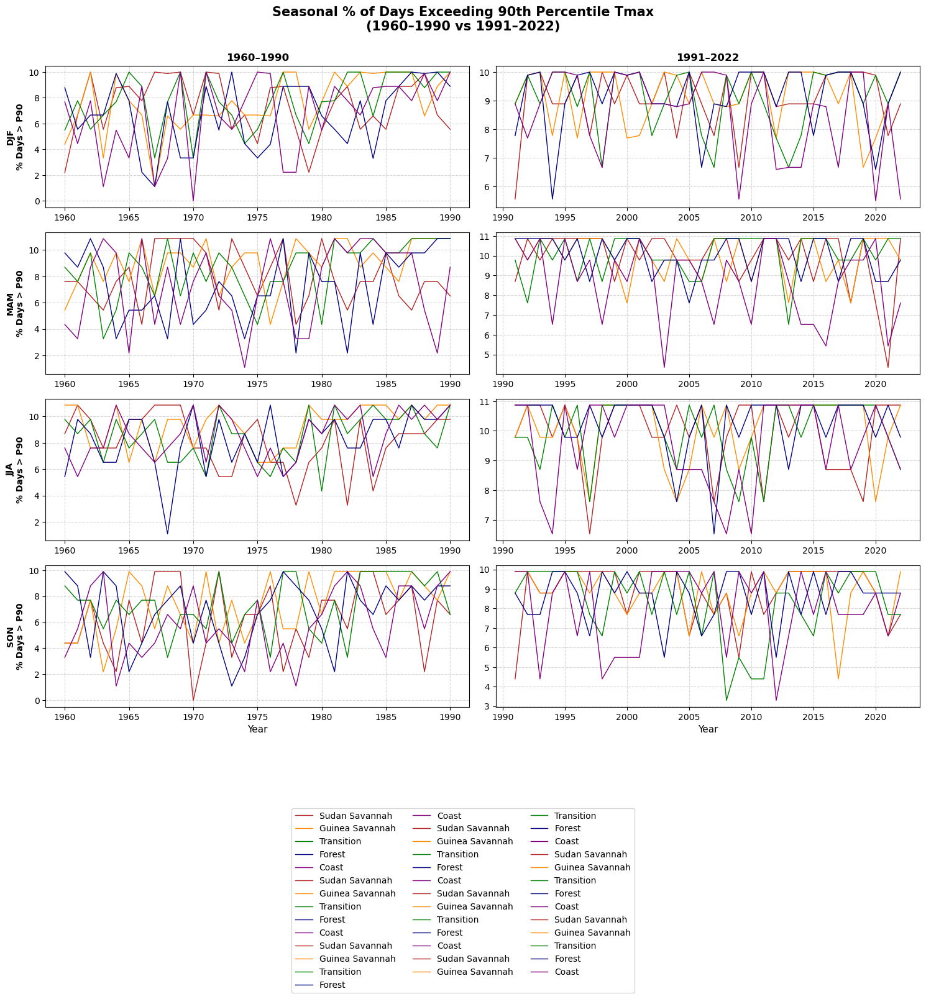

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths per station
stations = {
    'Sudan Savannah': 'Navrongo_1960_2024_dTx_complete.txt',
    'Guinea Savannah': 'Tamale_1960_2024_dTx_complete.txt',
    'Transition': 'Wenchi_1960_2024_dTx_complete.txt',
    'Forest': 'Kumasi_1960_2024_dTx_complete.txt',
    'Coast': 'Accra_1960_2024_dTx_complete.txt',
}

# Helper to assign season
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

# Windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Color for each station
color_map = {
    'Sudan Savannah': 'firebrick',
    'Guinea Savannah': 'darkorange',
    'Transition': 'green',
    'Forest': 'navy',
    'Coast': 'purple'
}

# Structure: results[window][station] = df
results = {win: {} for win in windows}

for name, file in stations.items():
    df = pd.read_csv(file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
    df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
    df.dropna(subset=['date'], inplace=True)
    df.set_index('date', inplace=True)
    df = df.dropna(subset=['Tmax'])

    df['year'] = df.index.year
    df['season'] = df.index.month.map(assign_season)

    for label, (start, end) in windows.items():
        df_win = df[(df['year'] >= start) & (df['year'] <= end)].copy()
        grouped = df_win.groupby(['year', 'season'])

        records = []
        for (yr, szn), group in grouped:
            if len(group) < 10:
                continue
            p90 = np.percentile(group['Tmax'], 90)
            exceed = (group['Tmax'] > p90).mean() * 100
            records.append({'year': yr, 'season': szn, 'exceed_pct': exceed})

        seasonal_df = pd.DataFrame(records)
        pivot_df = seasonal_df.pivot(index='year', columns='season', values='exceed_pct')
        results[label][name] = pivot_df

# Set up 4x2 grid for 4 seasons and 2 windows
fig, axs = plt.subplots(4, 2, figsize=(15, 12), sharex=False)
season_order = ['DJF', 'MAM', 'JJA', 'SON']
window_order = ['1960–1990', '1991–2022']

for row, season in enumerate(season_order):
    for col, window in enumerate(window_order):
        ax = axs[row, col]
        for station, df in results[window].items():
            if season in df.columns:
                ax.plot(df.index, df[season], label=station, linewidth=1, color=color_map[station])
        if row == 0:
            ax.set_title(window, fontsize=12, fontweight='bold')
        if col == 0:
            ax.set_ylabel(f"{season}\n% Days > P90", fontsize=10, fontweight='bold')
        ax.grid(True, linestyle='--', alpha=0.5)

# X-axis label for bottom row
for ax in axs[-1]:
    ax.set_xlabel("Year", fontsize=11)

fig.suptitle("Seasonal % of Days Exceeding 90th Percentile Tmax\n(1960–1990 vs 1991–2022)", fontsize=15, fontweight='bold', y=1.02)
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=10)
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.08)
plt.savefig("seasonal_exceedance_windows.png", dpi=300)
plt.show()


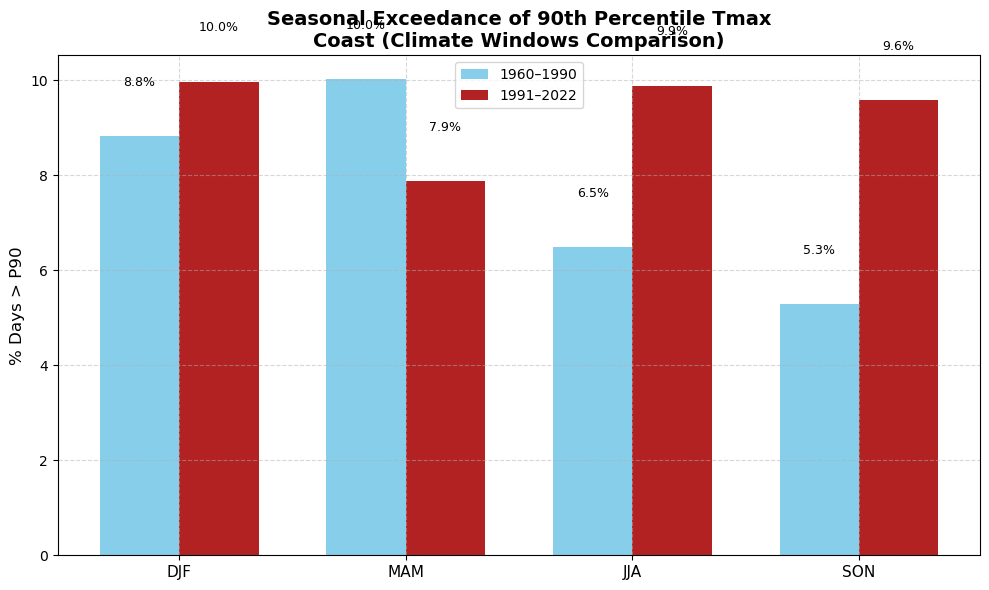

In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- SETTINGS ---
station_name = 'Coast'
station_file = 'Accra_1960_2024_dTx_complete.txt'

# --- Helper function to assign season ---
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

# --- Load and clean data ---
df = pd.read_csv(station_file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)
df = df.dropna(subset=['Tmax'])

df['year'] = df.index.year
df['season'] = df.index.month.map(assign_season)

# --- Climate windows ---
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# --- Process per window ---
season_order = ['DJF', 'MAM', 'JJA', 'SON']
results = {}

for label, (start, end) in windows.items():
    df_win = df[(df['year'] >= start) & (df['year'] <= end)].copy()
    
    # Group by season and calculate 90th percentile for each season
    season_stats = {}
    for season in season_order:
        season_data = df_win[df_win['season'] == season]
        if len(season_data) < 10:
            continue
        p90 = np.percentile(season_data['Tmax'], 90)
        exceed = (season_data['Tmax'] > p90).mean() * 100
        season_stats[season] = exceed
    results[label] = season_stats

# --- Create bar plot ---
labels = season_order
x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
bars1 = [results['1960–1990'].get(season, 0) for season in season_order]
bars2 = [results['1991–2022'].get(season, 0) for season in season_order]

bar1 = ax.bar(x - width/2, bars1, width, label='1960–1990', color='skyblue')
bar2 = ax.bar(x + width/2, bars2, width, label='1991–2022', color='firebrick')

# --- Plot labels ---
ax.set_ylabel('% Days > P90', fontsize=12)
ax.set_title(f"Seasonal Exceedance of 90th Percentile Tmax\n{station_name} (Climate Windows Comparison)", fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=11)
ax.legend()
ax.grid(True, linestyle='--', alpha=0.5)

# --- Add values on bars ---
for rect in bar1 + bar2:
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 1, f'{height:.1f}%', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig(f"{station_name}_seasonal_exceedance_comparison.png", dpi=300)
plt.show()


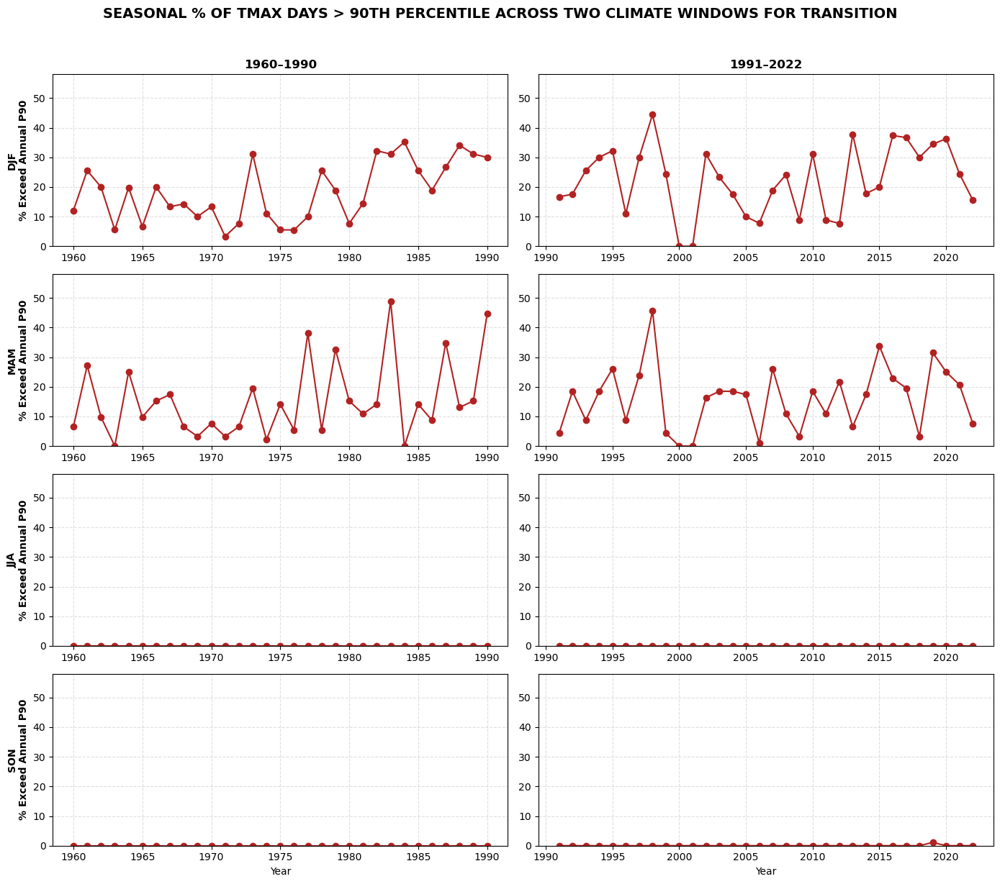

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Choose the station
station_name = 'Coast'
station_file = 'Wenchi_1960_2022_dTx_complete.txt'

# Helper to assign seasons
def assign_season(month):
    if month in [12, 1, 2]:
        return 'DJF'
    elif month in [3, 4, 5]:
        return 'MAM'
    elif month in [6, 7, 8]:
        return 'JJA'
    else:
        return 'SON'

# Define time windows
windows = {
    '1960–1990': (1960, 1990),
    '1991–2022': (1991, 2022)
}

# Preprocess data
df = pd.read_csv(station_file, sep=r'\s+', header=None, names=["year", "month", "day", "Tmax"])
df['date'] = pd.to_datetime(df[['year', 'month', 'day']], errors='coerce')
df.dropna(subset=['date'], inplace=True)
df.set_index('date', inplace=True)
df = df.dropna(subset=['Tmax'])

df['year'] = df.index.year
df['season'] = df.index.month.map(assign_season)

# Store results
season_order = ['DJF', 'MAM', 'JJA', 'SON']
results = {win: pd.DataFrame() for win in windows}

# Compute exceedance using **annual threshold**
for win_label, (start, end) in windows.items():
    df_win = df[(df['year'] >= start) & (df['year'] <= end)].copy()

    # Compute 90th percentile for the entire window (all Tmax)
    annual_p90 = df_win['Tmax'].quantile(0.9)

    # Group by year and season
    grouped = df_win.groupby(['year', 'season'])

    records = []
    for (yr, szn), group in grouped:
        if len(group) < 10:
            continue
        exceed_pct = (group['Tmax'] > annual_p90).mean() * 100
        records.append({'year': yr, 'season': szn, 'exceed_pct': exceed_pct})

    results[win_label] = pd.DataFrame(records).pivot(index='year', columns='season', values='exceed_pct')

# Plotting: 4 rows (seasons) × 2 cols (windows)
fig, axs = plt.subplots(4, 2, figsize=(14, 12), sharex=False)

for row, season in enumerate(season_order):
    for col, (win_label, data) in enumerate(results.items()):
        ax = axs[row, col]
        if season in data.columns:
            ax.plot(data.index, data[season], marker='o', linestyle='-', color='firebrick')
            ax.set_ylim(0, 58)
        ax.grid(True, linestyle='--', alpha=0.4)

        # Titles and labels
        if row == 0:
            ax.set_title(win_label, fontsize=12, fontweight='bold')
        if col == 0:
            ax.set_ylabel(f"{season}\n% Exceed Annual P90", fontsize=10, fontweight='bold')
        if row == 3:
            ax.set_xlabel("Year", fontsize=10)

fig.suptitle("SEASONAL % OF TMAX DAYS > 90TH PERCENTILE ACROSS TWO CLIMATE WINDOWS FOR TRANSITION",fontweight='bold', fontsize=14, y=1.02)
plt.subplots_adjust(top=0.94, bottom=0.06)

plt.tight_layout()
fig.savefig('Transition_seasonal.png', bbox_inches='tight')

plt.show()


In [5]:
annual_p90

33.5

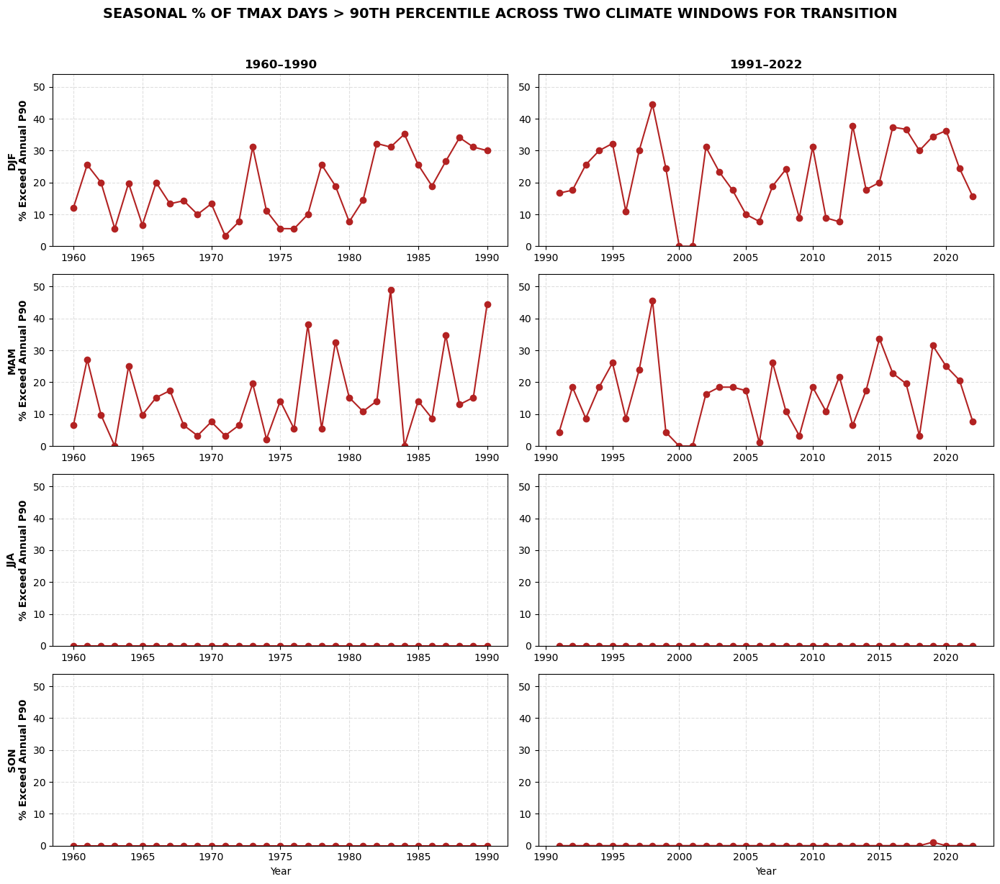

In [16]:
# Find global maximum across all windows & seasons
global_max = max(
    win_data[season].max()
    for win_data in results.values()
    for season in win_data.columns
)

# Plotting: 4 rows (seasons) × 2 cols (windows)
fig, axs = plt.subplots(4, 2, figsize=(14, 12), sharex=False)

for row, season in enumerate(season_order):
    for col, (win_label, data) in enumerate(results.items()):
        ax = axs[row, col]
        if season in data.columns:
            ax.plot(data.index, data[season], marker='o', linestyle='-', color='firebrick')
            ax.set_ylim(0, min(60, global_max + 5))  # cap at 60, add buffer
        ax.grid(True, linestyle='--', alpha=0.4)

        # Titles and labels
        if row == 0:
            ax.set_title(win_label, fontsize=12, fontweight='bold')
        if col == 0:
            ax.set_ylabel(f"{season}\n% Exceed Annual P90", fontsize=10, fontweight='bold')
        if row == 3:
            ax.set_xlabel("Year", fontsize=10)

fig.suptitle("SEASONAL % OF TMAX DAYS > 90TH PERCENTILE ACROSS TWO CLIMATE WINDOWS FOR TRANSITION",
             fontweight='bold', fontsize=14, y=1.02)
plt.subplots_adjust(top=0.94, bottom=0.06)

plt.tight_layout()
fig.savefig('Transition_seasonal.png', bbox_inches='tight')

plt.show()


In [25]:
# Accra_avail_Tx = pd.read_csv('Accra_Avail_dTx_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmax"])
# Accra_avail_Tn = pd.read_csv('Accra_Avail_dTn_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmin"])
# Kumasi_avail_Tx = pd.read_csv('Kumasi_Avail_dTx_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmax"])
# Kumasi_avail_Tn = pd.read_csv('Kumasi_Avail_dTn_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmin"])
# Kintampo_avail_Tx = pd.read_csv('Kintampo_Avail_dTx_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmax"])
# Kintampo_avail_Tn = pd.read_csv('Kintampo_Avail_dTn_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmin"])
# Tamale_avail_Tx = pd.read_csv('Tamale_Avail_dTx_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmax"])
# Tamale_avail_Tn = pd.read_csv('Tamale_Avail_dTn_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmin"])
# Navrongo_avail_Tx = pd.read_csv('Navrongo_Avail_dTx_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmax"])
# Navrongo_avail_Tn = pd.read_csv('Navrongo_Avail_dTn_1960_2024.txt',sep=r'\s+', header=None, names=["year", "month", "%Tmin"])


In [30]:
Tmax = xr.open_dataset('Ghana_ERA5_dTx_1960_2024.nc').mx2t
Tmin = xr.open_dataset('Ghana_ERA5_dTn_1960_2024.nc').mn2t

In [33]:
Accra_Tx = Tmax.sel(longitude = -0.170, latitude = 5.650, method='nearest')
Accra_Tn = Tmin.sel(longitude = -0.170, latitude = 5.650, method='nearest')



Kumasi_Tx = Tmax.sel(longitude = -1.620, latitude = 6.680, method='nearest')
Kumasi_Tn = Tmin.sel(longitude = -1.620, latitude = 6.680, method='nearest')



Kintampo_Tx = Tmax.sel(longitude = -1.720, latitude =  8.050, method='nearest')
Kintampo_Tn = Tmin.sel(longitude = -1.720, latitude =  8.050, method='nearest')


Tamale_Tx = Tmax.sel(longitude = -0.850, latitude = 9.430, method='nearest')
Tamale_Tn = Tmin.sel(longitude = -0.850, latitude = 9.430, method='nearest')



Navrongo_Tx = Tmax.sel(longitude = -1.100, latitude = 10.900, method='nearest')
Navrongo_Tn = Tmin.sel(longitude = -1.100, latitude = 10.900, method='nearest')

                    

In [42]:
Accra_Tn

<xarray.DataArray 'mn2t' (time: 23741)>
array([22.633358, 23.025333, 23.715676, ..., 28.508076, 28.200581, 28.229166])
Coordinates:
  * time       (time) datetime64[ns] 1960-01-01T06:00:00 ... 2024-12-31T11:00:00
    longitude  float64 -0.25
    latitude   float64 5.75
Attributes:
    long_name:  Minimum temperature at 2 metres since previous post-processing
    units:      K

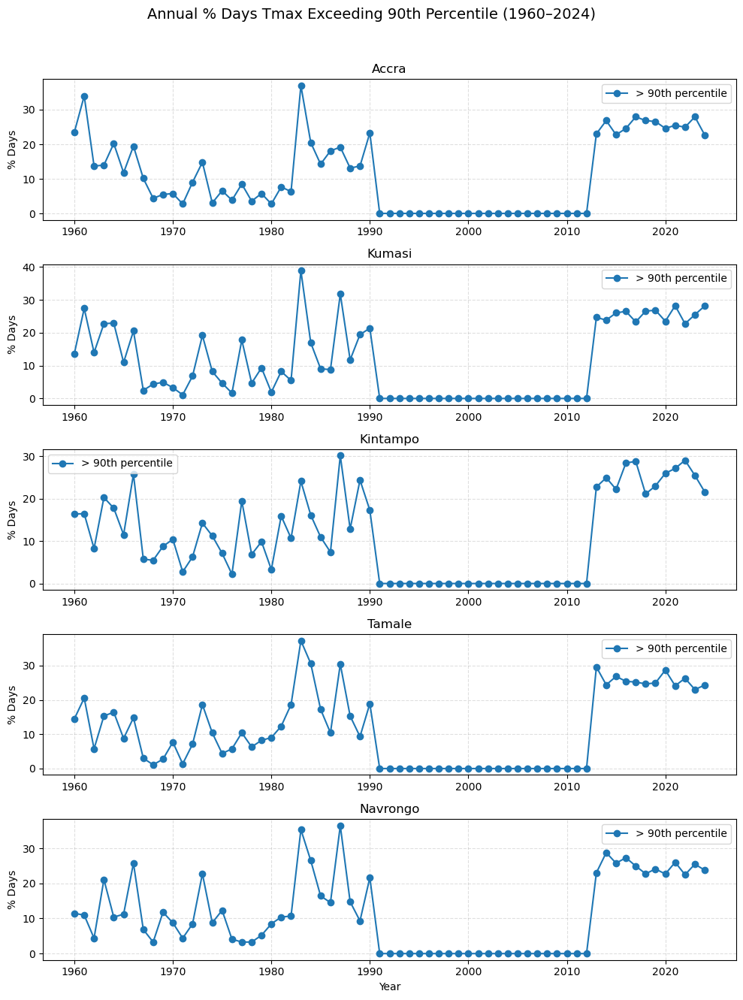

In [51]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load Tmax dataset (already in °C)
Tmax = xr.open_dataset('Ghana_ERA5_dTx_1960_2024.nc').mx2t

# Define stations with coordinates
stations = {
    'Accra': (-0.170, 5.650),
    'Kumasi': (-1.620, 6.680),
    'Kintampo': (-1.720, 8.050),
    'Tamale': (-0.850, 9.430),
    'Navrongo': (-1.100, 10.900)
}

# Create subplot
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 13), sharex=False, sharey=False)

# Loop through stations
for i, (name, (lon, lat)) in enumerate(stations.items()):
    # Select station data
    tmax_point = Tmax.sel(longitude=lon, latitude=lat, method='nearest')

    # Convert time to datetime64 if needed
    if not np.issubdtype(tmax_point['time'].dtype, np.datetime64):
        tmax_point['time'] = xr.cftime_range(
            start=str(tmax_point['time'][0].values), 
            periods=len(tmax_point['time']), 
            freq='D'
        )

    # Create DOY coordinate
    tmax_point.coords['doy'] = tmax_point['time'].dt.strftime('%m-%d')

    # Compute 90th percentile for each DOY
    tmax_90 = tmax_point.groupby('doy').reduce(np.nanpercentile, q=90)

    # Match threshold to each day
    doy_array = tmax_point['doy'].values
    thresholds = tmax_90.sel(doy=doy_array).values
    exceed = tmax_point > xr.DataArray(thresholds, coords=[tmax_point['time']], dims='time')

    # To DataFrame
    df = exceed.to_dataframe(name='exceed').reset_index()
    df['year'] = pd.to_datetime(df['time'].astype(str)).dt.year
    annual_exceedance = df.groupby('year')['exceed'].mean() * 100

    # Plot
    ax = axes[i]
    ax.plot(annual_exceedance.index, annual_exceedance.values, marker='o', label='> 90th percentile')
    ax.set_title(f"{name}")
    ax.set_ylabel('% Days')
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.legend()

# Final touches
fig.suptitle("Annual % Days Tmax Exceeding 90th Percentile (1960–2024)", fontsize=14, y=1.02)
axes[-1].set_xlabel('Year')
plt.tight_layout()
plt.show()


In [40]:
accra_tmax = Tmax.sel(longitude=-0.170, latitude=5.650, method='nearest')

# Convert time if needed
if not np.issubdtype(accra_tmax['time'].dtype, np.datetime64):
    accra_tmax['time'] = xr.cftime_range(
        start=str(accra_tmax['time'][0].values),
        periods=len(accra_tmax['time']),
        freq='D'
    )

# Print basic stats
print("Raw data range:", float(accra_tmax.min()), "to", float(accra_tmax.max()))
print("Any NaNs?", np.isnan(accra_tmax).any().item())
print("Any extreme values >", 500, "K?", (accra_tmax > 500).any().item())
print("Any invalid values <", 100, "K?", (accra_tmax < 100).any().item())


Raw data range: -1.53113385809658e+308 to 1.7558459285839722e+308
Any NaNs? True
Any extreme values > 500 K? True
Any invalid values < 100 K? True


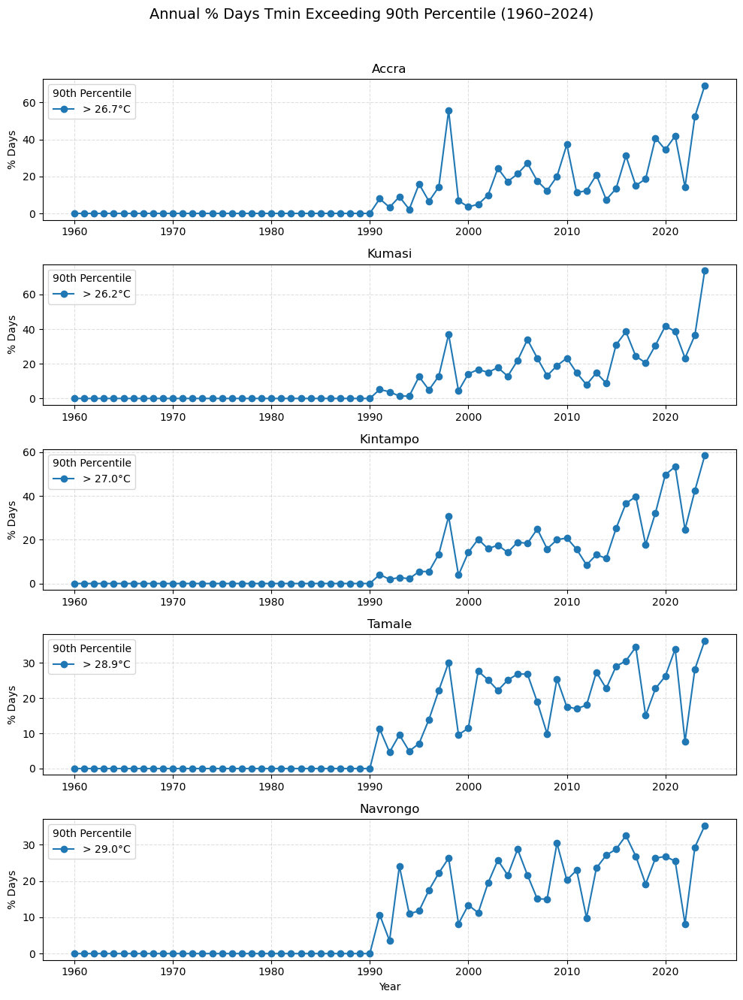

In [46]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load Tmin dataset (already in °C)
Tmin = xr.open_dataset('Ghana_ERA5_dTn_1960_2024.nc').mn2t

# Define stations and their coordinates
stations = {
    'Accra': (-0.170, 5.650),
    'Kumasi': (-1.620, 6.680),
    'Kintampo': (-1.720, 8.050),
    'Tamale': (-0.850, 9.430),
    'Navrongo': (-1.100, 10.900)
}

# Create figure and axes
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(10, 13), sharex=False, sharey=False)

# Loop through each station
for i, (name, (lon, lat)) in enumerate(stations.items()):
    # Extract data at station location
    tmin_point = Tmin.sel(longitude=lon, latitude=lat, method='nearest')

    # Create day-of-year coordinate
    tmin_point.coords['doy'] = tmin_point['time'].dt.strftime('%m-%d')

    # Compute 90th percentile for each DOY
    tmin_90 = tmin_point.groupby('doy').reduce(np.nanpercentile, q=90)

    # Map daily threshold to each day
    doy_array = tmin_point['doy'].values
    thresholds = tmin_90.sel(doy=doy_array).values
    exceed = tmin_point > xr.DataArray(thresholds, coords=[tmin_point['time']], dims='time')

    # Convert to DataFrame and compute annual exceedance %
    df = exceed.to_dataframe(name='exceed').reset_index()
    df['year'] = pd.to_datetime(df['time']).dt.year
    annual_exceedance = df.groupby('year')['exceed'].mean() * 100

    # Compute mean 90th percentile (already in °C)
    mean_90th = tmin_90.mean().item()

    # Plot
    ax = axes[i]
    ax.plot(annual_exceedance.index, annual_exceedance.values, marker='o',
            label=f'> {mean_90th:.1f}°C')
    ax.set_title(f"{name}")
    ax.set_ylabel('% Days')
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.legend(title='90th Percentile')

# Global title and label
fig.suptitle("Annual % Days Tmin Exceeding 90th Percentile (1960–2024)", fontsize=14, y=1.02)
axes[-1].set_xlabel('Year')
plt.tight_layout()
plt.show()


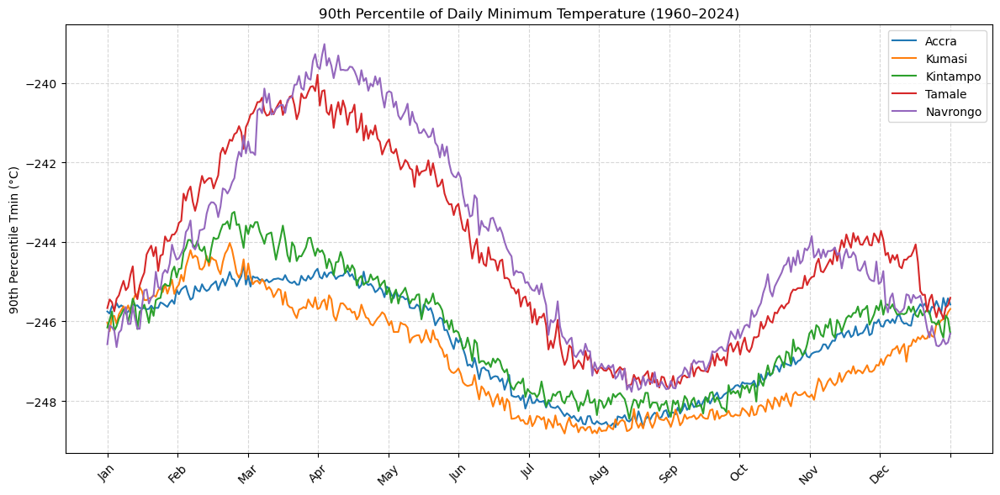

In [45]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load Tmin dataset
Tmin = xr.open_dataset('Ghana_ERA5_dTn_1960_2024.nc').mn2t

# Define stations
stations = {
    'Accra': (-0.170, 5.650),
    'Kumasi': (-1.620, 6.680),
    'Kintampo': (-1.720, 8.050),
    'Tamale': (-0.850, 9.430),
    'Navrongo': (-1.100, 10.900)
}

# Dictionary to hold threshold DataArrays
thresholds_dict = {}

# Loop through stations to calculate thresholds
for name, (lon, lat) in stations.items():
    tmin_point = Tmin.sel(longitude=lon, latitude=lat, method='nearest')

    # Create DOY
    tmin_point.coords['doy'] = tmin_point['time'].dt.strftime('%m-%d')

    # Compute 90th percentile for each DOY
    tmin_90 = tmin_point.groupby('doy').reduce(np.nanpercentile, q=90)

    # Convert to °C and store
    tmin_90_C = tmin_90 - 273.15
    thresholds_dict[name] = tmin_90_C

# Convert all to DataFrame for plotting
df_thresh = pd.DataFrame({
    name: thresholds_dict[name].values for name in thresholds_dict
}, index=thresholds_dict['Accra']['doy'].values)

# Plot
plt.figure(figsize=(12, 6))
for name in df_thresh.columns:
    plt.plot(df_thresh.index, df_thresh[name], label=name)

plt.xticks(np.linspace(0, 365, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', ''], rotation=45)
plt.ylabel('90th Percentile Tmin (°C)')
plt.title('90th Percentile of Daily Minimum Temperature (1960–2024)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


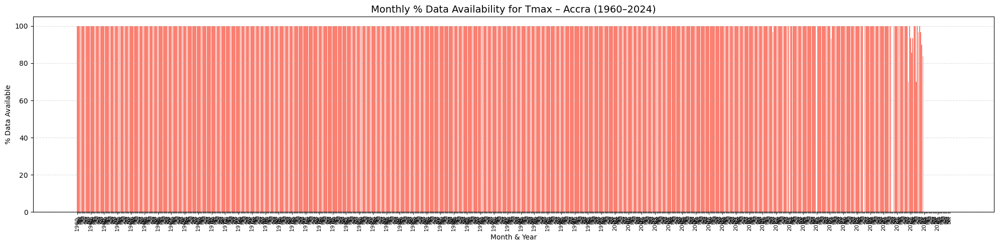

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Load Accra Tmax data
accra_tx = pd.read_csv('Accra_Avail_dTx_1960_2024.txt', sep=r'\s+', header=None, names=["year", "month", "%Tmax"])

# Convert to datetime
accra_tx['date'] = pd.to_datetime(dict(year=accra_tx.year, month=accra_tx.month, day=1))

# Sort just in case
accra_tx = accra_tx.sort_values('date')

# Plot
fig, ax = plt.subplots(figsize=(20, 5))
ax.bar(accra_tx['date'], accra_tx['%Tmax'], width=25, color='salmon')

# Set x-axis major ticks for every year at Jan
year_ticks = accra_tx[accra_tx['month'] == 1]['date']
ax.set_xticks(year_ticks)
ax.set_xticklabels(accra_tx[accra_tx['month'] == 1]['year'], rotation=90, fontsize=8)

# Minor ticks for months
ax.xaxis.set_minor_locator(ticker.MultipleLocator(base=30.5))  # approx. monthly spacing

# Month labels as minor tick labels
month_labels = accra_tx['date'].dt.strftime('%b').tolist()
ax.set_xticks(accra_tx['date'], minor=True)
ax.set_xticklabels(month_labels, minor=True, rotation=90, fontsize=6)

# Labels and styling
ax.set_title('Monthly % Data Availability for Tmax – Accra (1960–2024)', fontsize=14)
ax.set_ylabel('% Data Available')
ax.set_xlabel('Month & Year')
ax.set_ylim(0, 105)
ax.grid(True, axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()


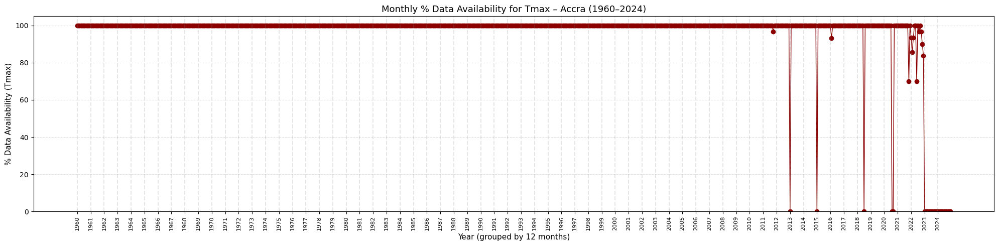

In [31]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your Accra Tmax data
accra_tx = pd.read_csv('Accra_Avail_dTx_1960_2024.txt', sep=r'\s+', header=None, names=["year", "month", "%Tmax"])

# Step 1: Create combined year-month label for x-axis
accra_tx['label'] = accra_tx['year'].astype(str) + '-' + accra_tx['month'].astype(str).str.zfill(2)

# Step 2: Plot
plt.figure(figsize=(20, 5))
plt.plot(accra_tx['label'], accra_tx['%Tmax'], marker='o', linewidth=1, color='darkred')

# Step 3: Format x-axis
plt.xticks(
    ticks=[i for i in range(0, len(accra_tx), 12)],
    labels=accra_tx['year'].unique(),
    rotation=90,
    fontsize=8
)

# Minor ticks for months (optional)
for i in range(0, len(accra_tx), 12):
    plt.axvline(i, color='gray', linestyle='--', alpha=0.2)

# Labels
plt.xlabel('Year (grouped by 12 months)', fontsize=11)
plt.ylabel('% Data Availability (Tmax)', fontsize=11)
plt.title('Monthly % Data Availability for Tmax – Accra (1960–2024)', fontsize=13)
plt.ylim(0, 105)
plt.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


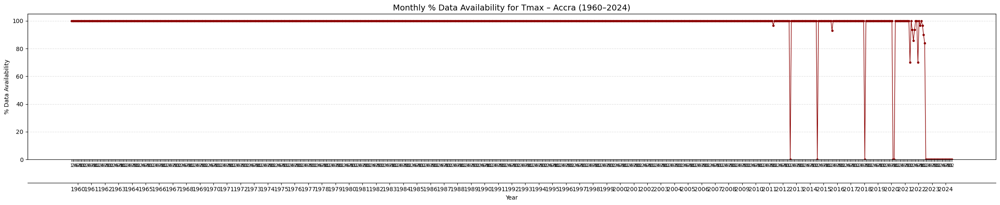

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load data
df = pd.read_csv('Accra_Avail_dTx_1960_2024.txt', sep=r'\s+', header=None, names=["year", "month", "%Tmax"])

# Create a unique index for each month-year
df['date_label'] = df['year'].astype(str) + '-' + df['month'].astype(str).str.zfill(2)

# Set positions for plotting
df['pos'] = np.arange(len(df))

# Plot
fig, ax = plt.subplots(figsize=(24, 5))

# Plot the availability percentage
ax.plot(df['pos'], df['%Tmax'], color='darkred', marker='.', linewidth=1)
ax.set_ylabel('% Data Availability')

# Major ticks = month numbers
month_labels = df['month'].tolist()
ax.set_xticks(df['pos'])
ax.set_xticklabels(month_labels, fontsize=7)

# Add secondary x-axis for year labels beneath the months
ax2 = ax.twiny()

# Align secondary x-axis with main axis
ax2.set_xlim(ax.get_xlim())

# Set ticks for each year at the middle of its 12-month block
year_ticks = []
year_labels = []
for year in df['year'].unique():
    indices = df[df['year'] == year].index
    mid_index = df.loc[indices, 'pos'].median()
    year_ticks.append(mid_index)
    year_labels.append(str(year))

ax2.set_xticks(year_ticks)
ax2.set_xticklabels(year_labels, fontsize=9)
ax2.xaxis.set_ticks_position('bottom')
ax2.xaxis.set_label_position('bottom')
ax2.spines['bottom'].set_position(('outward', 40))
ax2.set_xlabel('Year', fontsize=10)

# Final formatting
ax.set_title('Monthly % Data Availability for Tmax – Accra (1960–2024)', fontsize=14)
ax.set_ylim(0, 105)
ax.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


ValueError: The number of FixedLocator locations (130), usually from a call to set_ticks, does not match the number of labels (780).

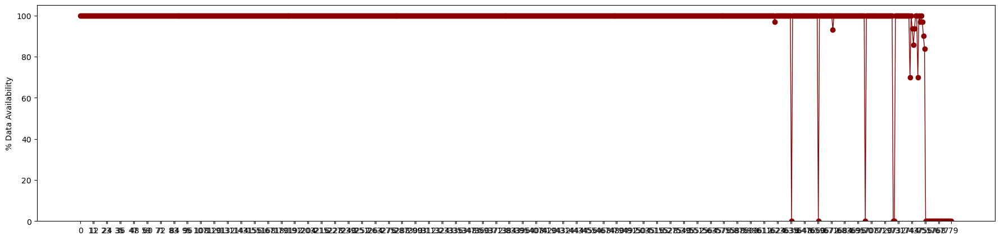

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load data
df = pd.read_csv('Accra_Avail_dTx_1960_2024.txt', sep=r'\s+', header=None, names=["year", "month", "%Tmax"])

# Create a position index for each month-year combo
df['pos'] = np.arange(len(df))

# Plot
fig, ax = plt.subplots(figsize=(22, 5))

# Main line plot
ax.plot(df['pos'], df['%Tmax'], color='darkred', marker='o', linewidth=1)
ax.set_ylabel('% Data Availability')
ax.set_ylim(0, 105)

# Set custom x-ticks: show 1–12 (months) repeatedly, but only once every 12 months
month_ticks = []
month_labels = []

for i in range(len(df)):
    if df.loc[i, 'month'] in [1, 12]:  # Show only first and last month labels to avoid clutter
        month_ticks.append(df.loc[i, 'pos'])
        month_labels.append(str(df.loc[i, 'month']))
    else:
        month_labels.append('')  # leave middle months unlabeled

ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels, fontsize=7)

# Add a second x-axis for year labels (centered under each block of 12 months)
ax2 = ax.twiny()
ax2.set_xlim(ax.get_xlim())

year_labels = df['year'].unique()
year_ticks = [df[df['year'] == y]['pos'].median() for y in year_labels]

ax2.set_xticks(year_ticks)
ax2.set_xticklabels(year_labels, fontsize=9, rotation=90)
ax2.xaxis.set_ticks_position('bottom')
ax2.xaxis.set_label_position('bottom')
ax2.spines['bottom'].set_position(('outward', 40))
ax2.set_xlabel('Year')

# Grid and layout
ax.grid(True, axis='y', linestyle='--', alpha=0.4)
ax.set_title('Monthly % Data Availability for Tmax – Accra (1960–2024)', fontsize=14)
plt.tight_layout()
plt.show()


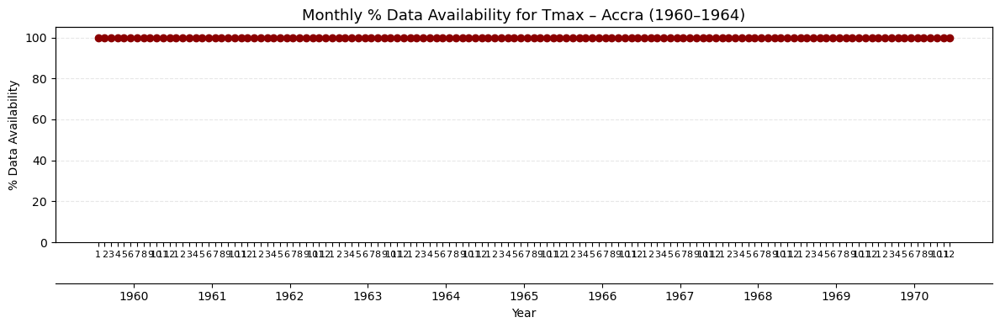

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load and filter data to first 5 years
df = pd.read_csv('Accra_Avail_dTx_1960_2024.txt', sep=r'\s+', header=None, names=["year", "month", "%Tmax"])
df = df[df['year'].between(1960, 1970)].reset_index(drop=True)

# Create a unique index for plotting
df['pos'] = np.arange(len(df))

# Plot
fig, ax = plt.subplots(figsize=(12, 4))

# Line plot
ax.plot(df['pos'], df['%Tmax'], color='darkred', marker='o', linewidth=1)
ax.set_ylabel('% Data Availability')
ax.set_ylim(0, 105)

# X-ticks for months
month_ticks = df['pos']
month_labels = df['month']

ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels, fontsize=8)

# Add year labels on a second axis
ax2 = ax.twiny()
ax2.set_xlim(ax.get_xlim())

# Center each year label under its 12-month block
year_labels = df['year'].unique()
year_ticks = [df[df['year'] == y]['pos'].mean() for y in year_labels]
ax2.set_xticks(year_ticks)
ax2.set_xticklabels(year_labels, fontsize=9)
ax2.xaxis.set_ticks_position('bottom')
ax2.xaxis.set_label_position('bottom')
ax2.spines['bottom'].set_position(('outward', 35))
ax2.set_xlabel('Year', fontsize=10)

# Grid & layout
ax.set_title('Monthly % Data Availability for Tmax – Accra (1960–1964)', fontsize=13)
ax.grid(True, axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [20]:
Accra_Tx

,year,month,day,Tmax
0,1960,1,1,31.70
1,1960,1,2,32.20
2,1960,1,3,31.70
3,1960,1,4,31.70
4,1960,1,5,32.80
...,...,...,...,...
23737,2024,12,27,28.36
23738,2024,12,28,28.54
23739,2024,12,29,28.31
23740,2024,12,30,27.94


In [13]:
ds  =  xr.open_dataset('Ghana_ERA5_hTx_1991-2024.nc')


<xarray.Dataset>
Dimensions:     (valid_time: 298056, longitude: 21, latitude: 31)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 1991-01-01 ... 2024-12-31T23:00:00
  * longitude   (longitude) float64 -3.5 -3.25 -3.0 -2.75 ... 0.75 1.0 1.25 1.5
  * latitude    (latitude) float64 12.0 11.75 11.5 11.25 ... 5.25 5.0 4.75 4.5
Data variables:
    mx2t        (valid_time, latitude, longitude) float32 ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.2 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Tue May 27 14:00:42 2025: cdo selyear,1991/2024 ...
    CDO:                     Climate Data Operators version 2.4.2 (https://mp...

In [15]:
tmax = ds['mx2t']


<xarray.DataArray 'mx2t' (valid_time: 298056, latitude: 31, longitude: 21)>
array([[[20.967188, 20.959375, ..., 19.609766, 19.396875],
        [21.404688, 21.41836 , ..., 20.150782, 19.898829],
        ...,
        [27.627344, 27.60586 , ..., 27.81875 , 27.82461 ],
        [27.654688, 27.666407, ..., 27.807032, 27.808985]],

       [[20.129297, 20.101954, ..., 18.998438, 18.85586 ],
        [20.502344, 20.508204, ..., 19.461329, 19.271875],
        ...,
        [27.5375  , 27.541407, ..., 27.725   , 27.70547 ],
        [27.545313, 27.555079, ..., 27.69375 , 27.66836 ]],

       ...,

       [[24.67251 , 25.096338, ..., 27.48501 , 27.076807],
        [25.158838, 25.592432, ..., 27.707666, 27.369776],
        ...,
        [28.820948, 28.789698, ..., 28.496729, 28.494776],
        [28.690088, 28.777979, ..., 28.518213, 28.5104  ]],

       [[23.996729, 24.363916, ..., 26.42837 , 26.063135],
        [24.531885, 24.889307, ..., 26.738916, 26.432276],
        ...,
        [28.79751 , 28.764307, ..., 28.412745, 28.393213],
        [28.676416, 28.764307, ..., 28.449854, 28.426416]]], dtype=float32)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 1991-01-01 ... 2024-12-31T23:00:00
  * longitude   (longitude) float64 -3.5 -3.25 -3.0 -2.75 ... 0.75 1.0 1.25 1.5
  * latitude    (latitude) float64 12.0 11.75 11.5 11.25 ... 5.25 5.0 4.75 4.5
Attributes: (12/32)
    standard_name:                            unknown
    long_name:                                Maximum temperature at 2 metres...
    units:                                    K
    GRIB_paramId:                             201
    GRIB_dataType:                            fc
    GRIB_numberOfPoints:                      651
    ...                                       ...
    GRIB_missingValue:                        3.4028234663852886e+38
    GRIB_name:                                Maximum temperature at 2 metres...
    GRIB_shortName:                           mx2t
    GRIB_totalNumber:                         0
    GRIB_units:                               K
    GRIB_surface:                             0.0

In [16]:
# 1. Resample to daily max ( hourly)
tmax_daily = tmax.resample(valid_time='1D').max()

In [17]:
#selecting sekyere in Kumasi
tmax_point = tmax_daily.sel(latitude=6.93, longitude=-1.48, method='nearest')

In [18]:
# 3. Extract day-of-year including leap years
tmax_point.coords['doy'] = tmax_point['valid_time'].dt.strftime('%m-%d')

In [19]:
# 4. Compute 90th percentile per DOY across all years
tmax_90 = tmax_point.groupby('doy').reduce(np.nanpercentile, q=90)

In [20]:
# 5. Match DOY threshold to each day
doy_array = tmax_point['doy'].values
thresholds = tmax_90.sel(doy=doy_array).values
exceed = tmax_point > xr.DataArray(thresholds, coords=[tmax_point['valid_time']], dims='valid_time')

In [21]:
# 6. Convert to DataFrame for yearly aggregation
df = exceed.to_dataframe(name='exceed').reset_index()
df['year'] = df['valid_time'].dt.year
annual_exceedance = df.groupby('year')['exceed'].mean() * 100

In [40]:
annual_exceedance

year
1991     3.013699
1992     1.912568
1993     1.917808
1994     1.917808
1995     4.383562
1996     4.644809
1997     5.205479
1998    23.835616
1999     4.383562
2000     9.836066
2001    12.328767
2002     7.945205
2003    12.602740
2004     7.377049
2005    12.054795
2006    26.575342
2007    21.643836
2008    11.475410
2009     8.493151
2010     9.589041
2011     7.123288
2012     3.278689
2013     6.027397
2014     3.013699
2015    16.986301
2016    21.311475
2017    13.698630
2018     7.945205
2019    10.136986
2020    20.491803
2021    23.561644
2022    12.876712
2023    19.178082
2024    42.896175
Name: exceed, dtype: float64

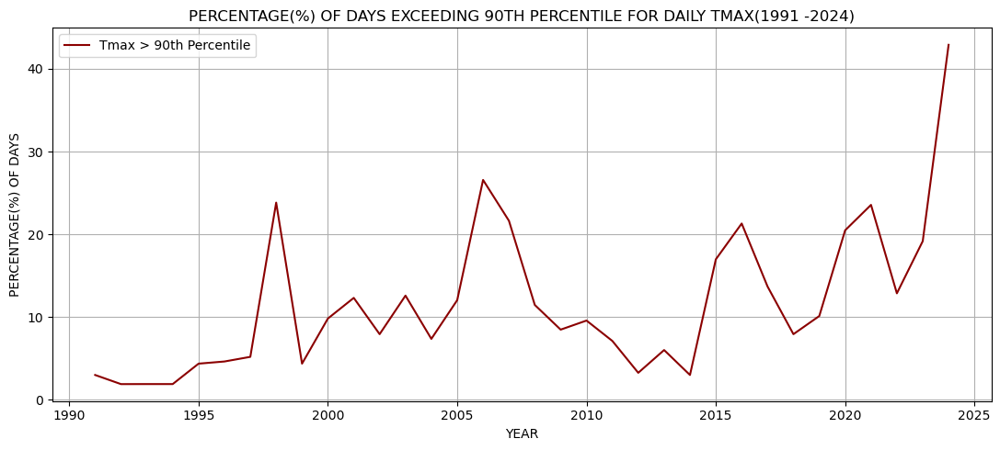

In [69]:
# 7. Plot
plt.figure(figsize=(11, 5))
plt.plot(annual_exceedance.index, annual_exceedance.values, color='darkred', label='Tmax > 90th Percentile')
plt.title('PERCENTAGE(%) OF DAYS EXCEEDING 90TH PERCENTILE FOR DAILY TMAX(1991 -2024)')
plt.xlabel('YEAR')
plt.ylabel('PERCENTAGE(%) OF DAYS')
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

In [24]:
df  =  xr.open_dataset('Ghana_ERA5_hTn_1991-2024.nc')
df

<xarray.Dataset>
Dimensions:     (valid_time: 298056, longitude: 21, latitude: 31)
Coordinates:
  * valid_time  (valid_time) datetime64[ns] 1991-01-01 ... 2024-12-31T23:00:00
  * longitude   (longitude) float64 -3.5 -3.25 -3.0 -2.75 ... 0.75 1.0 1.25 1.5
  * latitude    (latitude) float64 12.0 11.75 11.5 11.25 ... 5.25 5.0 4.75 4.5
Data variables:
    mn2t        (valid_time, latitude, longitude) float32 ...
Attributes:
    CDI:                     Climate Data Interface version 2.4.2 (https://mp...
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    history:                 Tue May 27 13:59:12 2025: cdo selyear,1991/2024 ...
    CDO:                     Climate Data Operators version 2.4.2 (https://mp...

In [25]:
tmin = df['mn2t']

In [26]:
# 1. Resample to daily min ( hourly)
tmin_daily = tmin.resample(valid_time='1D').min()

In [27]:
# 2. Select a representative location (central Ghana example)
tmin_point = tmin_daily.sel(latitude=6.93, longitude=-1.48, method='nearest')

In [28]:
# 3. Create 'day-of-year' including leap years
tmin_point.coords['doy'] = tmin_point['valid_time'].dt.strftime('%m-%d')

In [29]:
# 4. Calculate 90th percentile for each DOY across all years
tmin_90 = tmin_point.groupby('doy').reduce(np.nanpercentile, q=90)

In [41]:
# 5. Match threshold to each day
doy_array_min = tmin_point['doy'].values
thresholds_min = tmin_90.sel(doy=doy_array_min).values
exceed_min = tmin_point > xr.DataArray(thresholds_min, coords=[tmin_point['valid_time']], dims='valid_time')
# Create a DataFrame from the exceedance array
df = exceed.to_dataframe(name='exceed').reset_index()

# Extract year and month
df['year'] = df['valid_time'].dt.year
df['month'] = df['valid_time'].dt.month

# Group by year and month to compute monthly exceedance %
monthly_exceedance = df.groupby(['year', 'month'])['exceed'].mean().unstack() * 100


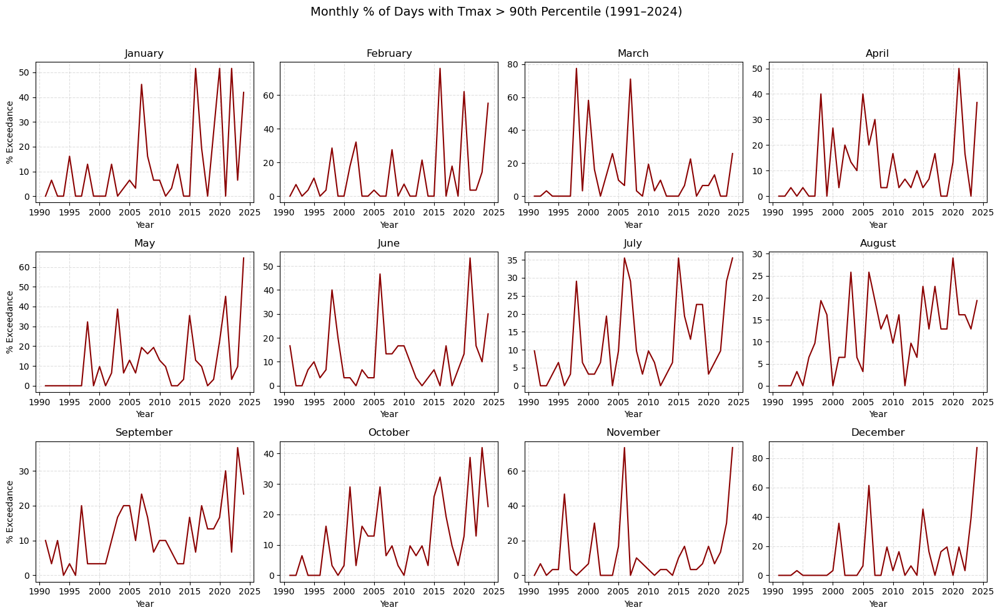

In [45]:
fig, axs = plt.subplots(3, 4, figsize=(16, 10), sharey=False)

for i, month in enumerate(monthly_exceedance.columns):
    ax = axs.flat[i]
    ax.plot(monthly_exceedance.index, monthly_exceedance[month], color='darkred')
    ax.set_title(f'{pd.to_datetime(str(month), format="%m").strftime("%B")}')
    ax.grid(True, linestyle='--', alpha=0.4)
    ax.set_xlabel('Year')
    if i % 4 == 0:
        ax.set_ylabel('% Exceedance')

plt.suptitle('Monthly % of Days with Tmax > 90th Percentile (1991–2024)', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [47]:
# Map months to seasons
season_map = {
    12: 'DJF', 1: 'DJF', 2: 'DJF',
    3: 'MAM', 4: 'MAM', 5: 'MAM',
    6: 'JJA', 7: 'JJA', 8: 'JJA',
    9: 'SON', 10: 'SON', 11: 'SON'
}

# Create a copy of the DataFrame and map month columns to seasons
monthly_exceedance_seasonal = monthly_exceedance.copy()
monthly_exceedance_seasonal.columns.name = None  # remove column name for safety
seasonal = pd.DataFrame()

for season in ['DJF', 'MAM', 'JJA', 'SON']:
    # Get months for the season
    months = [m for m, s in season_map.items() if s == season]
    # Average the corresponding columns
    seasonal[season] = monthly_exceedance[months].mean(axis=1)

# Now you have a DataFrame: seasonal[‘DJF’, ‘MAM’, ‘JJA’, ‘SON’] with years as index


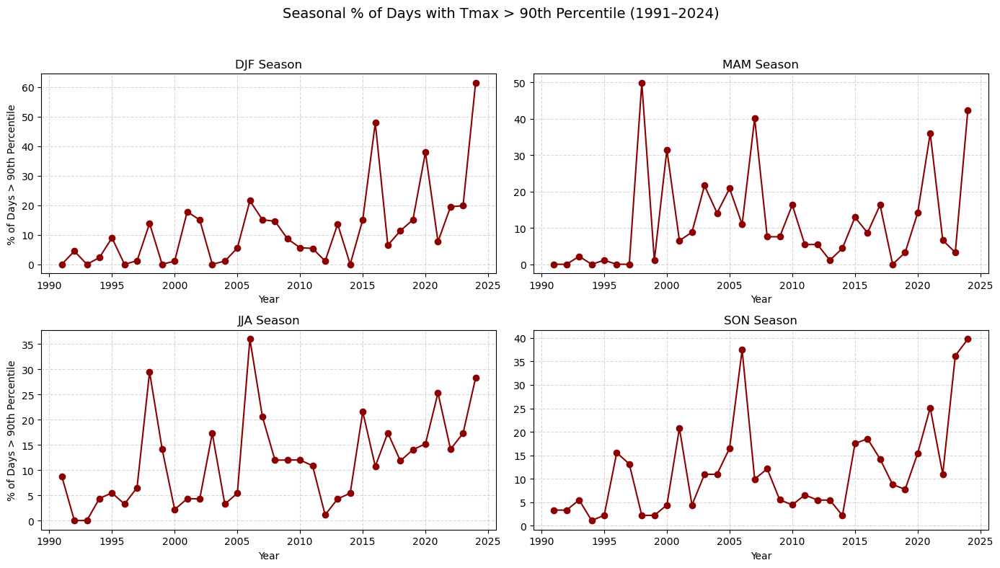

In [50]:
fig, axs = plt.subplots(2, 2, figsize=(14, 8), sharex=False, sharey=False)
seasons = ['DJF', 'MAM', 'JJA', 'SON']

for i, season in enumerate(seasons):
    ax = axs.flat[i]
    ax.plot(seasonal.index, seasonal[season], color='darkred', marker='o')
    ax.set_title(f'{season} Season', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xlabel('Year')
    if i in [0, 2]:
        ax.set_ylabel('% of Days > 90th Percentile')

plt.suptitle('Seasonal % of Days with Tmax > 90th Percentile (1991–2024)', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


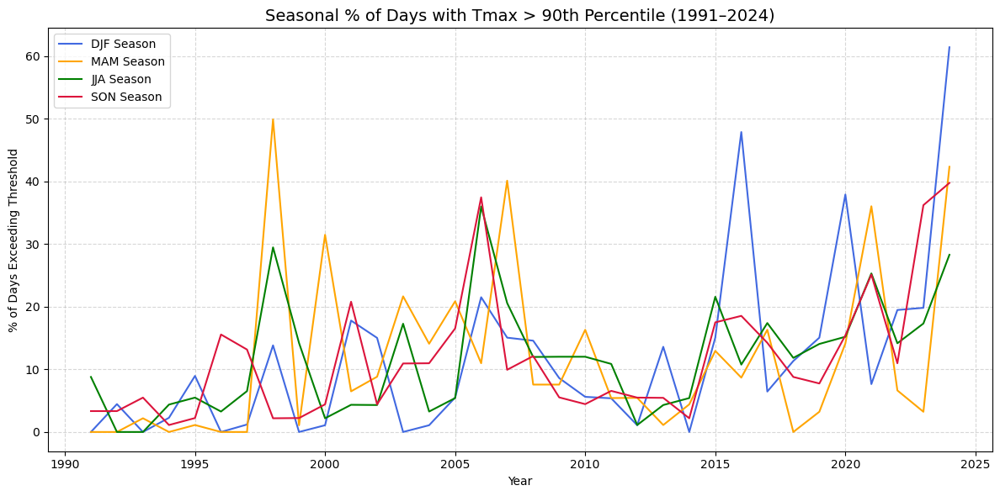

In [52]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Define colors for each season
season_colors = {
    'DJF': 'royalblue',
    'MAM': 'orange',
    'JJA': 'green',
    'SON': 'crimson'
}

# Plot each season
for season in ['DJF', 'MAM', 'JJA', 'SON']:
    plt.plot(
        seasonal.index,
        seasonal[season],
        label=f'{season} Season',
        color=season_colors[season]
        
    )

plt.title('Seasonal % of Days with Tmax > 90th Percentile (1991–2024)', fontsize=14)
plt.xlabel('Year')
plt.ylabel('% of Days Exceeding Threshold')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


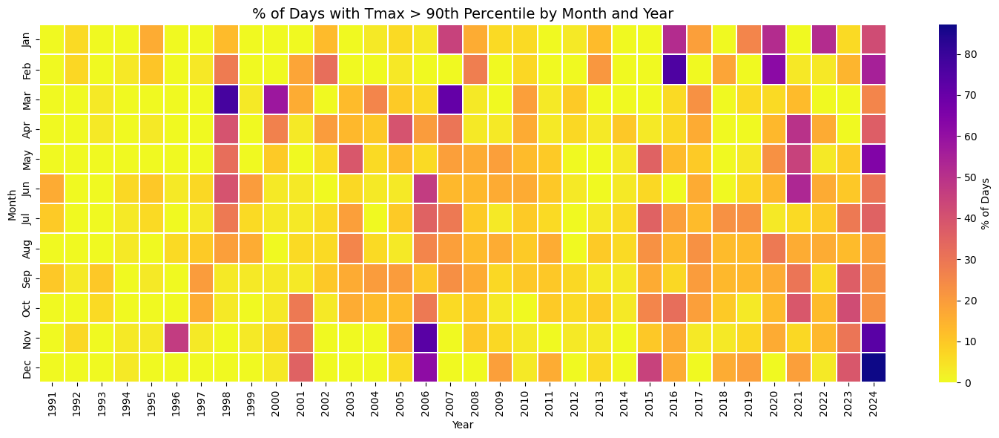

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))
sns.heatmap(
    monthly_exceedance.T,          # Transpose: months on y, years on x
    cmap='plasma_r',
    fmt=".1f",
    linewidths=0.2,
    cbar_kws={'label': '% of Days'},
    yticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
)

plt.title('% of Days with Tmax > 90th Percentile by Month and Year', fontsize=14)
plt.xlabel('Year')
plt.ylabel('Month')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [31]:
# 6. Convert to DataFrame and compute yearly exceedance %
df_min = exceed_min.to_dataframe(name='exceed').reset_index()
df_min['year'] = df_min['valid_time'].dt.year
annual_exceedance_min = df_min.groupby('year')['exceed'].mean() * 100

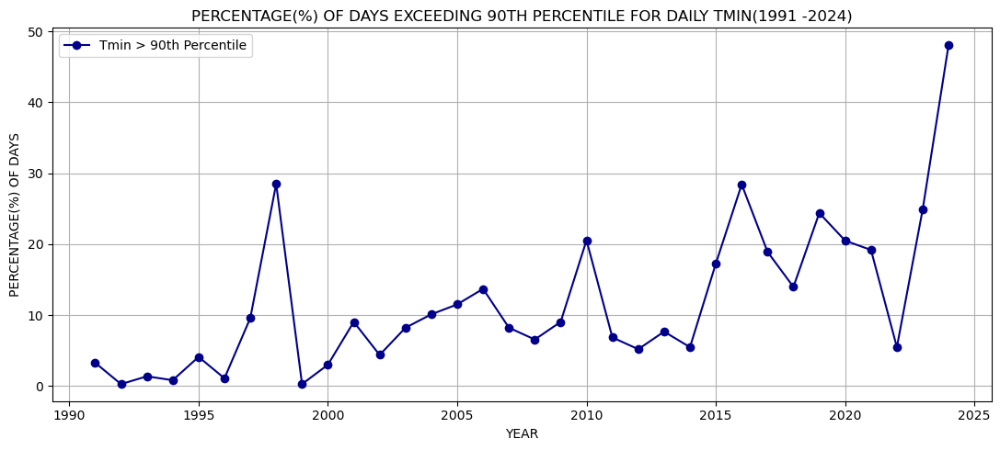

In [33]:
# 7. Plot
plt.figure(figsize=(11, 5))
plt.plot(annual_exceedance_min.index, annual_exceedance_min.values, marker='o', color='darkblue', label='Tmin > 90th Percentile')
plt.title('PERCENTAGE(%) OF DAYS EXCEEDING 90TH PERCENTILE FOR DAILY TMIN(1991 -2024)')
plt.xlabel('YEAR')
plt.ylabel('PERCENTAGE(%) OF DAYS')
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

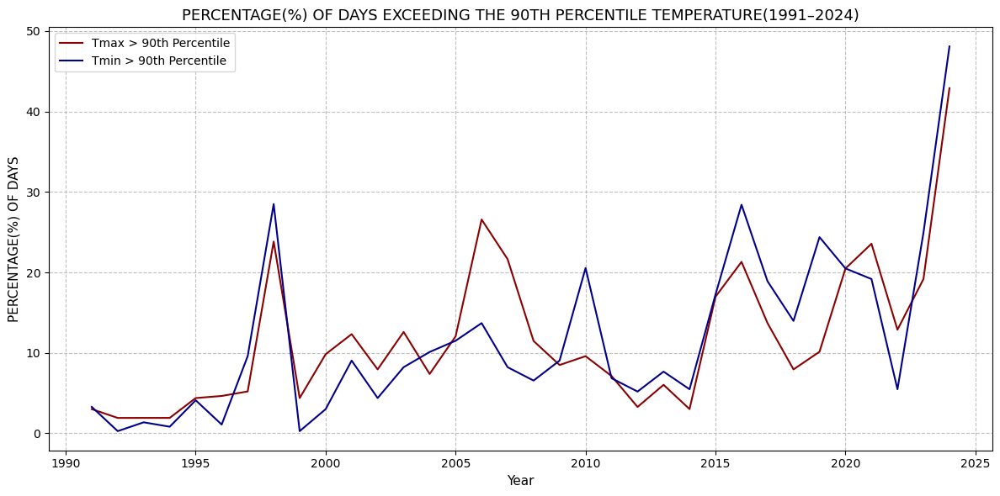

In [70]:


plt.figure(figsize=(12, 6))

# Plot Tmax
plt.plot(
    annual_exceedance.index,
    annual_exceedance.values,
    
    color='darkred',
    label='Tmax > 90th Percentile'
)

# Plot Tmin
plt.plot(
    annual_exceedance_min.index,
    annual_exceedance_min.values,
    
    color='darkblue',
    label='Tmin > 90th Percentile'
)

# Final touches
plt.title('PERCENTAGE(%) OF DAYS EXCEEDING THE 90TH PERCENTILE TEMPERATURE(1991–2024)', fontsize=13)
plt.xlabel('Year', fontsize=11)
plt.ylabel('PERCENTAGE(%) OF DAYS', fontsize=11)
plt.grid(True, linestyle='--', alpha=0.8)
plt.legend()
plt.tight_layout()
plt.show()
